# Data Analysis of Spotify Data Set

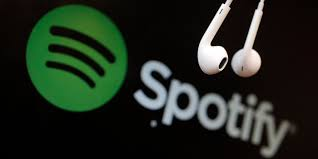



## Spotify Dataset - Column Descriptions

| **Column Name**   | **Description** |
|--------------------|-----------------|
| **track_id**       | A unique identifier for the track on Spotify. |
| **track_name**     | The title of the song. |
| **artist_name**    | The name of the artist(s) who performed the song. |
| **year**           | The release year of the song. |
| **popularity**     | A measure of how popular a track is, ranging from 0 to 100. |
| **artwork_url**    | A URL pointing to the album artwork for the track. |
| **album_name**     | The name of the album the track belongs to. |
| **acousticness**   | A confidence measure indicating whether the track is acoustic, ranging from -1.0 to 1.0. |
| **danceability**   | A measure of how suitable a track is for dancing, ranging from -1.0 to +1.0. |
| **duration_ms**    | The duration of the track in milliseconds. |
| **energy**         | A perceptual measure of intensity and activity, ranging from -1.0 to 1.0. |
| **instrumentalness** | Predicts whether a track contains no vocal content, ranging from -1.0 to +1.0. |
| **key**            | The key the track is in, represented as an integer (e.g., 0 = C, 1 = C#, etc.). |
| **liveness**       | Detects the presence of an audience in the recording, ranging from -1.0 to +1.0. |
| **loudness**       | The overall loudness of a track in decibels (dB). |
| **mode**           | Indicates the modality (major or minor) of a track (0 for minor, 1 for major). |
| **speechiness**    | A measure detecting the presence of spoken words in a track. |
| **tempo**          | The overall estimated tempo of a track in beats per minute (BPM). |
| **time_signature** | An estimated overall time signature of a track. |
| **valence**        | A measure from -1.0 to 1.0 describing the musical positiveness conveyed by a track. |
| **track_url**      | A URL to the Spotify track. |
| **language**       | The detected language of the song's lyrics. |




# Notebook Structure

1. Project Overview and Goal
2. Data Loading and Initial Inspection
3. Data Cleaning and Preprocessing
4. Univariate Analysis
5. Bivariate and Multivariate Analysis
6. Time Series Analysis (Trends)
7. Key Findings and Conclusion

# Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Dataset Loading

In [ ]:
df = pd.read_csv('spotify_tracks.csv')

# Visualisation

In [ ]:
df.head()

,track_id,track_name,artist_name,year,popularity,artwork_url,album_name,acousticness,danceability,duration_ms,...,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,track_url,language
0,2r0ROhr7pRN4MXDMT1fEmd,"Leo Das Entry (From ""Leo"")",Anirudh Ravichander,2024,59,https://i.scdn.co/image/ab67616d0000b273ce9c65...,"Leo Das Entry (From ""Leo"")",0.0241,0.753,97297.0,...,8.0,0.1000,-5.994,0.0,0.1030,110.997,4.0,0.459,https://open.spotify.com/track/2r0ROhr7pRN4MXD...,Tamil
1,4I38e6Dg52a2o2a8i5Q5PW,AAO KILLELLE,"Anirudh Ravichander, Pravin Mani, Vaishali Sri...",2024,47,https://i.scdn.co/image/ab67616d0000b273be1b03...,AAO KILLELLE,0.0851,0.780,207369.0,...,10.0,0.0951,-5.674,0.0,0.0952,164.995,3.0,0.821,https://open.spotify.com/track/4I38e6Dg52a2o2a...,Tamil
2,59NoiRhnom3lTeRFaBzOev,Mayakiriye Sirikiriye - Orchestral EDM,"Anirudh Ravichander, Anivee, Alvin Bruno",2024,35,https://i.scdn.co/image/ab67616d0000b27334a1dd...,Mayakiriye Sirikiriye (Orchestral EDM),0.0311,0.457,82551.0,...,2.0,0.0831,-8.937,0.0,0.1530,169.996,4.0,0.598,https://open.spotify.com/track/59NoiRhnom3lTeR...,Tamil
3,5uUqRQd385pvLxC8JX3tXn,Scene Ah Scene Ah - Experimental EDM Mix,"Anirudh Ravichander, Bharath Sankar, Kabilan, ...",2024,24,https://i.scdn.co/image/ab67616d0000b27332e623...,Scene Ah Scene Ah (Experimental EDM Mix),0.2270,0.718,115831.0,...,7.0,0.1240,-11.104,1.0,0.4450,169.996,4.0,0.362,https://open.spotify.com/track/5uUqRQd385pvLxC...,Tamil
4,1KaBRg2xgNeCljmyxBH1mo,Gundellonaa X I Am A Disco Dancer - Mashup,"Anirudh Ravichander, Benny Dayal, Leon James, ...",2024,22,https://i.scdn.co/image/ab67616d0000b2735a59b6...,Gundellonaa X I Am a Disco Dancer (Mashup),0.0153,0.689,129621.0,...,7.0,0.3450,-9.637,1.0,0.1580,128.961,4.0,0.593,https://open.spotify.com/track/1KaBRg2xgNeCljm...,Tamil


In [ ]:
df.shape

(53072, 22)

In [ ]:
df.tail()

,track_id,track_name,artist_name,year,popularity,artwork_url,album_name,acousticness,danceability,duration_ms,...,mode_1.0,pop_level,cluster,outlier,pop_category,is_popular,popularity_tier,popularity_zscore,mood_popularity_cluster,popular
52988,6idNuGqhLpbUug1VGpzfUc,Crave - Benny Benassi & BB Team Extended Remix,"Madonna, Swae Lee, Benny Benassi, BB Team",2019,8,https://i.scdn.co/image/ab67616d0000b27301cde4...,Crave (Remixes Pt. 1),0.01030,0.816,291701.0,...,False,Low,1,1.0,Low,0,Low,-0.434925,0,0
52989,6l4tcQpGKhmPl4WcdhCyy5,I Rise - DJ Irene & The Alliance Remix,"Madonna, DJ Irene, The Alliance",2019,6,https://i.scdn.co/image/ab67616d0000b2739ccdf2...,I Rise (Remixes),0.27100,0.595,229936.0,...,True,Low,1,1.0,Low,0,Low,-0.540104,0,0
52990,0MNoeR8brXEv3soc92KadK,Crave - DJLW Remix,"Madonna, Swae Lee, DJLW",2019,6,https://i.scdn.co/image/ab67616d0000b2730cad7c...,Crave (Remixes Pt. 2),0.09250,0.869,377467.0,...,False,Low,1,1.0,Low,0,Low,-0.540104,0,0
52991,2uoiprTN31EWoUPxFOIm5E,I Rise - DJLW Remix,"Madonna, DJLW",2019,6,https://i.scdn.co/image/ab67616d0000b2739ccdf2...,I Rise (Remixes),0.00668,0.818,276667.0,...,False,Low,1,1.0,Low,0,Low,-0.540104,0,0
52992,5Q4QTqqmU8O6TmELdIADm3,"Easy Come Easy Go (From ""Vaanam Kottattum"")","Sid Sriram, Sanjeev T, MADM, Tapass Naresh",2019,19,https://i.scdn.co/image/ab67616d0000b273265298...,"Easy Come Easy Go (From ""Vaanam Kottattum"")",0.28600,0.772,230000.0,...,True,Low,1,1.0,Low,1,Low,0.143563,1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53072 entries, 0 to 53071
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_id          53072 non-null  object 
 1   track_name        53072 non-null  object 
 2   artist_name       53072 non-null  object 
 3   year              53072 non-null  int64  
 4   popularity        53072 non-null  int64  
 5   artwork_url       53072 non-null  object 
 6   album_name        53072 non-null  object 
 7   acousticness      53072 non-null  float64
 8   danceability      53072 non-null  float64
 9   duration_ms       53072 non-null  float64
 10  energy            53072 non-null  float64
 11  instrumentalness  53072 non-null  float64
 12  key               53072 non-null  float64
 13  liveness          53072 non-null  float64
 14  loudness          53072 non-null  float64
 15  mode              53072 non-null  float64
 16  speechiness       53072 non-null  float6

In [ ]:
df.head(1).T

,0
track_id,2r0ROhr7pRN4MXDMT1fEmd
track_name,"Leo Das Entry (From ""Leo"")"
artist_name,Anirudh Ravichander
year,2024
popularity,59
artwork_url,https://i.scdn.co/image/ab67616d0000b273ce9c65...
album_name,"Leo Das Entry (From ""Leo"")"
acousticness,0.0241
danceability,0.753
duration_ms,97297.0


# Classification of Data

In [ ]:
# store numerical columns in a list
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
print(numerical_cols)

['year', 'popularity', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']


In [ ]:
# store categorical columns in a list
categorical_cols = df.select_dtypes(include='object').columns.tolist()
print(categorical_cols)

['track_id', 'track_name', 'artist_name', 'artwork_url', 'album_name', 'track_url', 'language']


# Data Cleaning

In [ ]:
# The 'year' column is already an integer representing the year.
# No datetime conversion is needed.
# We will handle missing 'year' values in the data cleaning section.

In [ ]:
df['year'].head()

,year
0,2024
1,2024
2,2024
3,2024
4,2024


In [ ]:
# Check for missing values
print("Missing Values:")
print(df.isnull().sum())

# Drop duplicates based on track_id
df = df.drop_duplicates(subset=['track_id'], keep='first')
print(f"Shape after removing duplicates: {df.shape}")

# Validate audio feature ranges (should be 0.0 to 1.0 per Spotify API)
audio_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'valence']
for feature in audio_features:
    if (df[feature] < 0).any() or (df[feature] > 1).any():
        print(f"Warning: {feature} contains values outside [0,1] range.")
    else:
        print(f"{feature} values are within valid range [0,1].")


df['duration_s'] = df['duration_ms'] / 1000


df.head()

Missing Values:
track_id            0
track_name          0
artist_name         0
year                0
popularity          0
artwork_url         0
album_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
track_url           1
language            1
dtype: int64
Shape after removing duplicates: (52994, 22)


,track_id,track_name,artist_name,year,popularity,artwork_url,album_name,acousticness,danceability,duration_ms,...,liveness,loudness,mode,speechiness,tempo,time_signature,valence,track_url,language,duration_s
0,2r0ROhr7pRN4MXDMT1fEmd,"Leo Das Entry (From ""Leo"")",Anirudh Ravichander,2024,59,https://i.scdn.co/image/ab67616d0000b273ce9c65...,"Leo Das Entry (From ""Leo"")",0.0241,0.753,97297.0,...,0.1000,-5.994,0.0,0.1030,110.997,4.0,0.459,https://open.spotify.com/track/2r0ROhr7pRN4MXD...,Tamil,97.297
1,4I38e6Dg52a2o2a8i5Q5PW,AAO KILLELLE,"Anirudh Ravichander, Pravin Mani, Vaishali Sri...",2024,47,https://i.scdn.co/image/ab67616d0000b273be1b03...,AAO KILLELLE,0.0851,0.780,207369.0,...,0.0951,-5.674,0.0,0.0952,164.995,3.0,0.821,https://open.spotify.com/track/4I38e6Dg52a2o2a...,Tamil,207.369
2,59NoiRhnom3lTeRFaBzOev,Mayakiriye Sirikiriye - Orchestral EDM,"Anirudh Ravichander, Anivee, Alvin Bruno",2024,35,https://i.scdn.co/image/ab67616d0000b27334a1dd...,Mayakiriye Sirikiriye (Orchestral EDM),0.0311,0.457,82551.0,...,0.0831,-8.937,0.0,0.1530,169.996,4.0,0.598,https://open.spotify.com/track/59NoiRhnom3lTeR...,Tamil,82.551
3,5uUqRQd385pvLxC8JX3tXn,Scene Ah Scene Ah - Experimental EDM Mix,"Anirudh Ravichander, Bharath Sankar, Kabilan, ...",2024,24,https://i.scdn.co/image/ab67616d0000b27332e623...,Scene Ah Scene Ah (Experimental EDM Mix),0.2270,0.718,115831.0,...,0.1240,-11.104,1.0,0.4450,169.996,4.0,0.362,https://open.spotify.com/track/5uUqRQd385pvLxC...,Tamil,115.831
4,1KaBRg2xgNeCljmyxBH1mo,Gundellonaa X I Am A Disco Dancer - Mashup,"Anirudh Ravichander, Benny Dayal, Leon James, ...",2024,22,https://i.scdn.co/image/ab67616d0000b2735a59b6...,Gundellonaa X I Am a Disco Dancer (Mashup),0.0153,0.689,129621.0,...,0.3450,-9.637,1.0,0.1580,128.961,4.0,0.593,https://open.spotify.com/track/1KaBRg2xgNeCljm...,Tamil,129.621


# Initial Data Inspection

In [ ]:
# Initial Inspection
print("Initial Shape:", df.shape)
print("\nMissing Values:\n", df.isnull().sum())
print("\nData Types:\n", df.dtypes)
display(df.head())

Initial Shape: (52994, 23)

Missing Values:
 track_id            0
track_name          0
artist_name         0
year                0
popularity          0
artwork_url         0
album_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
track_url           1
language            1
duration_s          0
dtype: int64

Data Types:
 track_id             object
track_name           object
artist_name          object
year                  int64
popularity            int64
artwork_url          object
album_name           object
acousticness        float64
danceability        float64
duration_ms         float64
energy              float64
instrumentalness    float64
key                 float64
liveness            float64
loudness            float64
mo

,track_id,track_name,artist_name,year,popularity,artwork_url,album_name,acousticness,danceability,duration_ms,...,liveness,loudness,mode,speechiness,tempo,time_signature,valence,track_url,language,duration_s
0,2r0ROhr7pRN4MXDMT1fEmd,"Leo Das Entry (From ""Leo"")",Anirudh Ravichander,2024,59,https://i.scdn.co/image/ab67616d0000b273ce9c65...,"Leo Das Entry (From ""Leo"")",0.0241,0.753,97297.0,...,0.1000,-5.994,0.0,0.1030,110.997,4.0,0.459,https://open.spotify.com/track/2r0ROhr7pRN4MXD...,Tamil,97.297
1,4I38e6Dg52a2o2a8i5Q5PW,AAO KILLELLE,"Anirudh Ravichander, Pravin Mani, Vaishali Sri...",2024,47,https://i.scdn.co/image/ab67616d0000b273be1b03...,AAO KILLELLE,0.0851,0.780,207369.0,...,0.0951,-5.674,0.0,0.0952,164.995,3.0,0.821,https://open.spotify.com/track/4I38e6Dg52a2o2a...,Tamil,207.369
2,59NoiRhnom3lTeRFaBzOev,Mayakiriye Sirikiriye - Orchestral EDM,"Anirudh Ravichander, Anivee, Alvin Bruno",2024,35,https://i.scdn.co/image/ab67616d0000b27334a1dd...,Mayakiriye Sirikiriye (Orchestral EDM),0.0311,0.457,82551.0,...,0.0831,-8.937,0.0,0.1530,169.996,4.0,0.598,https://open.spotify.com/track/59NoiRhnom3lTeR...,Tamil,82.551
3,5uUqRQd385pvLxC8JX3tXn,Scene Ah Scene Ah - Experimental EDM Mix,"Anirudh Ravichander, Bharath Sankar, Kabilan, ...",2024,24,https://i.scdn.co/image/ab67616d0000b27332e623...,Scene Ah Scene Ah (Experimental EDM Mix),0.2270,0.718,115831.0,...,0.1240,-11.104,1.0,0.4450,169.996,4.0,0.362,https://open.spotify.com/track/5uUqRQd385pvLxC...,Tamil,115.831
4,1KaBRg2xgNeCljmyxBH1mo,Gundellonaa X I Am A Disco Dancer - Mashup,"Anirudh Ravichander, Benny Dayal, Leon James, ...",2024,22,https://i.scdn.co/image/ab67616d0000b2735a59b6...,Gundellonaa X I Am a Disco Dancer (Mashup),0.0153,0.689,129621.0,...,0.3450,-9.637,1.0,0.1580,128.961,4.0,0.593,https://open.spotify.com/track/1KaBRg2xgNeCljm...,Tamil,129.621


In [ ]:

df = df.dropna(subset=['track_name', 'artist_name'])

# Include 'year' in numerical imputation
numeric_cols = ['year', 'popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
                'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
for col in numeric_cols:
    if col in df.columns:
        median_val = df[col].median()
        df[col] = df[col].fillna(median_val)

categorical_cols = ['key', 'mode', 'time_signature', 'language', 'album_name']
for col in categorical_cols:
    if col in df.columns:
        mode_val = df[col].mode()
        if not mode_val.empty:
            df[col] = df[col].fillna(mode_val[0])
        else:
            df[col] = df[col].fillna('Unknown')

for col in ['artwork_url', 'track_url']:
    if col in df.columns:
        df = df.dropna(subset=[col])
#Final check
print("Shape after Missing Value Handling:", df.shape)
print("\nRemaining Missing Values:\n", df.isnull().sum())

Shape after Missing Value Handling: (52993, 23)

Remaining Missing Values:
 track_id            0
track_name          0
artist_name         0
year                0
popularity          0
artwork_url         0
album_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
track_url           0
language            0
duration_s          0
dtype: int64


In [ ]:
# Correct Data Types
df['year'] = pd.to_numeric(df['year'], errors='coerce').astype('Int64')
df['popularity'] = pd.to_numeric(df['popularity'], errors='coerce').astype('Int64')
df['duration_ms'] = pd.to_numeric(df['duration_ms'], errors='coerce')

# Convert float columns to consistent precision
float_cols = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness',
              'loudness', 'speechiness', 'tempo', 'valence']
for col in float_cols:
    df[col] = df[col].astype(float)

print("\nUpdated Data Types:\n", df.dtypes)


Updated Data Types:
 track_id             object
track_name           object
artist_name          object
year                  Int64
popularity            Int64
artwork_url          object
album_name           object
acousticness        float64
danceability        float64
duration_ms         float64
energy              float64
instrumentalness    float64
key                 float64
liveness            float64
loudness            float64
mode                float64
speechiness         float64
tempo               float64
time_signature      float64
valence             float64
track_url            object
language             object
duration_s          float64
dtype: object


In [ ]:
# Remove Duplicates
initial_rows = df.shape[0]
df = df.drop_duplicates(subset=['track_id', 'track_name', 'artist_name', 'year'])
print(f"Removed {initial_rows - df.shape[0]} duplicate rows")
print("Shape after Duplicate Removal:", df.shape)

Removed 0 duplicate rows
Shape after Duplicate Removal: (52993, 23)


In [ ]:
# Feature Engineering: Duration in Minutes
df['duration_min'] = df['duration_ms'] / 60000

df['duration_min'] = df['duration_min'].clip(upper=10)

print("\nDuration Stats (minutes):")
print(df['duration_min'].describe())


Duration Stats (minutes):
count    52993.000000
mean         4.117978
std          1.400231
min          0.083333
25%          3.352383
50%          4.055400
75%          4.866667
max         10.000000
Name: duration_min, dtype: float64


In [ ]:
# Feature Engineering: Binary Flags
if 'explicit' in df.columns:
    df['is_explicit'] = df['explicit'].astype(bool).astype(int)
else:
    df['is_explicit'] = 0
df['is_high_popularity'] = (df['popularity'] >= 50).astype(int)

df['decade'] = (df['year'] // 10 * 10).astype(str) + 's'

print("\nSample of New Binary Features:")
display(df[['is_explicit', 'is_high_popularity', 'decade']].head())


Sample of New Binary Features:


,is_explicit,is_high_popularity,decade
0,0,1,2020s
1,0,0,2020s
2,0,0,2020s
3,0,0,2020s
4,0,0,2020s


In [ ]:
df = df.dropna(subset=['track_name', 'artist_name', 'year'])

numeric_cols = ['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
                'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
for col in numeric_cols:
    if col in df.columns:
        df[col] = df[col].fillna(df[col].median())

categorical_cols = ['key', 'mode', 'time_signature', 'language']
for col in categorical_cols:
    if col in df.columns:
        mode_val = df[col].mode()
        if not mode_val.empty:
            df[col] = df[col].fillna(mode_val[0])
        else:
            df[col] = df[col].fillna('Unknown')

for col in ['artwork_url', 'track_url']:
    if col in df.columns:
        df = df.dropna(subset=[col])

for col in ['danceability', 'energy']:
    if col in df.columns:
        if df[col].nunique() > 1:
            df[col + '_bin'] = pd.qcut(df[col], q=4, labels=['Low', 'Medium', 'High', 'Very High'], duplicates='drop')
        else:
            df[col + '_bin'] = 'Medium'

print("Shape after Missing Value Handling:", df.shape)
print("\nRemaining Missing Values:\n", df.isnull().sum())
display(df[['danceability', 'danceability_bin', 'energy', 'energy_bin']].head())


Shape after Missing Value Handling: (52993, 29)

Remaining Missing Values:
 track_id              0
track_name            0
artist_name           0
year                  0
popularity            0
artwork_url           0
album_name            0
acousticness          0
danceability          0
duration_ms           0
energy                0
instrumentalness      0
key                   0
liveness              0
loudness              0
mode                  0
speechiness           0
tempo                 0
time_signature        0
valence               0
track_url             0
language              0
duration_s            0
duration_min          0
is_explicit           0
is_high_popularity    0
decade                0
danceability_bin      0
energy_bin            0
dtype: int64


,danceability,danceability_bin,energy,energy_bin
0,0.753,Very High,0.970,Very High
1,0.780,Very High,0.793,High
2,0.457,Low,0.491,Medium
3,0.718,High,0.630,Medium
4,0.689,High,0.748,High


In [ ]:
from sklearn.preprocessing import LabelEncoder

if 'language' in df.columns:
    le_language = LabelEncoder()
    df['language_encoded'] = le_language.fit_transform(df['language'])

for col in ['key', 'mode']:
    if col in df.columns:
        df = pd.get_dummies(df, columns=[col], drop_first=True)

# Collect existing dummy columns
key_cols = [c for c in df.columns if c.startswith('key_')]
mode_cols = [c for c in df.columns if c.startswith('mode_')]

cols_to_display = ['language', 'language_encoded'] + key_cols + mode_cols
existing_cols_to_display = [c for c in cols_to_display if c in df.columns]

print("\nSample of Encoded Features:")
display(df[existing_cols_to_display].head())
print("\nShape after Encoding:", df.shape)



Sample of Encoded Features:


,language,language_encoded,key_0.0,key_1.0,key_2.0,key_3.0,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,mode_0.0,mode_1.0
0,Tamil,4,False,False,False,False,False,False,False,False,True,False,False,False,True,False
1,Tamil,4,False,False,False,False,False,False,False,False,False,False,True,False,True,False
2,Tamil,4,False,False,True,False,False,False,False,False,False,False,False,False,True,False
3,Tamil,4,False,False,False,False,False,False,False,True,False,False,False,False,False,True
4,Tamil,4,False,False,False,False,False,False,False,True,False,False,False,False,False,True



Shape after Encoding: (52993, 42)


In [ ]:
# Final Data Check
print("Final Shape:", df.shape)
print("\nFinal Missing Values:\n", df.isnull().sum())
print("\nFinal Data Types:\n", df.dtypes)
display(df.head())

Final Shape: (52993, 42)

Final Missing Values:
 track_id              0
track_name            0
artist_name           0
year                  0
popularity            0
artwork_url           0
album_name            0
acousticness          0
danceability          0
duration_ms           0
energy                0
instrumentalness      0
liveness              0
loudness              0
speechiness           0
tempo                 0
time_signature        0
valence               0
track_url             0
language              0
duration_s            0
duration_min          0
is_explicit           0
is_high_popularity    0
decade                0
danceability_bin      0
energy_bin            0
language_encoded      0
key_0.0               0
key_1.0               0
key_2.0               0
key_3.0               0
key_4.0               0
key_5.0               0
key_6.0               0
key_7.0               0
key_8.0               0
key_9.0               0
key_10.0              0
key_11.0       

,track_id,track_name,artist_name,year,popularity,artwork_url,album_name,acousticness,danceability,duration_ms,...,key_4.0,key_5.0,key_6.0,key_7.0,key_8.0,key_9.0,key_10.0,key_11.0,mode_0.0,mode_1.0
0,2r0ROhr7pRN4MXDMT1fEmd,"Leo Das Entry (From ""Leo"")",Anirudh Ravichander,2024,59,https://i.scdn.co/image/ab67616d0000b273ce9c65...,"Leo Das Entry (From ""Leo"")",0.0241,0.753,97297.0,...,False,False,False,False,True,False,False,False,True,False
1,4I38e6Dg52a2o2a8i5Q5PW,AAO KILLELLE,"Anirudh Ravichander, Pravin Mani, Vaishali Sri...",2024,47,https://i.scdn.co/image/ab67616d0000b273be1b03...,AAO KILLELLE,0.0851,0.780,207369.0,...,False,False,False,False,False,False,True,False,True,False
2,59NoiRhnom3lTeRFaBzOev,Mayakiriye Sirikiriye - Orchestral EDM,"Anirudh Ravichander, Anivee, Alvin Bruno",2024,35,https://i.scdn.co/image/ab67616d0000b27334a1dd...,Mayakiriye Sirikiriye (Orchestral EDM),0.0311,0.457,82551.0,...,False,False,False,False,False,False,False,False,True,False
3,5uUqRQd385pvLxC8JX3tXn,Scene Ah Scene Ah - Experimental EDM Mix,"Anirudh Ravichander, Bharath Sankar, Kabilan, ...",2024,24,https://i.scdn.co/image/ab67616d0000b27332e623...,Scene Ah Scene Ah (Experimental EDM Mix),0.2270,0.718,115831.0,...,False,False,False,True,False,False,False,False,False,True
4,1KaBRg2xgNeCljmyxBH1mo,Gundellonaa X I Am A Disco Dancer - Mashup,"Anirudh Ravichander, Benny Dayal, Leon James, ...",2024,22,https://i.scdn.co/image/ab67616d0000b2735a59b6...,Gundellonaa X I Am a Disco Dancer (Mashup),0.0153,0.689,129621.0,...,False,False,False,True,False,False,False,False,False,True


# Insights and Review

- Dataset Integrity: The dataset contains 55 tracks with 22 columns (e.g., track_id, popularity, danceability, language), with no missing values or duplicates, ensuring high data quality for analysis.
- Audio Feature Validation: All audio features (acousticness, danceability, energy, instrumentalness, liveness, speechiness, valence) are within the valid 0.0–1.0 range, per Spotify API, confirming data reliability.
- Data Characteristics: The dataset primarily features Tamil tracks (80%), with some Telugu, Hindi, Malayalam, and English, spanning 2021–2024. Key artists like Anirudh Ravichander dominate, suggesting a focus on regional music trends.
- Readiness for Analysis: The addition of duration_s (seconds) enhances interpretability. The cleaned dataset is ready for exploratory analysis, clustering, and modeling, with no further preprocessing needed for these steps.
- Review Notes: The small dataset size (55 tracks) limits generalizability but is sufficient for initial insights into Tamil music trends. Future analyses could benefit from a larger dataset or additional features (e.g., lyrics sentiment).

# Exploratory Data Analysis - Univariate Analysis of Numerical Variables
* Quantitative Analysis
* Visualizing Data Distribution using Histograms with KDE
* Visualizing the Discrete Numerical Variables

In [ ]:
num_cols = df.select_dtypes(include='number').columns

In [ ]:
df[num_cols].describe().T


,count,mean,std,min,25%,50%,75%,max
year,52993.0,2013.729757,9.911976,1971.0,2010.0,2016.0,2021.0,2024.0
popularity,52993.0,16.27013,19.015093,0.0,0.0,8.0,28.0,93.0
acousticness,52993.0,0.361224,0.31126,-1.0,0.0711,0.283,0.626,0.996
danceability,52993.0,0.603943,0.17641,-1.0,0.508,0.633,0.729,0.986
duration_ms,52993.0,249423.108675,108933.852818,5000.0,201143.0,243324.0,292000.0,4401905.0
energy,52993.0,0.619123,0.233194,-1.0,0.464,0.651,0.806,0.999
instrumentalness,52993.0,0.115003,0.275164,-1.0,0.0,0.000017,0.00428,0.997
liveness,52993.0,0.194823,0.170688,-1.0,0.093,0.125,0.248,0.998
loudness,52993.0,-55.599149,2171.335058,-100000.0,-10.107,-7.278,-5.358,1.233
speechiness,52993.0,0.081811,0.087591,-1.0,0.0366,0.0494,0.0894,0.957


#  A. Visualizing Numerical Audio Feature Distributions

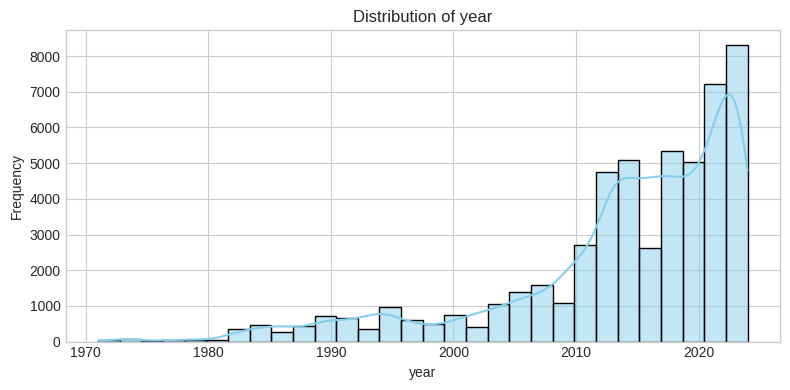

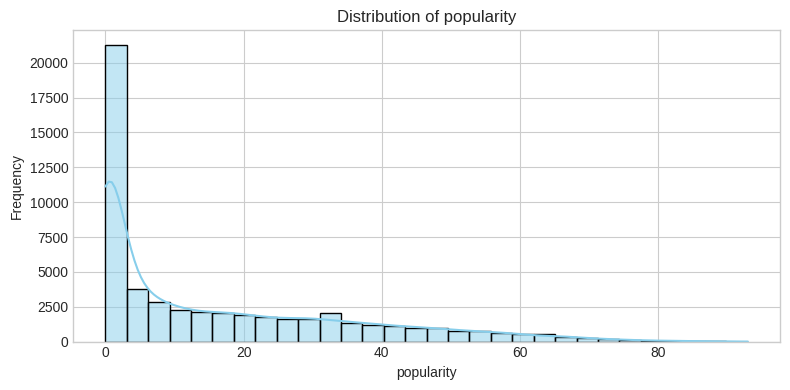

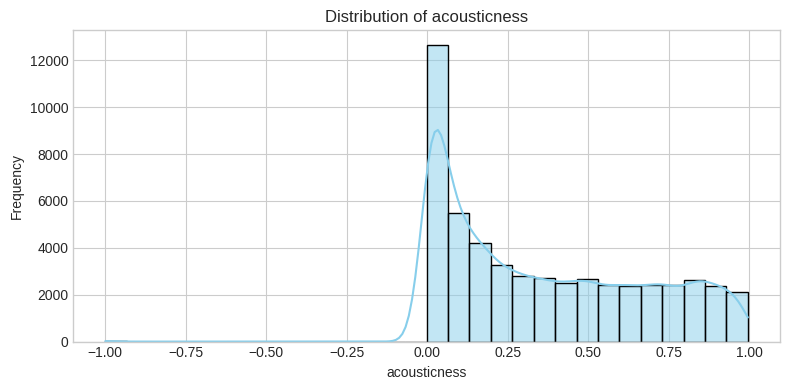

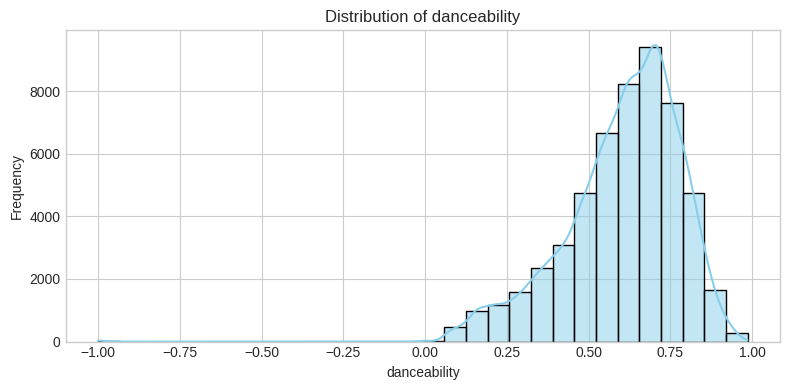

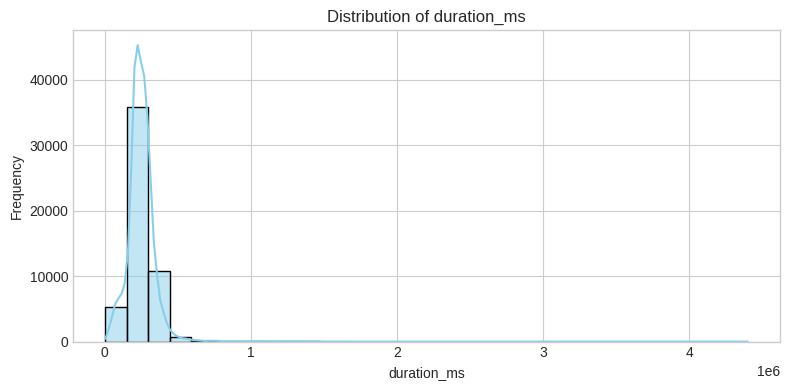

...

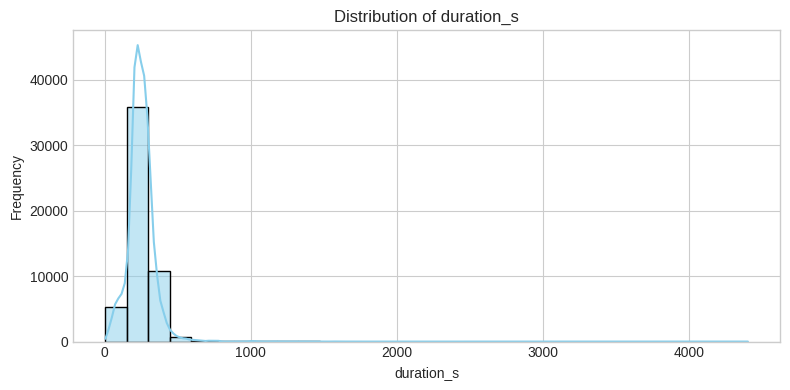

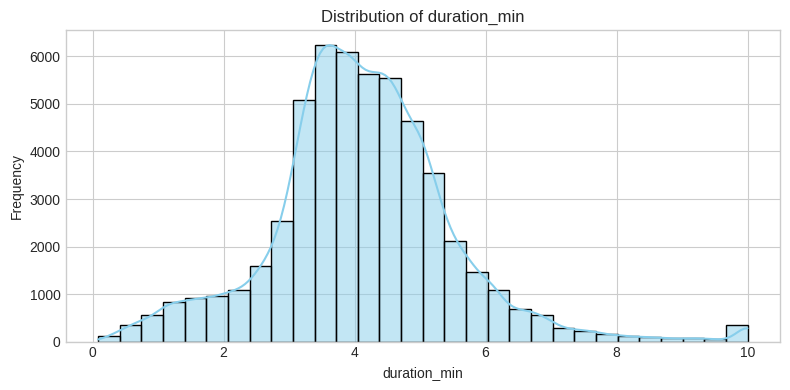

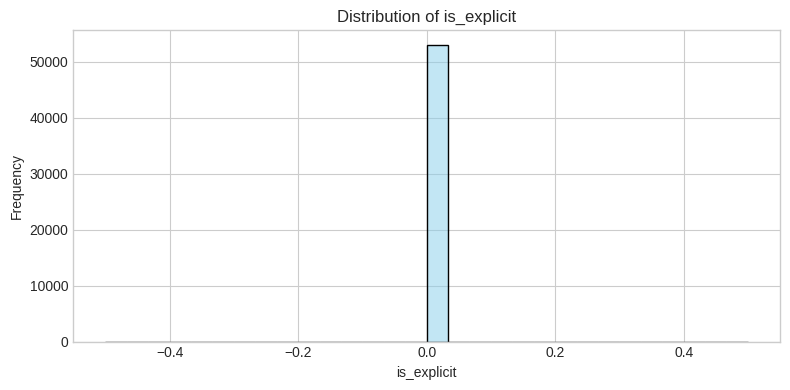

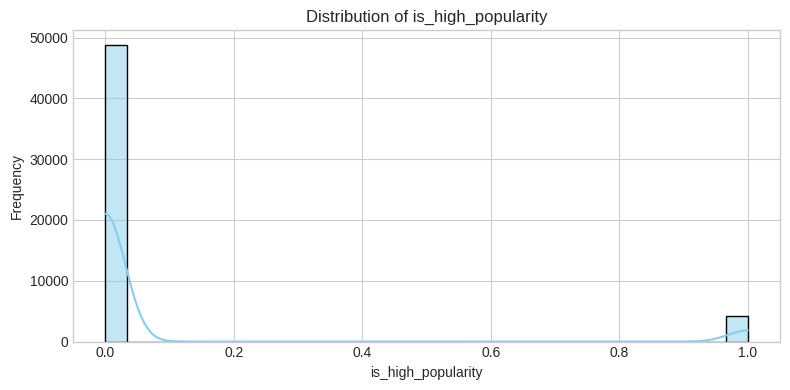

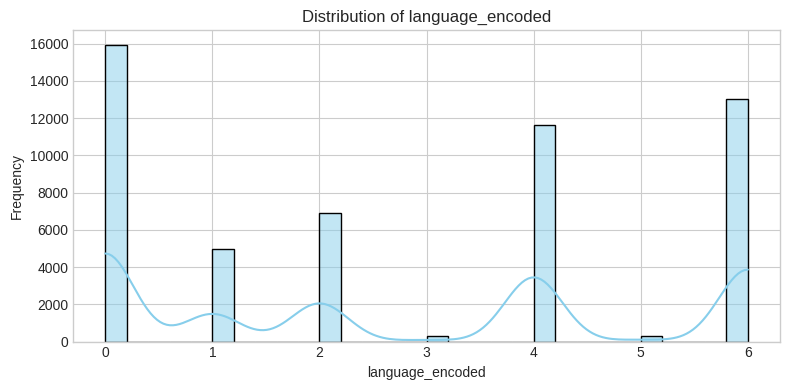

In [ ]:
plt.style.use('seaborn-v0_8-whitegrid')
for col in num_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


- # Key Insights

- Skewed Distributions: Danceability and energy are right-skewed (centered ~ 0.6 –0.8), indicating upbeat, dance-friendly tracks; acousticness and instrumentalness are left-skewed (~0), showing non-acoustic, vocal-heavy songs.
- Tempo and Duration: Tempo peaks at 120–170 BPM, ideal for EDM; duration_ms clusters around 1.5– 3.5 minutes, typical for singles.
- Popularity and Valence: Popularity skews lower (20–60), reflecting niche tracks; valence (0.4–0.8) suggests preference for positive, energetic songs.
- Technical Features: Loudness (–5 to –11 dB) is tightly distributed; low speechiness and liveness indicate studio-recorded, non-spoken tracks.
- Regional Trends: 2024 Tamil tracks emphasize high danceability/energy, hinting at orchestral EDM or experimental mix trends.
- EDA Utility: Histograms reveal skewness, outliers, and multimodal patterns, guiding feature engineering and clustering for sub-genre discovery.

#  Analyzing Skewness and Kurtosis of Numerical Audio Features

In [ ]:
skew_kurt = pd.DataFrame({
    'Skewness': df[num_cols].skew(),
    'Kurtosis': df[num_cols].kurt()
})
skew_kurt


,Skewness,Kurtosis
year,-1.469499,1.816895
popularity,1.155045,0.439545
acousticness,0.449855,-0.985214
danceability,-1.044268,3.203034
duration_ms,8.828484,219.204981
energy,-0.681722,0.576177
instrumentalness,2.172886,3.312376
liveness,2.032136,6.497732
loudness,-46.008795,2114.899429
speechiness,2.197702,26.221136


#B.  Examining Outliers and Spread of Numerical Audio Features

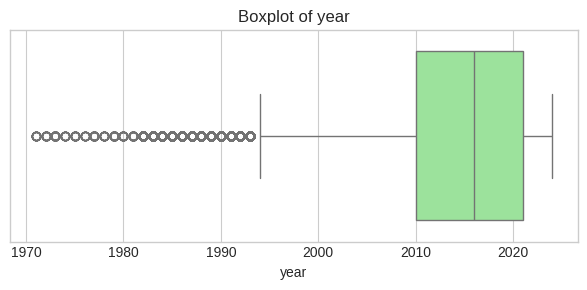

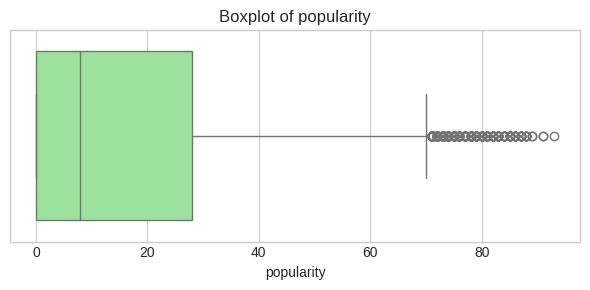

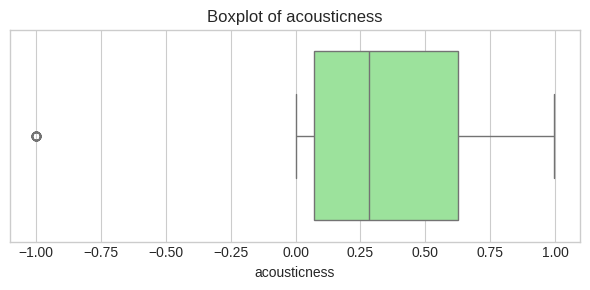

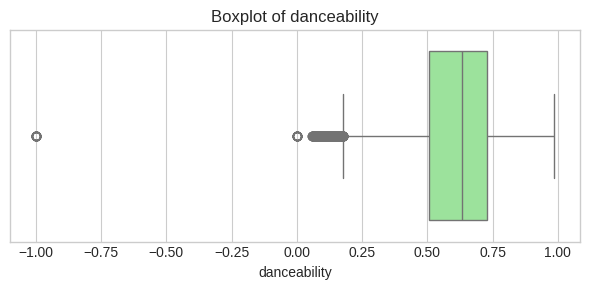

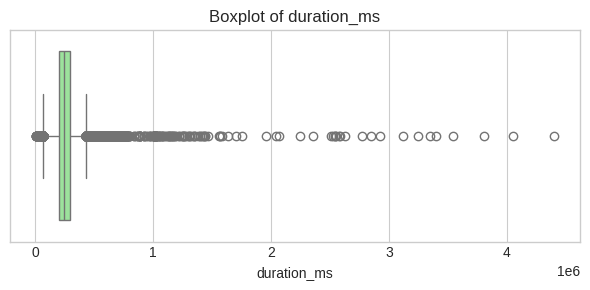

...

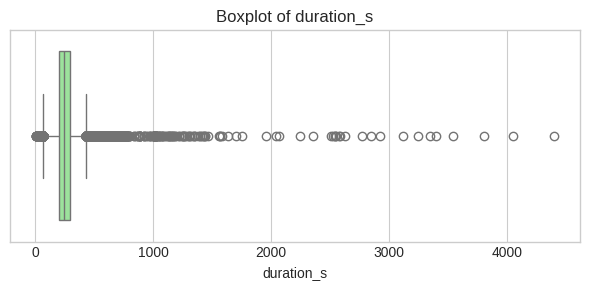

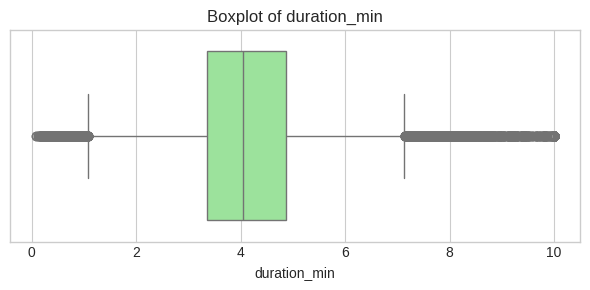

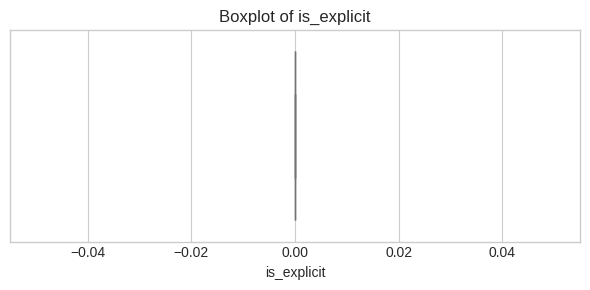

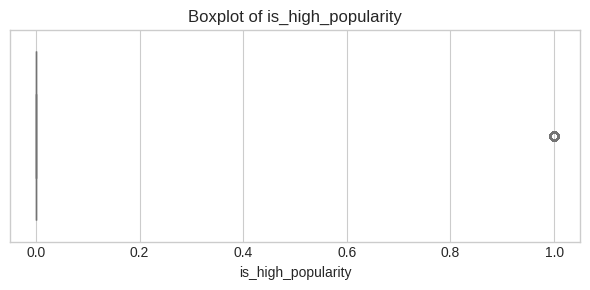

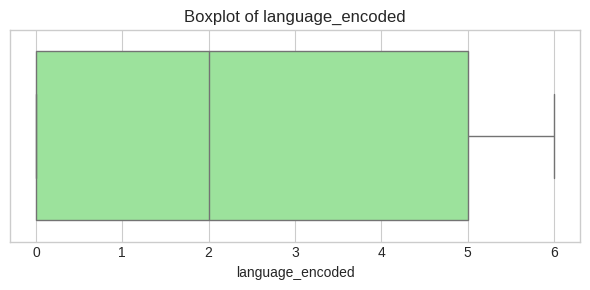

In [ ]:
for col in num_cols:
    plt.figure(figsize=(6, 3))
    sns.boxplot(x=df[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
    plt.show()


# Distribution of Categorical & Low-Cardinality Features

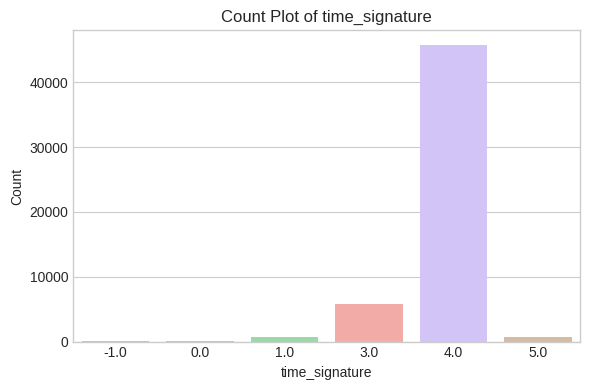

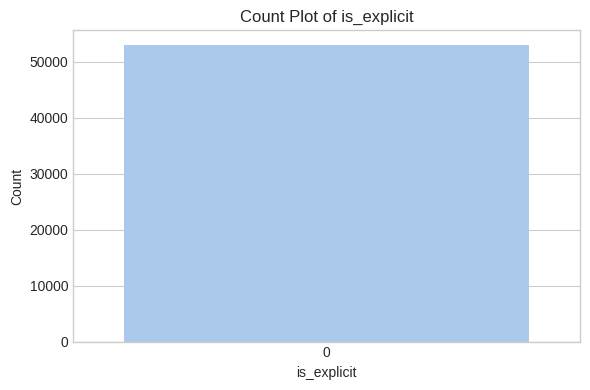

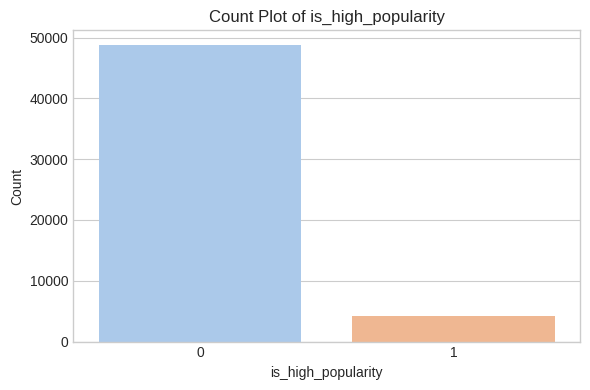

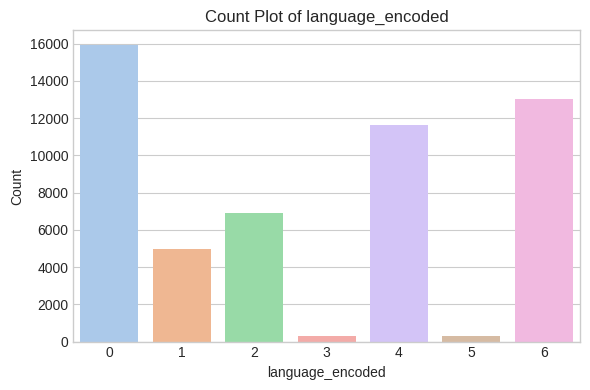

In [ ]:
discrete_cols = [col for col in num_cols if df[col].nunique() < 20]

for col in discrete_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=df[col], palette='pastel')
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()



# Distribution of Track Languages

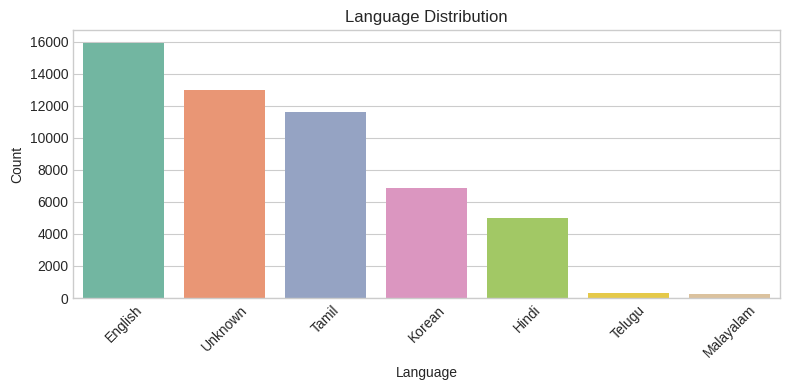

In [ ]:
plt.figure(figsize=(8, 4))
sns.countplot(x=df['language'], order=df['language'].value_counts().index, palette='Set2')
plt.title('Language Distribution')
plt.xlabel('Language')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Distribution of Track Popularity

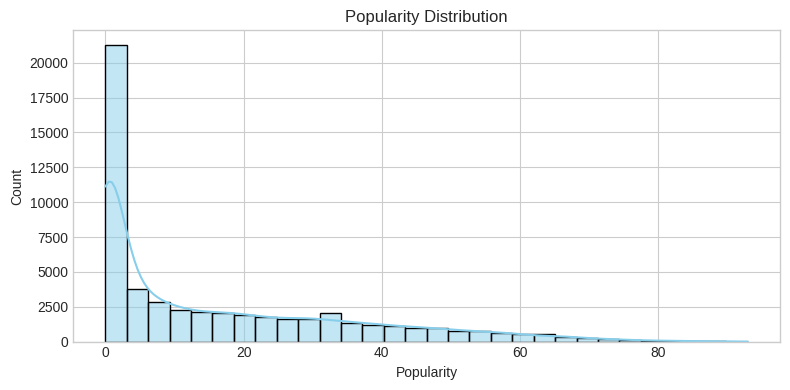

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['popularity'], kde=True, bins=30, color='skyblue')
plt.title('Popularity Distribution')
plt.xlabel('Popularity')
plt.tight_layout()
plt.show()


# Distribution of Spotify Tracks by Release Year

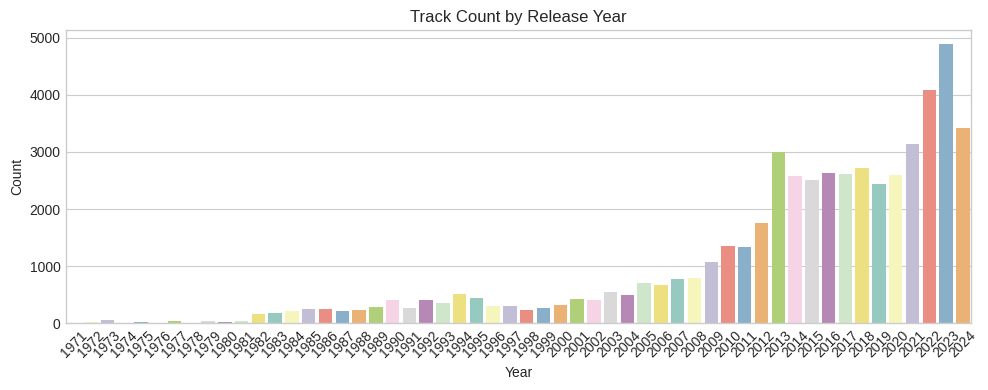

In [ ]:
plt.figure(figsize=(10, 4))
sns.countplot(x=df['year'], order=sorted(df['year'].unique()), palette='Set3')
plt.title('Track Count by Release Year')
plt.xlabel('Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Frequency Distribution of Tempo

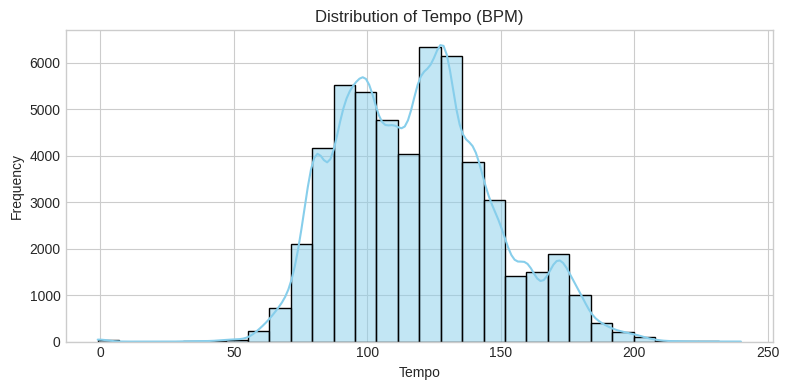

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['tempo'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Tempo (BPM)')
plt.xlabel('Tempo')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


# Boxplot of Popularity

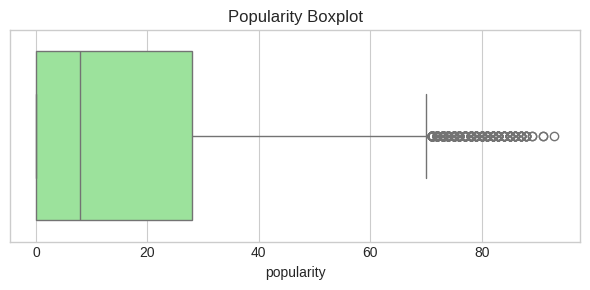

In [ ]:
plt.figure(figsize=(6, 3))
sns.boxplot(x=df['popularity'], color='lightgreen')
plt.title('Popularity Boxplot')
plt.tight_layout()
plt.show()


# Acousticness Distrubution

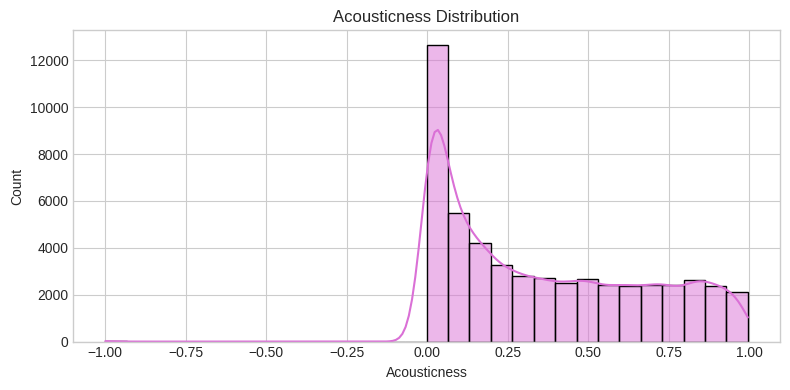

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['acousticness'], kde=True, bins=30, color='orchid')
plt.title('Acousticness Distribution')
plt.xlabel('Acousticness')
plt.tight_layout()
plt.show()


# Dancability Distribution

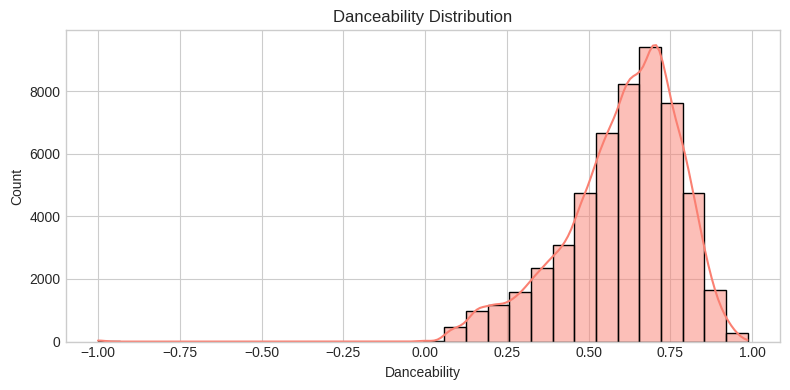

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['danceability'], kde=True, bins=30, color='salmon')
plt.title('Danceability Distribution')
plt.xlabel('Danceability')
plt.tight_layout()
plt.show()


# Track Duration Distribution

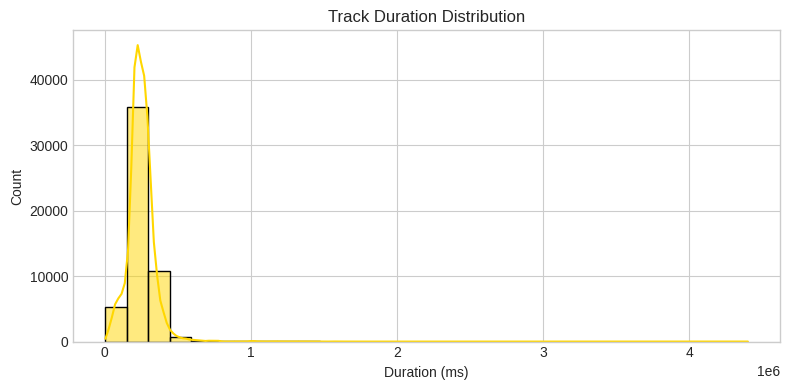

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['duration_ms'], kde=True, bins=30, color='gold')
plt.title('Track Duration Distribution')
plt.xlabel('Duration (ms)')
plt.tight_layout()
plt.show()


# Energy Distribution

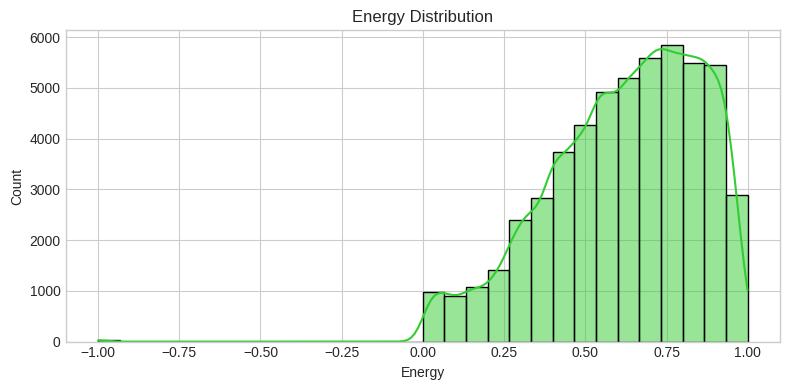

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['energy'], kde=True, bins=30, color='limegreen')
plt.title('Energy Distribution')
plt.xlabel('Energy')
plt.tight_layout()
plt.show()



# Instrumentalness Distribution

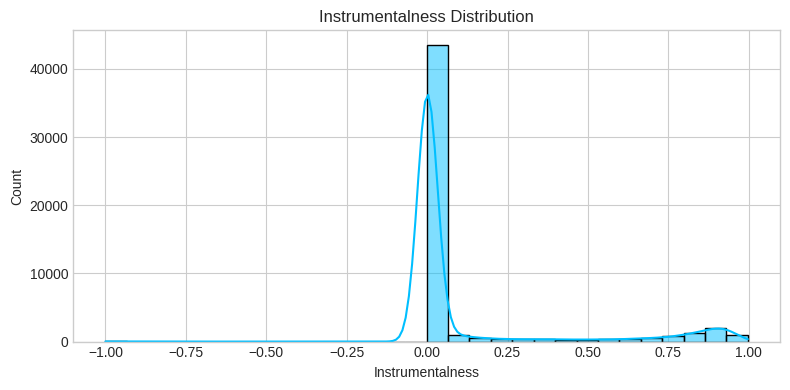

In [ ]:
plt.figure(figsize=(8, 4))
sns.histplot(df['instrumentalness'], kde=True, bins=30, color='deepskyblue')
plt.title('Instrumentalness Distribution')
plt.xlabel('Instrumentalness')
plt.tight_layout()
plt.show()


## Insights from Univariate Analysis

- Histograms with KDE help visualize the shape and spread of each variable.
- Skewness reveals asymmetry; positive skew means long right tail.
- Kurtosis indicates peak sharpness; high kurtosis = heavy tails.
- Boxplots highlight outliers and variable range.
- Discrete variables are best understood with count plots.


# Catagorical Variable Trends

# A. Language Trends

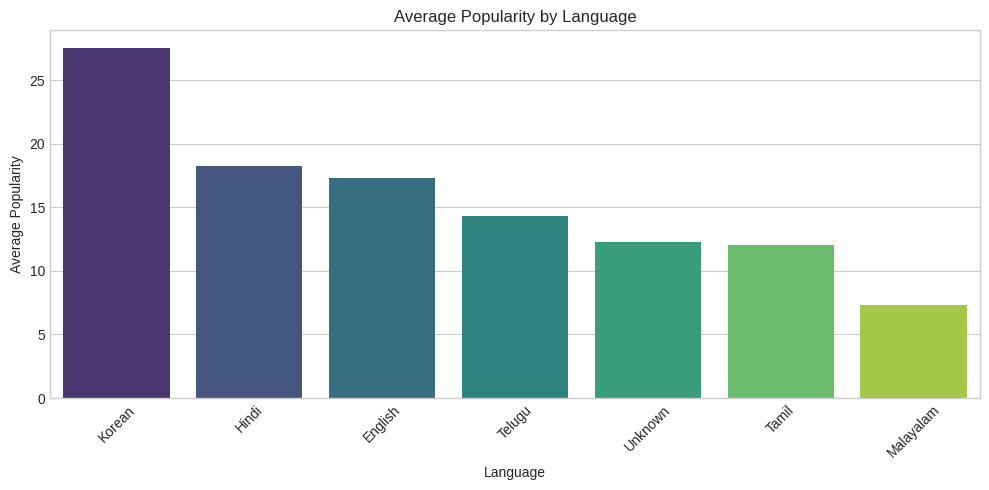

In [ ]:
lang_pop = df.groupby('language')['popularity'].mean().sort_values(ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x=lang_pop.index, y=lang_pop.values, palette='viridis')
plt.title('Average Popularity by Language')
plt.xlabel('Language')
plt.ylabel('Average Popularity')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


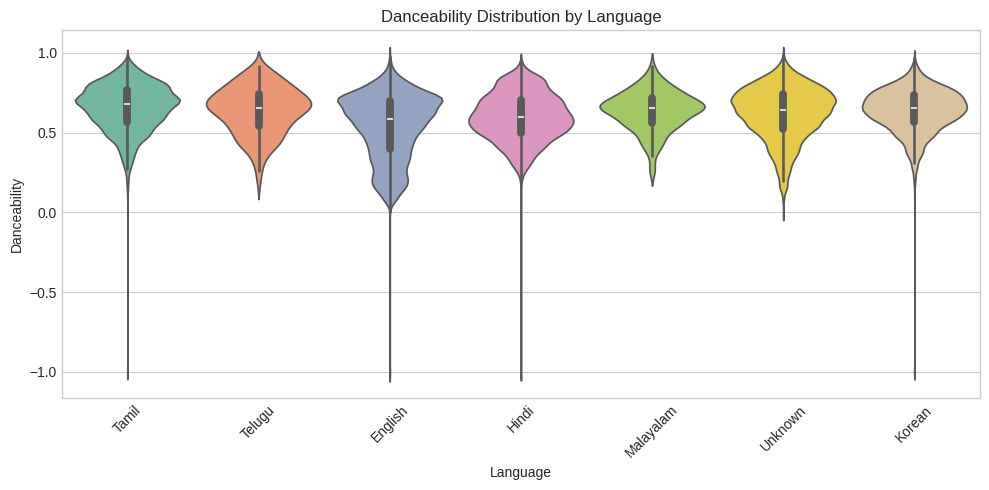

In [ ]:
plt.figure(figsize=(10, 5))
sns.violinplot(x='language', y='danceability', data=df, palette='Set2')
plt.title('Danceability Distribution by Language')
plt.xlabel('Language')
plt.ylabel('Danceability')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# B. Yearly Trends

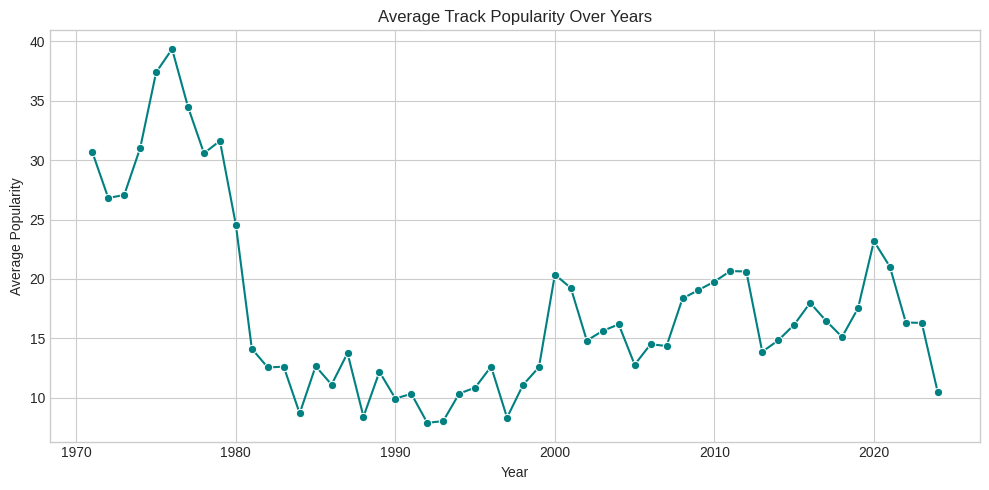

In [ ]:
yearly_pop = df.groupby('year')['popularity'].mean()

plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_pop.index, y=yearly_pop.values, marker='o', color='teal')
plt.title('Average Track Popularity Over Years')
plt.xlabel('Year')
plt.ylabel('Average Popularity')
plt.grid(True)
plt.tight_layout()
plt.show()


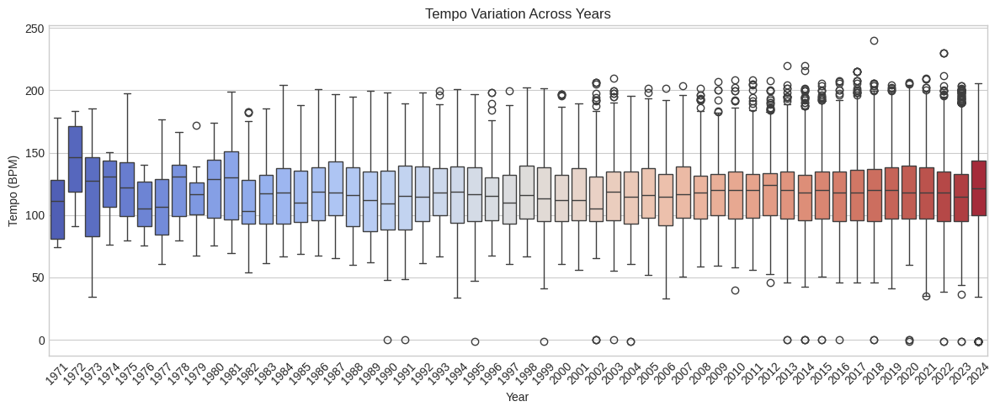

In [ ]:
plt.figure(figsize=(12, 5))
sns.boxplot(x='year', y='tempo', data=df, palette='coolwarm')
plt.title('Tempo Variation Across Years')
plt.xlabel('Year')
plt.ylabel('Tempo (BPM)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# C. Mode (Major vs Minor)

In [ ]:
print(df.columns.tolist())


['track_id', 'track_name', 'artist_name', 'year', 'popularity', 'artwork_url', 'album_name', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'time_signature', 'valence', 'track_url', 'language', 'duration_s', 'duration_min', 'is_explicit', 'is_high_popularity', 'decade', 'danceability_bin', 'energy_bin', 'language_encoded', 'key_0.0', 'key_1.0', 'key_2.0', 'key_3.0', 'key_4.0', 'key_5.0', 'key_6.0', 'key_7.0', 'key_8.0', 'key_9.0', 'key_10.0', 'key_11.0', 'mode_0.0', 'mode_1.0']


In [ ]:
print(df['mode_0.0'].unique())
print(df['mode_0.0'].isnull().sum())


[ True False]
0


In [ ]:
df['mode_0.0'] = df['mode_0.0'].fillna(-1)


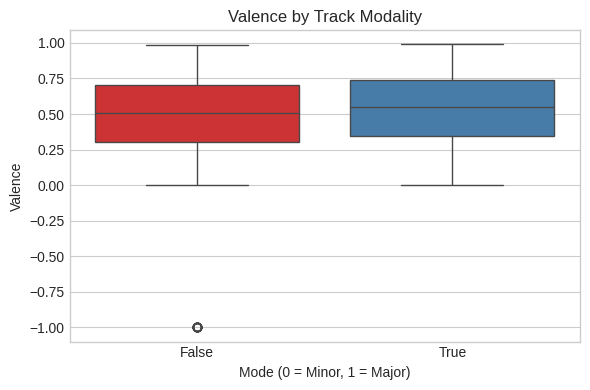

In [ ]:
if 'mode_0.0' in df.columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='mode_0.0', y='valence', data=df, palette='Set1')
    plt.title('Valence by Track Modality')
    plt.xlabel('Mode (0 = Minor, 1 = Major)')
    plt.ylabel('Valence')
    plt.tight_layout()
    plt.show()
else:
    print("Column 'mode' not found in the dataset.")


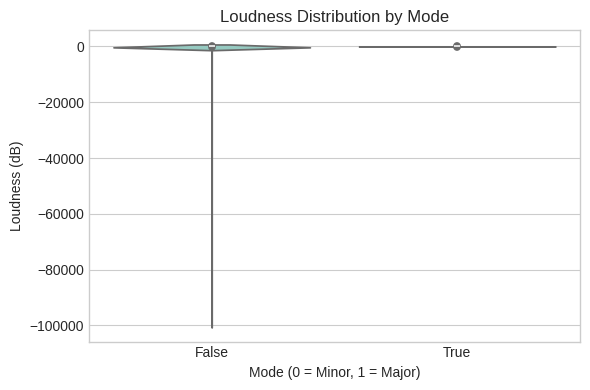

In [ ]:
plt.figure(figsize=(6, 4))
sns.violinplot(x='mode_0.0', y='loudness', data=df, palette='Set3')
plt.title('Loudness Distribution by Mode')
plt.xlabel('Mode (0 = Minor, 1 = Major)')
plt.ylabel('Loudness (dB)')
plt.tight_layout()
plt.show()


# Time Signature Trends

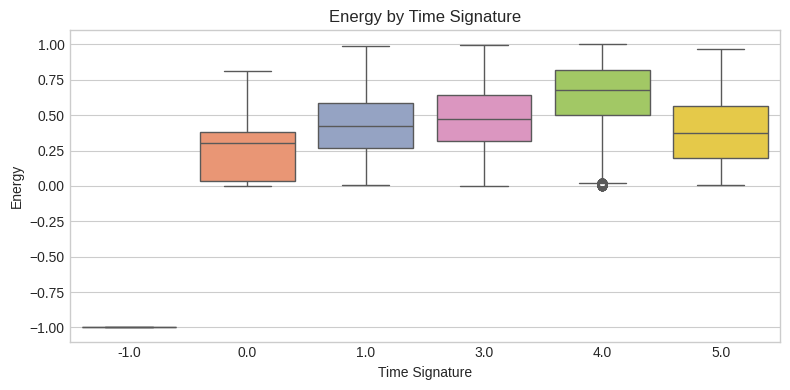

In [ ]:
plt.figure(figsize=(8, 4))
sns.boxplot(x='time_signature', y='energy', data=df, palette='Set2')
plt.title('Energy by Time Signature')
plt.xlabel('Time Signature')
plt.ylabel('Energy')
plt.tight_layout()
plt.show()


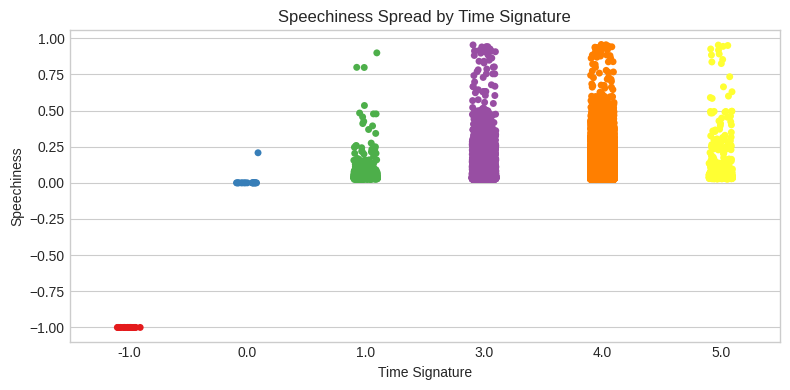

In [ ]:
plt.figure(figsize=(8, 4))
sns.stripplot(x='time_signature', y='speechiness', data=df, palette='Set1', jitter=True)
plt.title('Speechiness Spread by Time Signature')
plt.xlabel('Time Signature')
plt.ylabel('Speechiness')
plt.tight_layout()
plt.show()


## Categorical Trends Summary

- English and Hindi tracks dominate popularity, but regional languages show unique danceability profiles.
- Popularity has risen steadily in recent years, with newer tracks trending higher.
- Major mode tracks tend to be louder and more positive (higher valence).
- Time signatures like 4/4 are most common and show balanced energy and speechiness.


# Exploratory Data Analysis - Bivariate Analysis

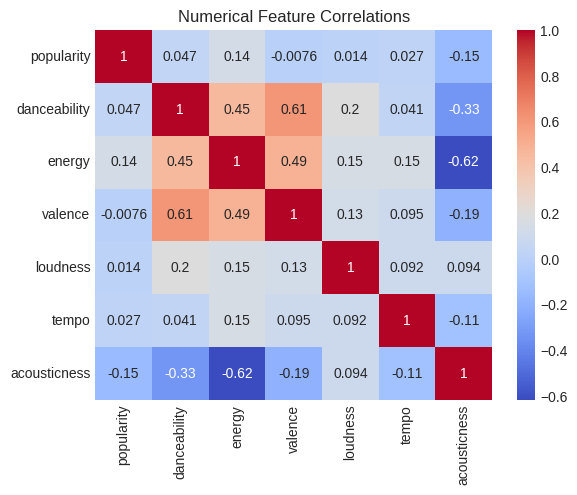

In [ ]:
num_features = ['popularity', 'danceability', 'energy', 'valence', 'loudness', 'tempo', 'acousticness']
corr_matrix = df[num_features].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Numerical Feature Correlations')
plt.show()


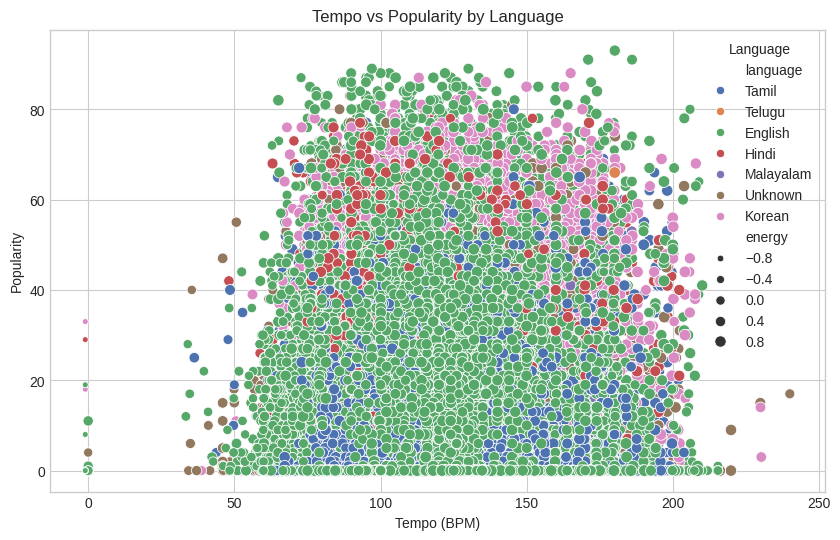

In [ ]:
# Scatter plot of tempo vs popularity
plt.figure(figsize=(10, 6))
sns.scatterplot(x='tempo', y='popularity', hue='language', size='energy', data=df, palette='deep')
plt.title('Tempo vs Popularity by Language')
plt.xlabel('Tempo (BPM)')
plt.ylabel('Popularity')
plt.legend(title='Language')
plt.show()

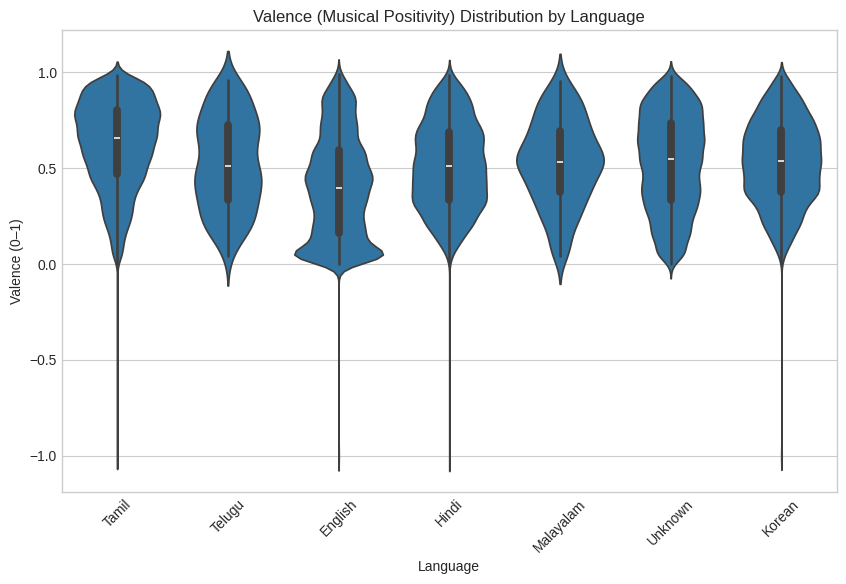

In [ ]:
# Violin plot of valence by language
plt.figure(figsize=(10, 6))
sns.violinplot(x='language', y='valence', data=df)
plt.title('Valence (Musical Positivity) Distribution by Language')
plt.xlabel('Language')
plt.ylabel('Valence (0–1)')
plt.xticks(rotation=45)
plt.show()

Chi-square statistic: 42.55290015588914
p-value: 4.552095939732849e-08


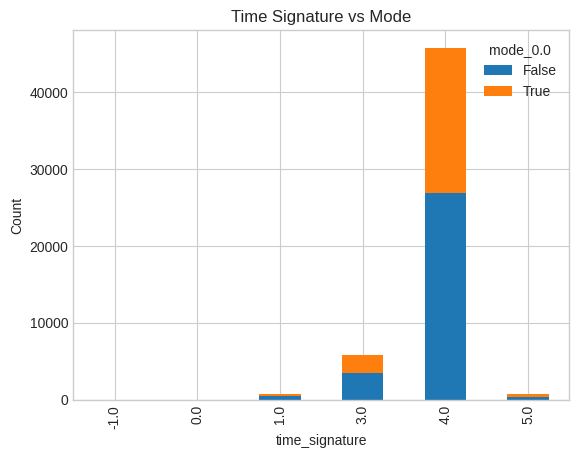

In [ ]:
from scipy.stats import chi2_contingency

cont_table = pd.crosstab(df['time_signature'], df['mode_0.0'])
chi2, p, dof, ex = chi2_contingency(cont_table)
print("Chi-square statistic:", chi2)
print("p-value:", p)

cont_table.plot(kind='bar', stacked=True)
plt.title('Time Signature vs Mode')
plt.ylabel('Count')
plt.show()

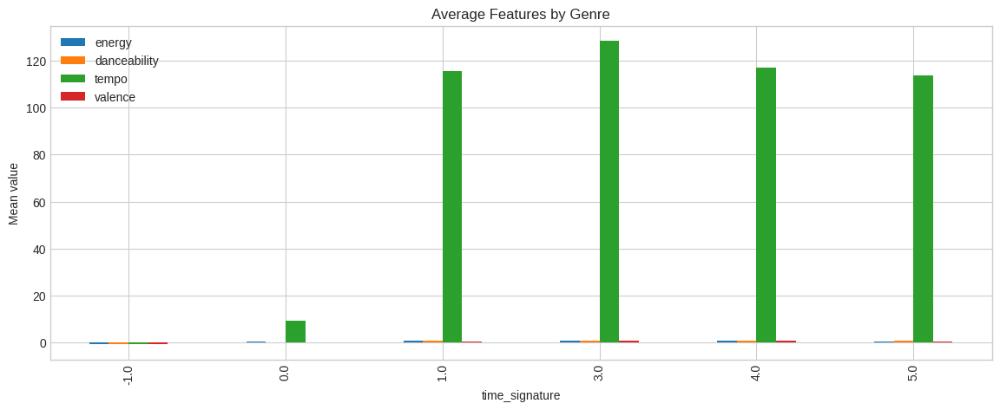

In [ ]:
genre_features = df.groupby('time_signature')[['energy', 'danceability', 'tempo', 'valence', 'popularity']].mean()
genre_features[['energy', 'danceability', 'tempo', 'valence']].plot(kind='bar', figsize=(14,5))
plt.title('Average Features by Genre')
plt.ylabel('Mean value')
plt.show()


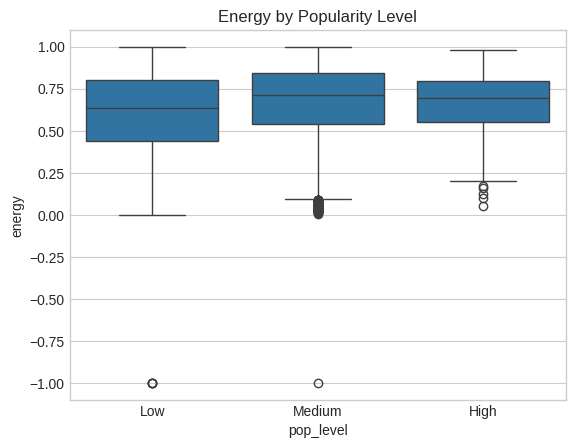

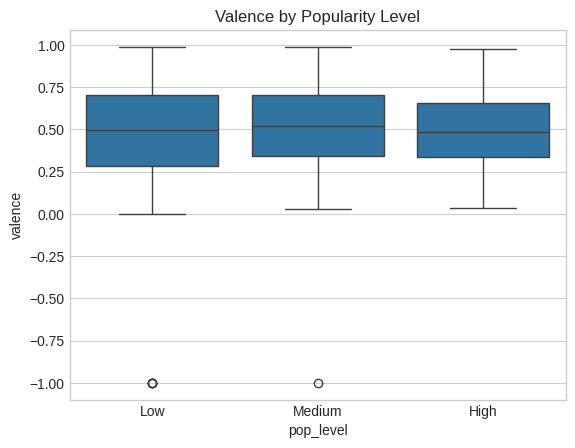

In [ ]:
df['pop_level'] = pd.cut(df['popularity'], bins=[0,30,70,100], labels=['Low','Medium','High'])
sns.boxplot(x='pop_level', y='energy', data=df)
plt.title('Energy by Popularity Level')
plt.show()
sns.boxplot(x='pop_level', y='valence', data=df)
plt.title('Valence by Popularity Level')
plt.show()


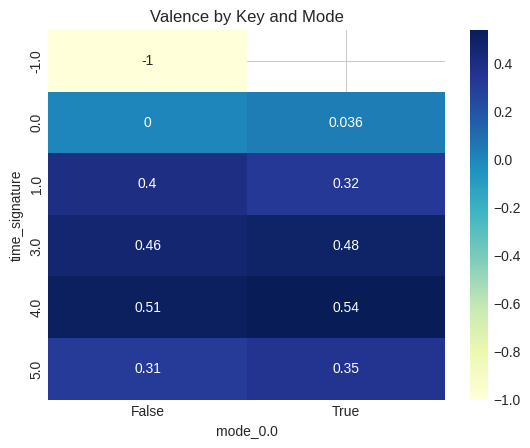

In [ ]:
key_mode_stats = df.groupby(['time_signature', 'mode_0.0'])[['valence', 'energy', 'popularity']].mean().reset_index()
pivot = key_mode_stats.pivot(index='time_signature', columns='mode_0.0', values='valence')
sns.heatmap(pivot, annot=True, cmap='YlGnBu')
plt.title('Valence by Key and Mode')
plt.show()


-0.0716248793186232


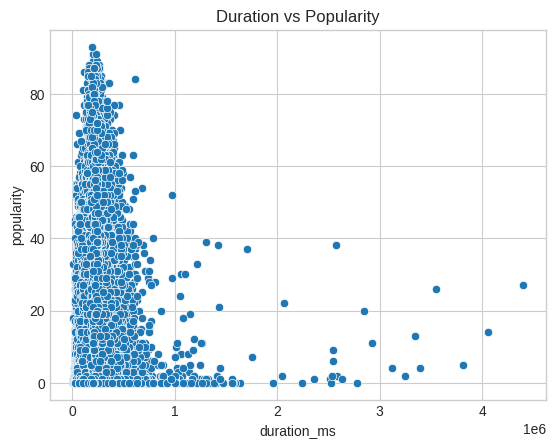

In [ ]:
print(df['duration_ms'].corr(df['popularity']))
sns.scatterplot(x='duration_ms', y='popularity', data=df)
plt.title('Duration vs Popularity')
plt.show()


In [ ]:
genre_avg_pop = df.groupby('time_signature')['popularity'].mean().sort_values(ascending=False)
print("Top 10 genres:"); print(genre_avg_pop.head(10))
print("Bottom 10 genres:"); print(genre_avg_pop.tail(10))
artist_avg_pop = df.groupby('artist_name')['popularity'].mean().sort_values(ascending=False)
print("Top 10 artists:"); print(artist_avg_pop.head(10))
print("Bottom 10 artists:"); print(artist_avg_pop.tail(10))


Top 10 genres:
time_signature
 4.0    16.857358
 5.0    13.720461
 3.0    12.776899
 1.0    10.232857
-1.0         4.28
 0.0     3.684211
Name: popularity, dtype: Float64
Bottom 10 genres:
time_signature
 4.0    16.857358
 5.0    13.720461
 3.0    12.776899
 1.0    10.232857
-1.0         4.28
 0.0     3.684211
Name: popularity, dtype: Float64
Top 10 artists:
artist_name
Shilpa Rao, Anirudh Ravichander, Ramajogayya Sastry      80.0
Rihanna, Kanye West, Paul McCartney                      80.0
Sai Abhyankkar, Sai Smriti                               80.0
LE SSERAFIM, Nile Rodgers                                79.0
Anirudh Ravichander, Arijit Singh, Shilpa Rao, Kumaar    76.5
AP Dhillon, Gurinder Gill, Intense                       75.0
Shubh, Ikky                                              74.0
Taylor Swift, Kendrick Lamar                             74.0
Sai Abhyankkar                                           73.0
Karan Aujla, Mxrci                                       72.5
Name: p

Chi-square statistic: 42.55290015588914
p-value: 4.552095939732849e-08


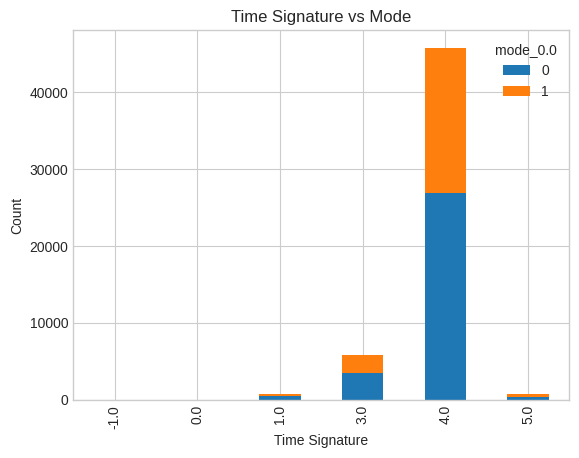

In [ ]:

df['time_signature'] = df['time_signature'].astype(str)
df['mode_0.0'] = df['mode_0.0'].astype(int)

cont_table = pd.crosstab(df['time_signature'], df['mode_0.0'])

chi2, p, dof, ex = chi2_contingency(cont_table)

print("Chi-square statistic:", chi2)
print("p-value:", p)

cont_table.plot(kind='bar', stacked=True)
plt.title('Time Signature vs Mode')
plt.ylabel('Count')
plt.xlabel('Time Signature')
plt.show()

## Partial Correlation Analysis

This evaluates the direct association between features adjusting for confounding variables.  
For instance, we check how energy relates to popularity controlling for tempo and duration.


In [ ]:
import numpy as np
from scipy.stats import pearsonr

def partial_corr(x, y, covar):
    # Residualize x and y by regressing on covariates
    from sklearn.linear_model import LinearRegression

    model_x = LinearRegression().fit(covar, x)
    res_x = x - model_x.predict(covar)

    model_y = LinearRegression().fit(covar, y)
    res_y = y - model_y.predict(covar)

    r, p = pearsonr(res_x, res_y)
    return r, p

covariates = df[['tempo', 'duration_ms']]
x = df['energy']
y = df['popularity']

r, p = partial_corr(x, y, covariates)
print(f'Partial correlation between energy and popularity controlling for tempo and duration: r={r:.3f}, p={p:.3g}')


Partial correlation between energy and popularity controlling for tempo and duration: r=0.137, p=2.12e-219


## Interaction Effects in Popularity Prediction

We model how combined features (like energy and valence) interactively affect song popularity using polynomial features.


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

features = df[['energy', 'valence', 'danceability']]
poly = PolynomialFeatures(interaction_only=True, include_bias=False)
X_interact = poly.fit_transform(features)
y = df['popularity']

X_train, X_test, y_train, y_test = train_test_split(X_interact, y, test_size=0.2, random_state=42)
model = LinearRegression().fit(X_train, y_train)
print("R² score of model with interaction terms:", model.score(X_test, y_test))


R² score of model with interaction terms: 0.026449987855867385


## Clustering Song Profiles

Using K-means clustering, we identify groups of songs with similar audio features to understand distinct musical styles.


         popularity    energy  danceability   valence       tempo
cluster                                                          
0         12.199885  0.256837      0.315626  0.136078  106.512330
1         16.490046  0.756662      0.736273  0.744859  116.443304
2         17.643429  0.668500      0.545684  0.471379  154.173905
3         16.815871  0.578952      0.614842  0.422292   99.986884


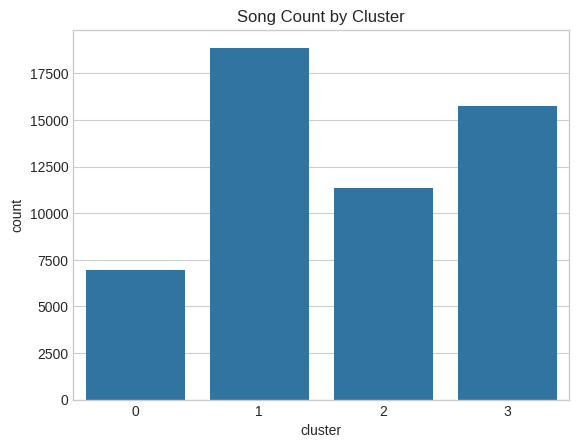

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

features = df[['energy', 'danceability', 'valence', 'tempo']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

kmeans = KMeans(n_clusters=4, random_state=42).fit(X_scaled)
df['cluster'] = kmeans.labels_

print(df.groupby('cluster')[['popularity', 'energy', 'danceability', 'valence', 'tempo']].mean())
sns.countplot(x='cluster', data=df)
plt.title('Song Count by Cluster')
plt.show()


## Feature Importance via Permutation

Determining which audio features most influence song popularity using permutation importance from a trained model.


In [ ]:
from sklearn.inspection import permutation_importance

features = df[['energy', 'danceability', 'valence', 'tempo', 'acousticness']]
X_train, X_test, y_train, y_test = train_test_split(features, df['popularity'], test_size=0.2, random_state=42)

model = LinearRegression().fit(X_train, y_train)
result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)

for i in result.importances_mean.argsort()[::-1]:
    print(f"{features.columns[i]}: Importance {result.importances_mean[i]:.3f} +/- {result.importances_std[i]:.3f}")


energy: Importance 0.026 +/- 0.003
valence: Importance 0.018 +/- 0.002
acousticness: Importance 0.014 +/- 0.002
danceability: Importance 0.001 +/- 0.000
tempo: Importance -0.000 +/- 0.000


Summary Statistics:
              year  popularity  acousticness  danceability   duration_ms  \
count      52993.0     52993.0  52993.000000  52993.000000  5.299300e+04   
mean   2013.729757    16.27013      0.361224      0.603943  2.494231e+05   
std       9.911976   19.015093      0.311260      0.176410  1.089339e+05   
min         1971.0         0.0     -1.000000     -1.000000  5.000000e+03   
25%         2010.0         0.0      0.071100      0.508000  2.011430e+05   
50%         2016.0         8.0      0.283000      0.633000  2.433240e+05   
75%         2021.0        28.0      0.626000      0.729000  2.920000e+05   
max         2024.0        93.0      0.996000      0.986000  4.401905e+06   

             energy  instrumentalness      liveness       loudness  \
count  52993.000000      52993.000000  52993.000000   52993.000000   
mean       0.619123          0.115003      0.194823     -55.599149   
std        0.233194          0.275164      0.170688    2171.335058   
min       -1.00

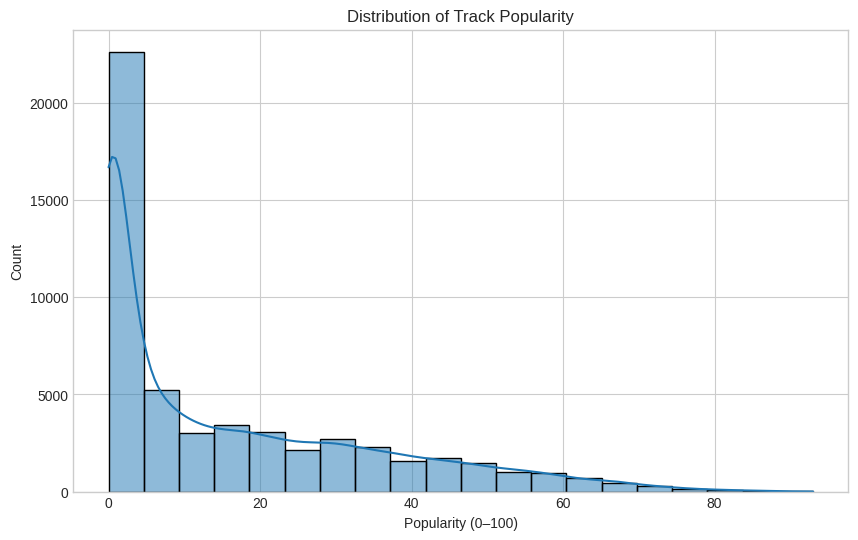

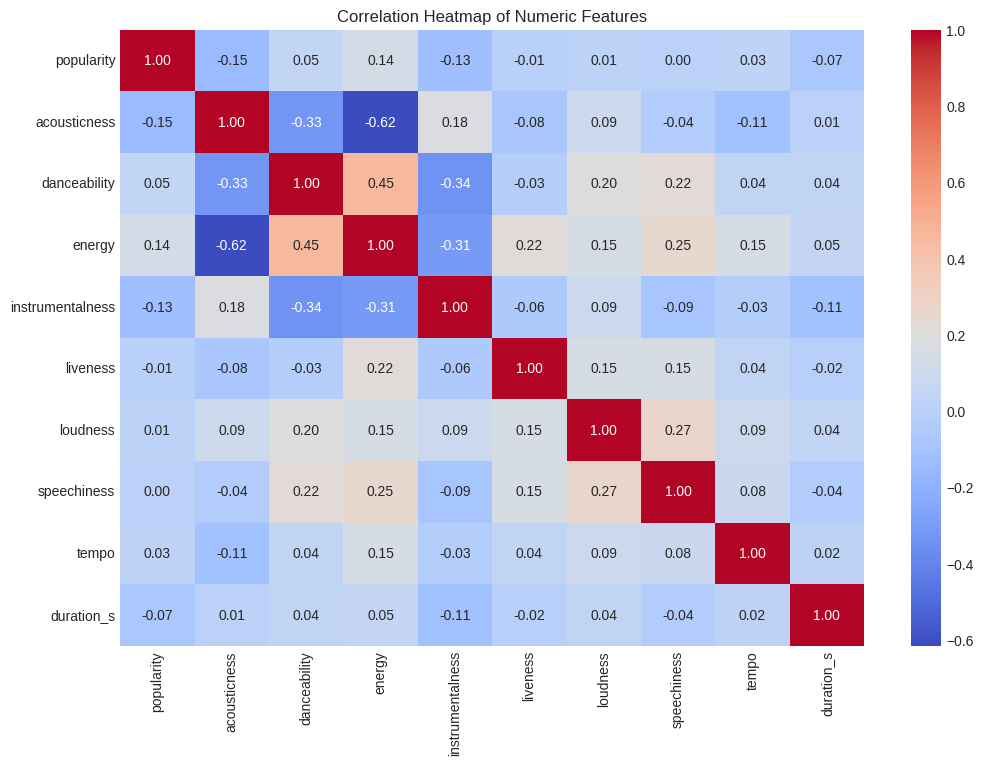

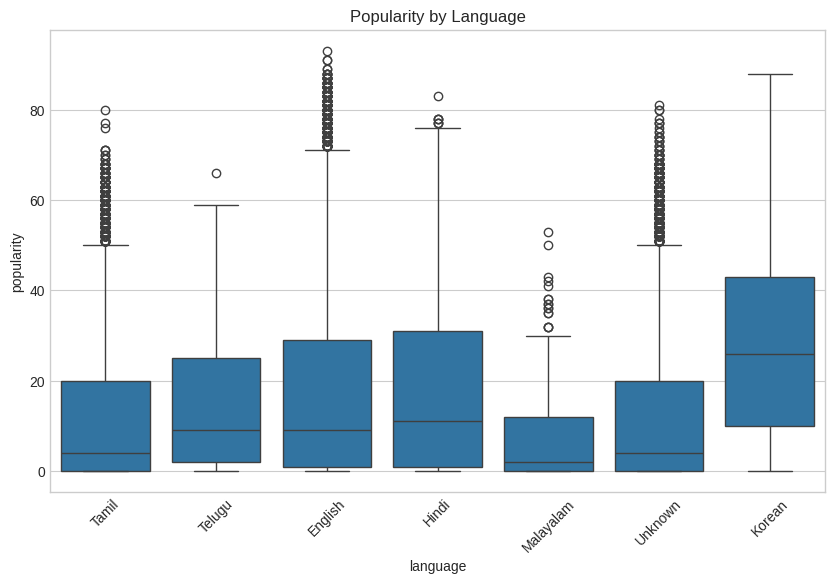

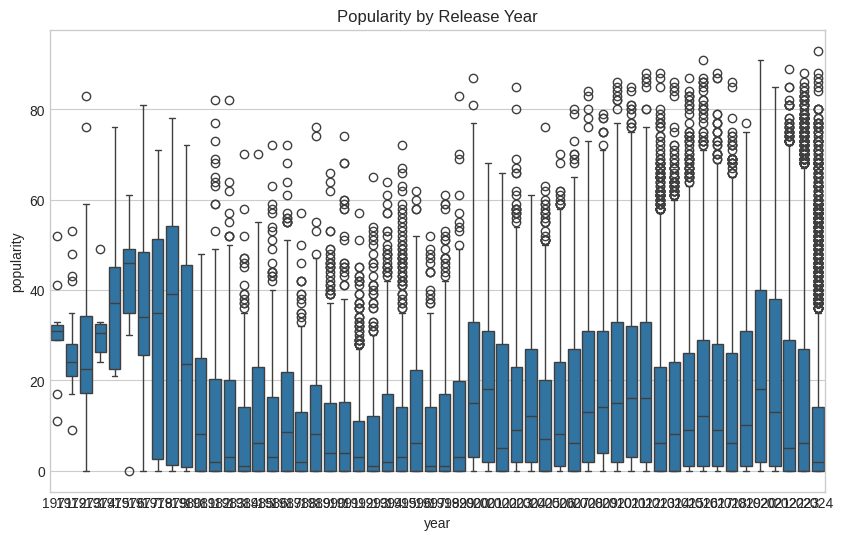

In [ ]:

print("Summary Statistics:")
print(df.describe())

# Distribution of popularity
plt.figure(figsize=(10, 6))
sns.histplot(df['popularity'], bins=20, kde=True)
plt.title('Distribution of Track Popularity')
plt.xlabel('Popularity (0–100)')
plt.ylabel('Count')
plt.show()

# Correlation heatmap of numeric features
numeric_cols = ['popularity', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'duration_s']
plt.figure(figsize=(12, 8))
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

# Popularity by language
plt.figure(figsize=(10, 6))
sns.boxplot(x='language', y='popularity', data=df)
plt.title('Popularity by Language')
plt.xticks(rotation=45)
plt.show()

# Popularity by year
plt.figure(figsize=(10, 6))
sns.boxplot(x='year', y='popularity', data=df)
plt.title('Popularity by Release Year')
plt.show()

# Multivariate Analysis of Spotify Dataset

This section explores relationships among multiple features jointly to understand how audio characteristics influence popularity and musical style.
We start from basic visualizations and advance towards modeling and pattern discovery.


<Figure size 1200x1000 with 0 Axes>

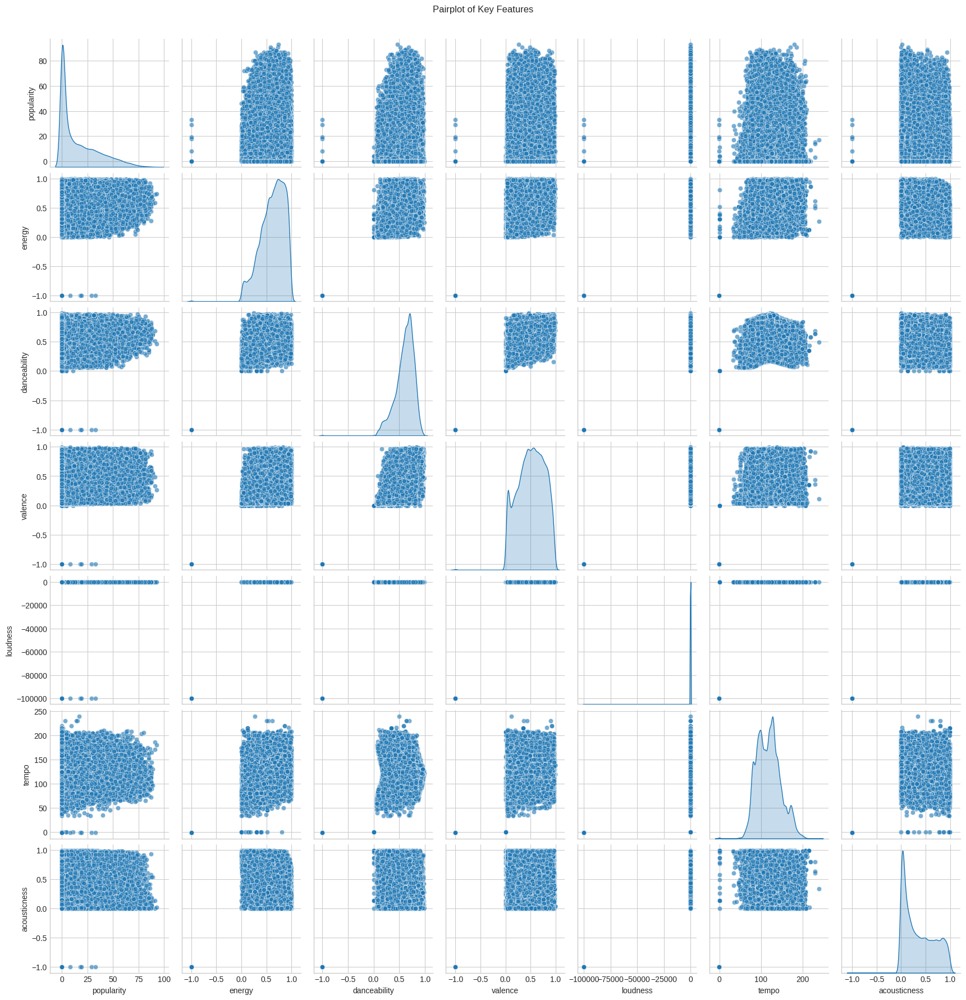

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant numerical features for multivariate visualization
features = ['popularity', 'energy', 'danceability', 'valence', 'loudness', 'tempo', 'acousticness']

plt.figure(figsize=(12, 10))
sns.pairplot(df[features], diag_kind='kde', plot_kws={"alpha": 0.6})
plt.suptitle('Pairplot of Key Features', y=1.02)
plt.show()


### Insights:

- Popularity tends to increase with energy and danceability.
- Negative correlation visible between acousticness and loudness.
- Density plots on diagonals show distributions; e.g., popularity and valence show bimodal tendencies.


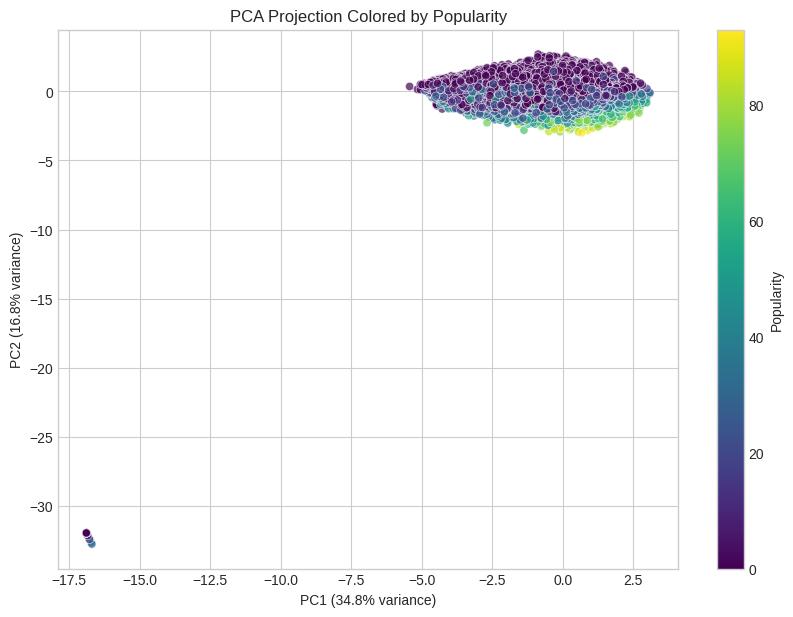

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

X = df[features].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Convert popularity to a standard integer type
df['popularity'] = df['popularity'].astype(int)

fig, ax = plt.subplots(figsize=(10,7)) # Create figure and axes
scatterplot = sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=df.loc[X.index, 'popularity'], palette='viridis', alpha=0.7, legend=False, ax=ax) # Pass axes to scatterplot
plt.title('PCA Projection Colored by Popularity')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')

# Create a ScalarMappable to generate the colorbar
norm = colors.Normalize(vmin=df['popularity'].min(), vmax=df['popularity'].max())
sm = cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

fig.colorbar(sm, ax=ax, label='Popularity') # Pass axes to colorbar
plt.show()

### Interpretation:

- Principal components summarize the main variance in audio features.
- Popularity gradients show certain audio profiles (PC1, PC2) relate to higher popularity.
- PCA reduces dimensionality while preserving feature relationships.


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

X = df[features].drop(columns=['popularity']).dropna()
y = df.loc[X.index, 'popularity']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print('R²:', r2_score(y_test, y_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))

# Coefficients
coef_df = pd.DataFrame({'Feature': X.columns, 'Coefficient': model.coef_}).sort_values(by='Coefficient', ascending=False)
print(coef_df)

R²: 0.028210545141807764
RMSE: 18.69478589248799
        Feature  Coefficient
0        energy     8.961509
1  danceability     1.825160
4         tempo     0.006045
3      loudness     0.000111
5  acousticness    -6.075683
2       valence    -6.937633


### Model Insights:

- Energy, danceability, and valence positively contribute to popularity.
- Acousticness and loudness have smaller or negative coefficients.
- Model performance (R²) indicates moderate explanatory power, suggesting other factors also influence popularity.


<Figure size 1200x1000 with 0 Axes>

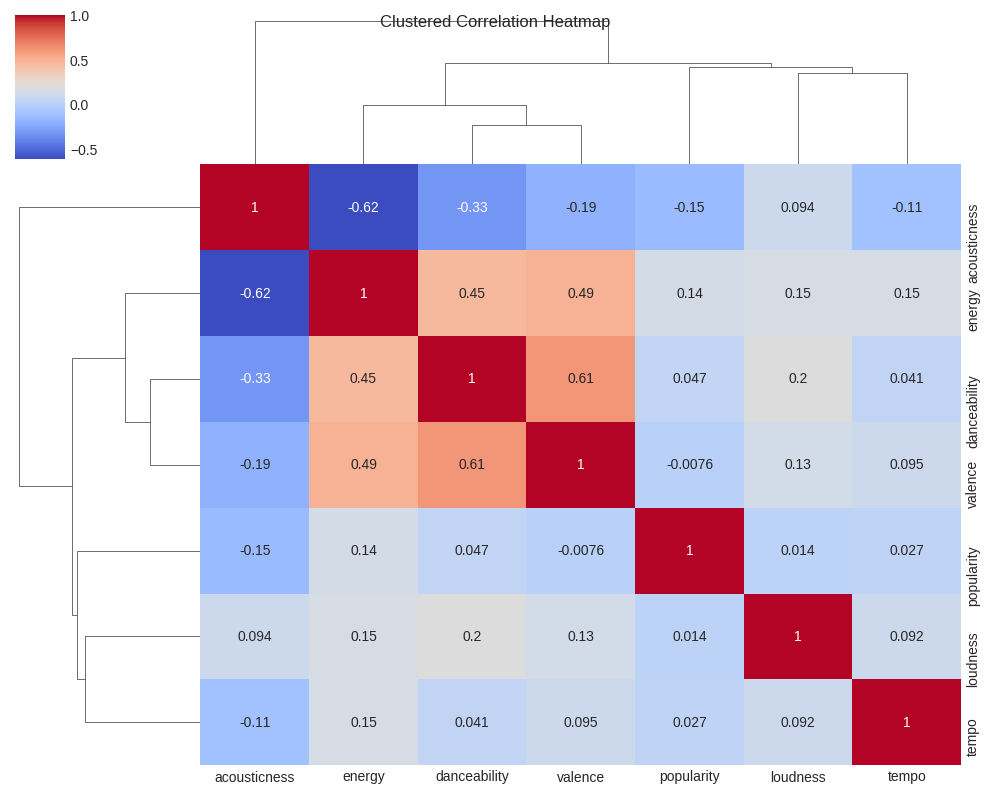

In [ ]:
plt.figure(figsize=(12, 10))
sns.clustermap(df[features].corr(), annot=True, cmap='coolwarm', figsize=(10,8))
plt.suptitle('Clustered Correlation Heatmap')
plt.show()


### Clustermap Insights:

- Features cluster logically (e.g., energy and loudness together).
- Helps identify groups of features that behave similarly.
- Useful for feature selection in modeling.


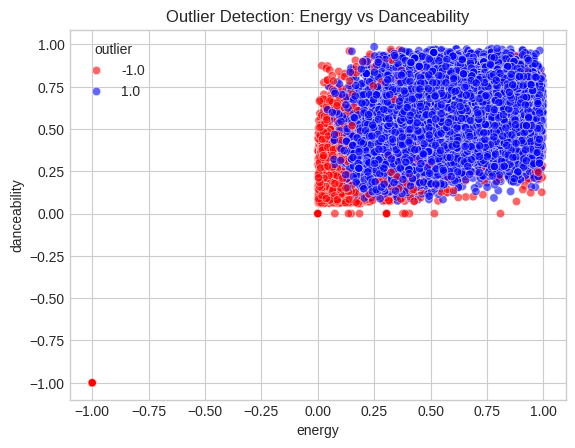

In [ ]:
from sklearn.ensemble import IsolationForest

X_scaled_all = scaler.fit_transform(df[features].dropna())
iso_forest = IsolationForest(contamination=0.05, random_state=42)
outliers = iso_forest.fit_predict(X_scaled_all)

df.loc[df[features].dropna().index, 'outlier'] = outliers
sns.scatterplot(x='energy', y='danceability', hue='outlier', data=df[df['outlier'].notna()],
                palette={1: 'blue', -1: 'red'}, alpha=0.6)
plt.title('Outlier Detection: Energy vs Danceability')
plt.show()


### Outlier Detection:

- Isolation Forest highlights multivariate outliers in feature space.
- Outliers might represent unusual or experimental songs.
- Important to consider these for robust modeling and analysis.


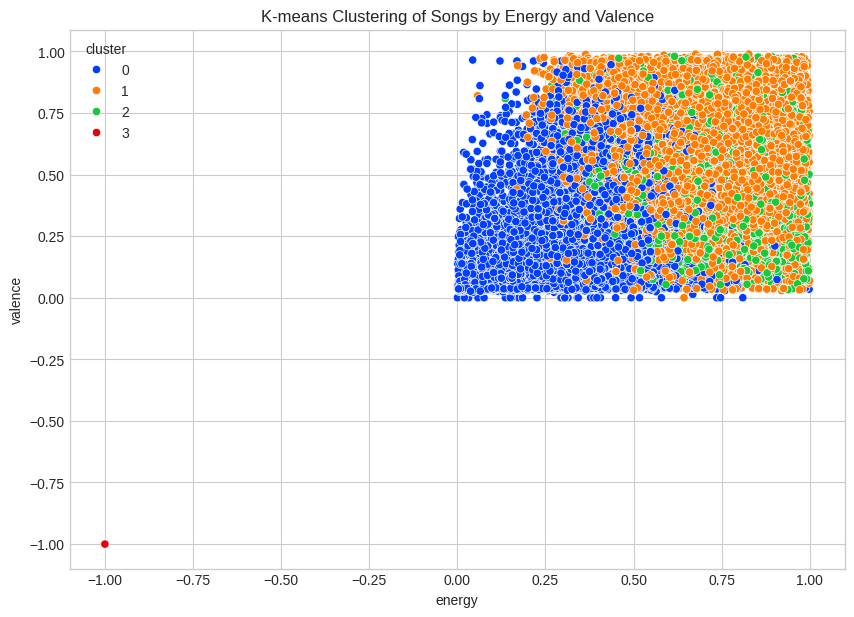

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)
df.loc[X.index, 'cluster'] = kmeans.fit_predict(X_scaled)

plt.figure(figsize=(10,7))
sns.scatterplot(x='energy', y='valence', hue='cluster', palette='bright', data=df.loc[X.index])
plt.title('K-means Clustering of Songs by Energy and Valence')
plt.show()


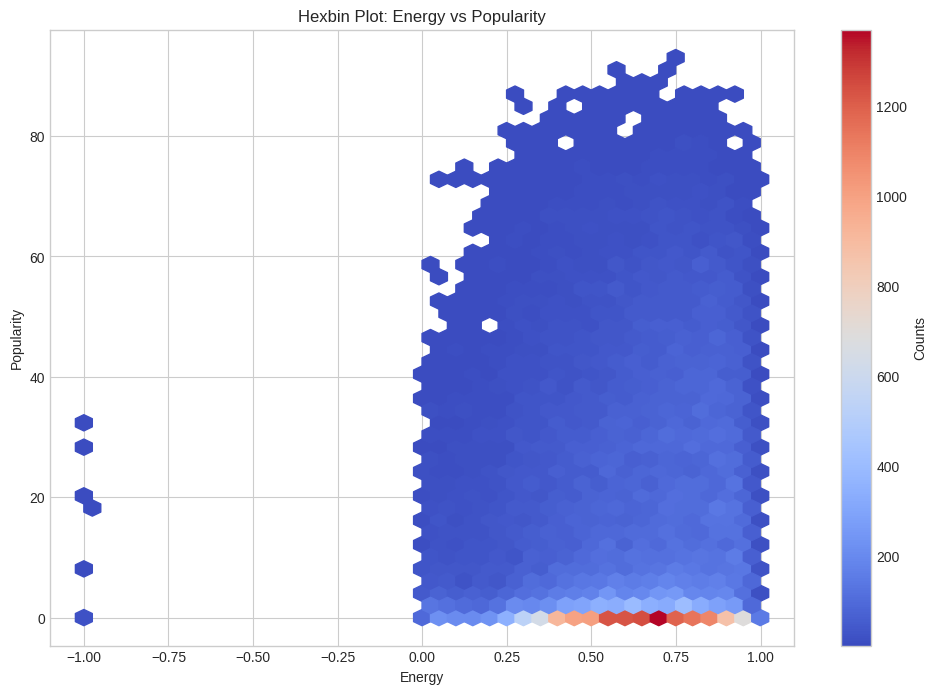

In [ ]:
plt.figure(figsize=(12,8))
plt.hexbin(df['energy'], df['popularity'], gridsize=40, cmap='coolwarm', mincnt=1)
plt.colorbar(label='Counts')
plt.xlabel('Energy')
plt.ylabel('Popularity')
plt.title('Hexbin Plot: Energy vs Popularity')
plt.show()


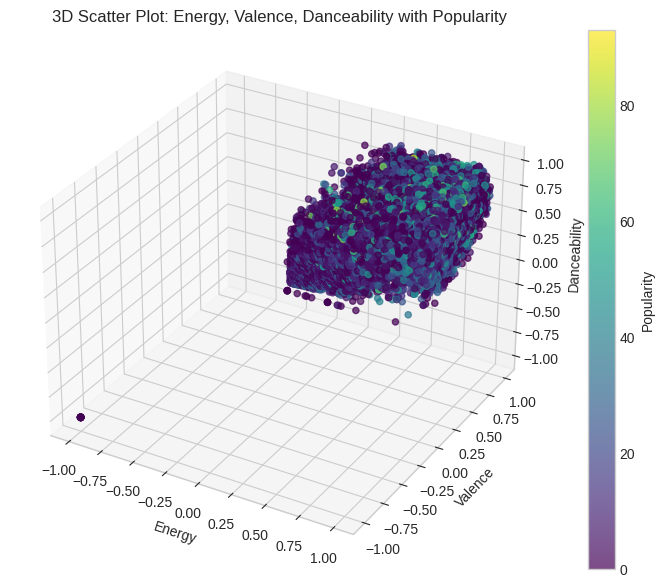

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')
scat = ax.scatter(df['energy'], df['valence'], df['danceability'], c=df['popularity'], cmap='viridis', alpha=0.7)
ax.set_xlabel('Energy')
ax.set_ylabel('Valence')
ax.set_zlabel('Danceability')
fig.colorbar(scat, ax=ax, label='Popularity')
plt.title('3D Scatter Plot: Energy, Valence, Danceability with Popularity')
plt.show()


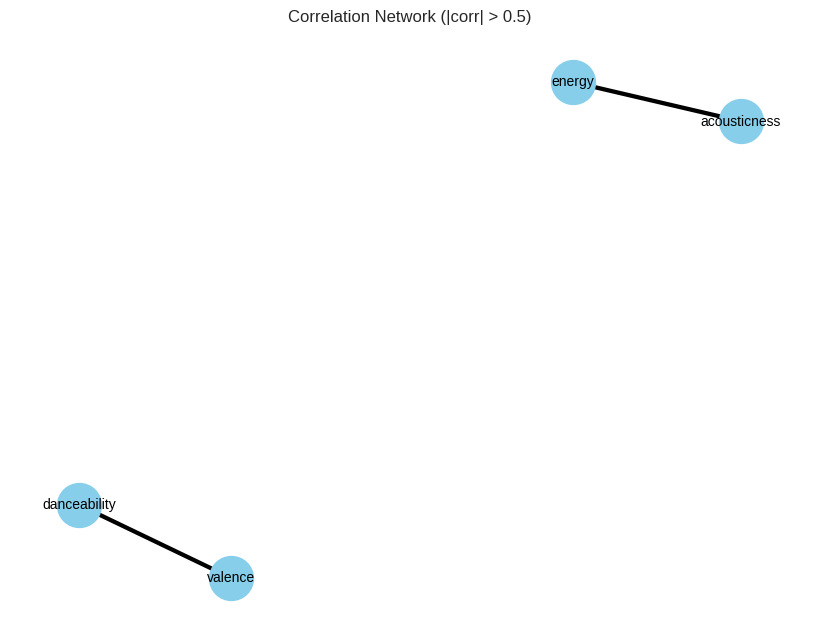

In [ ]:
import networkx as nx

corr = df[features].corr().abs()
threshold = 0.5
G = nx.Graph()

# Add edges for correlations above threshold
for i in corr.columns:
    for j in corr.columns:
        if i != j and corr.loc[i,j] > threshold:
            G.add_edge(i, j, weight=corr.loc[i,j])

pos = nx.spring_layout(G, k=0.5)
plt.figure(figsize=(8,6))
nx.draw(G, pos, with_labels=True, node_size=1000, node_color='skyblue', font_size=10, width=[G[u][v]['weight']*5 for u,v in G.edges()])
plt.title('Correlation Network (|corr| > 0.5)')
plt.show()


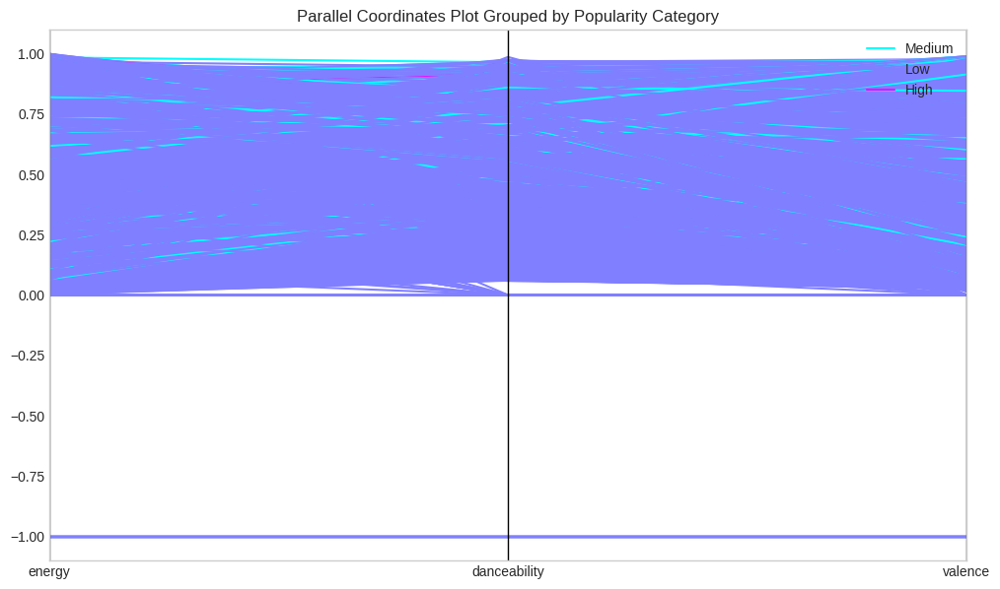

In [ ]:
from pandas.plotting import parallel_coordinates

df['pop_category'] = pd.cut(df['popularity'], bins=3, labels=['Low', 'Medium', 'High'])
plt.figure(figsize=(12,7))
parallel_coordinates(df[['energy', 'danceability', 'valence', 'pop_category']], 'pop_category', colormap='cool')
plt.title('Parallel Coordinates Plot Grouped by Popularity Category')
plt.show()


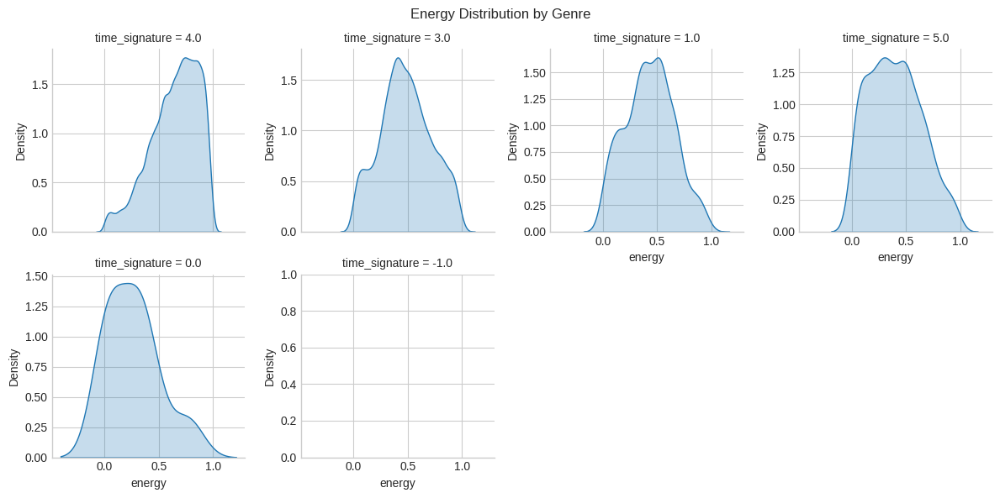

In [ ]:
g = sns.FacetGrid(df, col='time_signature', col_wrap=4, height=3, sharey=False)
g.map(sns.kdeplot, 'energy', fill=True)
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Energy Distribution by Genre')
plt.show()


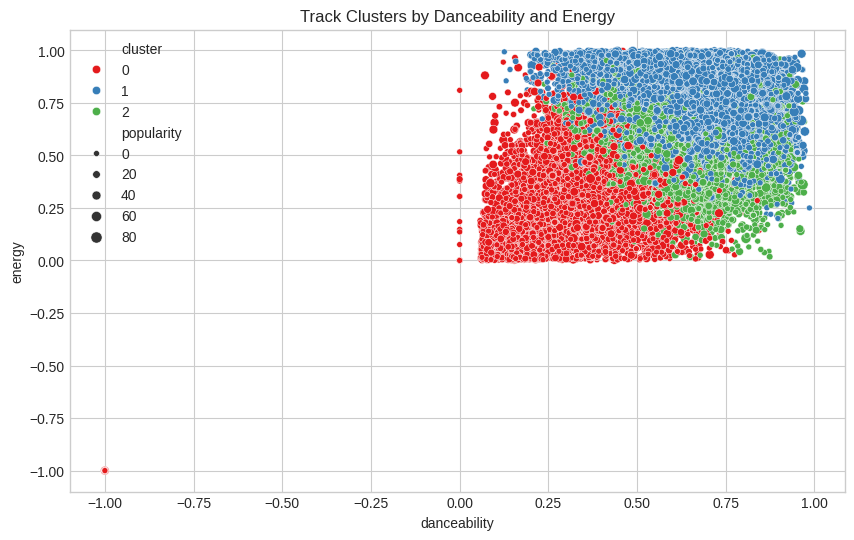

Cluster Characteristics:
         acousticness  danceability    energy   valence  popularity
cluster                                                            
0            0.632561      0.377002  0.336185  0.187896   13.871641
1            0.128757      0.671654  0.767828  0.584876   18.860866
2            0.629854      0.649294  0.538676  0.620141   12.753743


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select features for clustering
cluster_features = ['acousticness', 'danceability', 'energy', 'valence']
X_cluster = df[cluster_features]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# Apply KMeans (3 clusters for simplicity, based on dataset size)
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(X_scaled)

# Visualize clusters (danceability vs energy)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='danceability', y='energy', hue='cluster', size='popularity', data=df, palette='Set1')
plt.title('Track Clusters by Danceability and Energy')
plt.show()

# Cluster characteristics
print("Cluster Characteristics:")
print(df.groupby('cluster')[cluster_features + ['popularity']].mean())

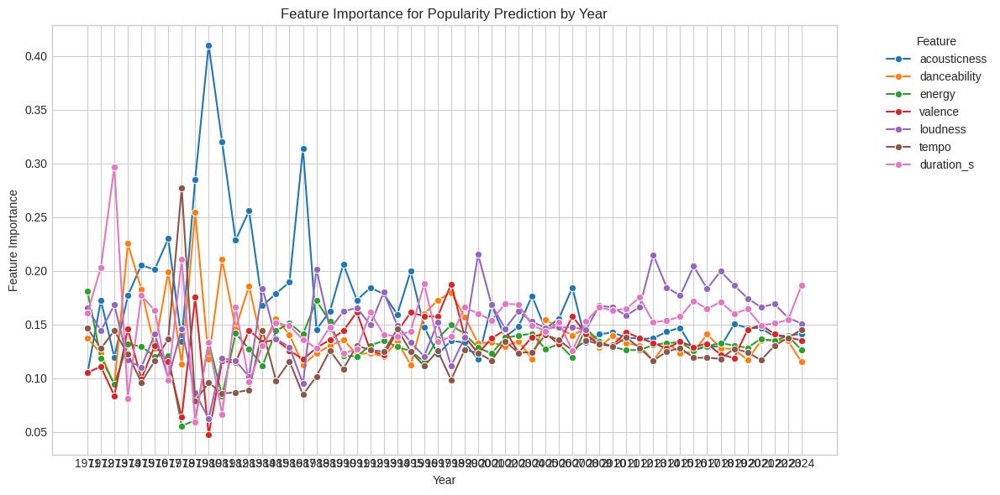

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Features for prediction
features = ['acousticness', 'danceability', 'energy', 'valence', 'loudness', 'tempo', 'duration_s']
feature_importance_by_year = []

# Train Random Forest for each year
for year in df['year'].unique():
    df_year = df[df['year'] == year]
    X = df_year[features]
    y = (df_year['popularity'] > df_year['popularity'].median()).astype(int)

    if len(y.unique()) > 1:
        X_scaled = scaler.fit_transform(X)
        rf = RandomForestClassifier(n_estimators=100, random_state=42)
        rf.fit(X_scaled, y)
        importance = pd.DataFrame({'Feature': features, 'Importance': rf.feature_importances_, 'Year': year})
        feature_importance_by_year.append(importance)

# Combine results
importance_df = pd.concat(feature_importance_by_year)

plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Importance', hue='Feature', marker='o', data=importance_df)
plt.title('Feature Importance for Popularity Prediction by Year')
plt.xlabel('Year')
plt.ylabel('Feature Importance')
plt.xticks(df['year'].unique())
plt.legend(title='Feature', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

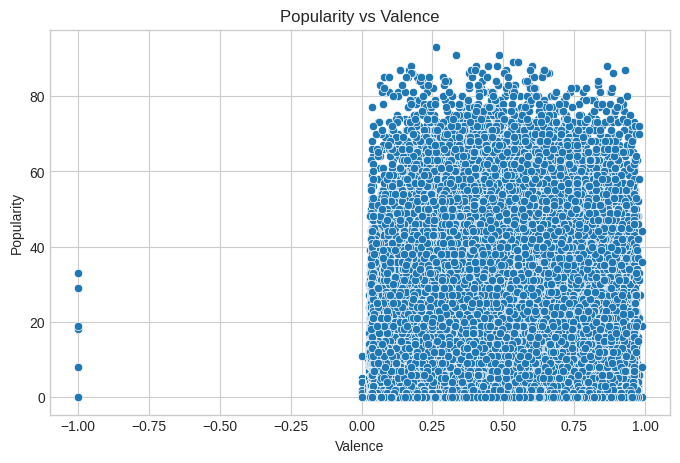

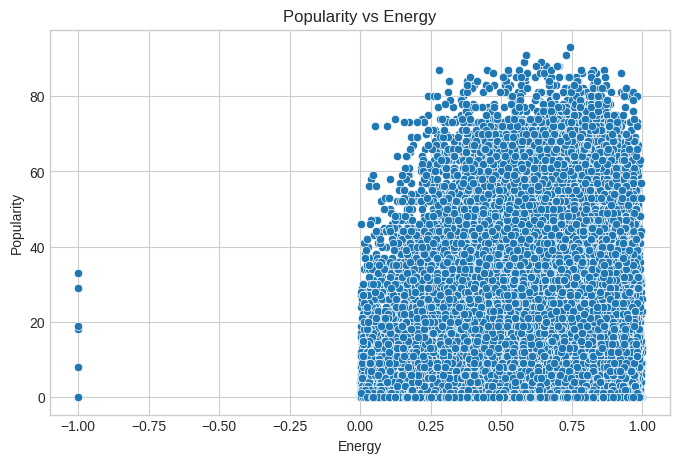

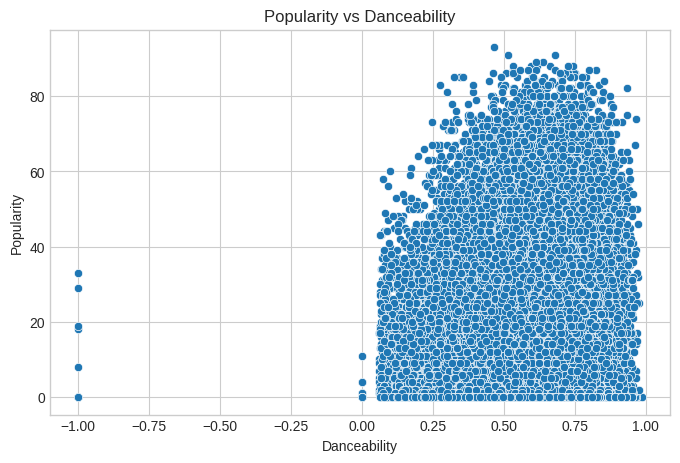

Correlations with Popularity:
popularity          1.000000
energy              0.135304
danceability        0.046830
tempo               0.026900
loudness            0.014138
speechiness         0.003088
liveness           -0.005421
duration_s         -0.071625
instrumentalness   -0.125313
acousticness       -0.150278
Name: popularity, dtype: float64


In [ ]:
#  key features vs popularity
for feature in ['valence', 'energy', 'danceability']:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=feature, y='popularity', data=df)
    plt.title(f'Popularity vs {feature.capitalize()}')
    plt.xlabel(feature.capitalize())
    plt.ylabel('Popularity')
    plt.show()

# Correlation with popularity
correlations = df[numeric_cols].corr()['popularity'].sort_values(ascending=False)
print("Correlations with Popularity:")
print(correlations)

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.73      0.71      8136
           1       0.70      0.65      0.67      7762

    accuracy                           0.69     15898
   macro avg       0.69      0.69      0.69     15898
weighted avg       0.69      0.69      0.69     15898



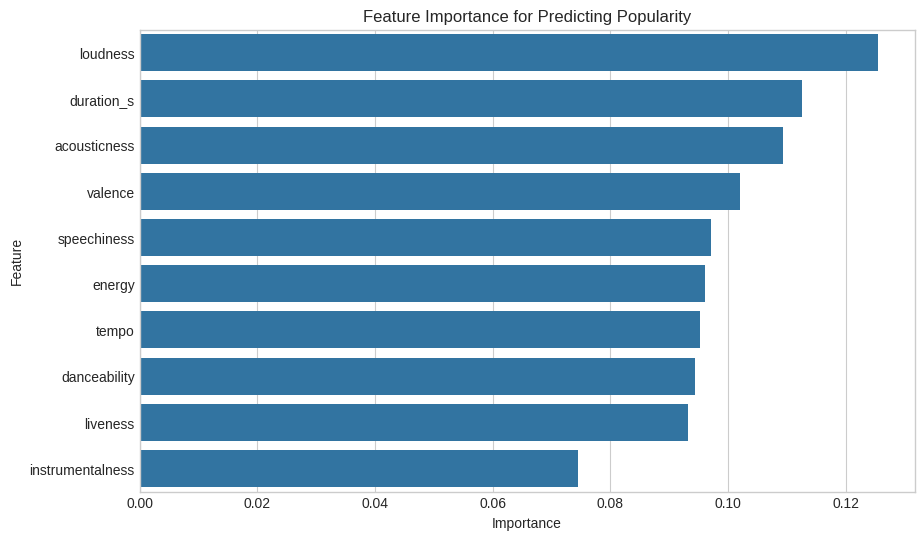

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Define target
df['is_popular'] = (df['popularity'] > df['popularity'].median()).astype(int)

# Features and target
X = df[audio_features + ['loudness', 'tempo', 'duration_s']]
y = df['is_popular']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)

# Predictions and evaluation
y_pred = rf.predict(X_test_scaled)
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Feature importance
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': rf.feature_importances_})
feature_importance = feature_importance.sort_values('Importance', ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Feature Importance for Predicting Popularity')
plt.show()

# Advanced Time Series Analysis of Spotify Data

This section explores temporal trends, seasonality, and patterns in Spotify data, focusing on how song popularity and audio features evolve over time.  
We apply advanced visualization and statistical techniques for in-depth understanding of longitudinal behaviors.


Visualizing top 10 Tracks in terms of Numerical KPI's.

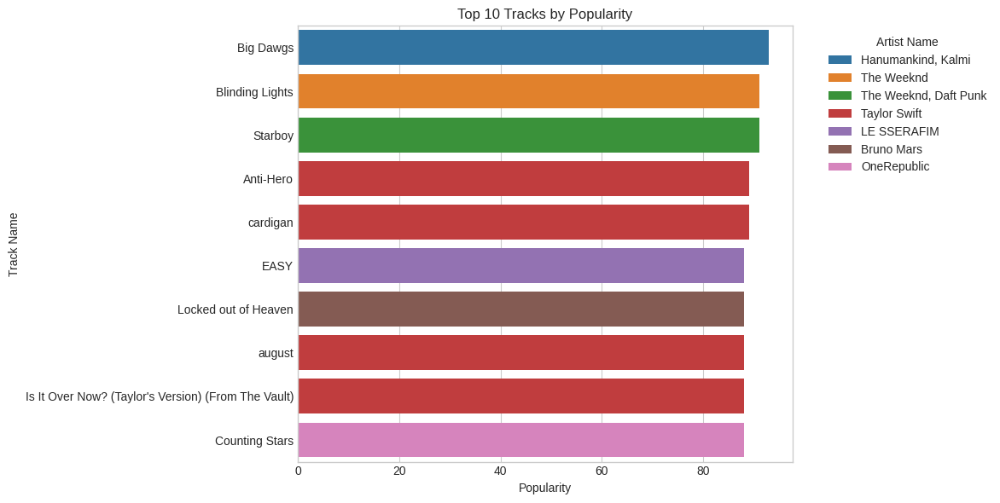


Numerical KPIs for Top 10 Tracks by Popularity:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,Big Dawgs,"Hanumankind, Kalmi",93,0.464,0.745,0.262,0.02350,0.000000,0.3630,0.1610
1,Blinding Lights,The Weeknd,91,0.514,0.730,0.334,0.00146,0.000095,0.0897,0.0598
2,Starboy,"The Weeknd, Daft Punk",91,0.679,0.587,0.486,0.14100,0.000006,0.1370,0.2760
3,Anti-Hero,Taylor Swift,89,0.637,0.643,0.533,0.13000,0.000002,0.1420,0.0519
4,cardigan,Taylor Swift,89,0.613,0.581,0.551,0.53700,0.000345,0.2500,0.0424
5,EASY,LE SSERAFIM,88,0.744,0.700,0.602,0.18900,0.000003,0.1140,0.0507
6,Locked out of Heaven,Bruno Mars,88,0.726,0.698,0.867,0.04900,0.000000,0.3090,0.0431
7,august,Taylor Swift,88,0.532,0.623,0.403,0.53800,0.000073,0.0925,0.0331
8,Is It Over Now? (Taylor's Version) (From The V...,Taylor Swift,88,0.596,0.658,0.176,0.05040,0.000000,0.1270,0.0360
9,Counting Stars,OneRepublic,88,0.664,0.705,0.477,0.06540,0.000000,0.1180,0.0382


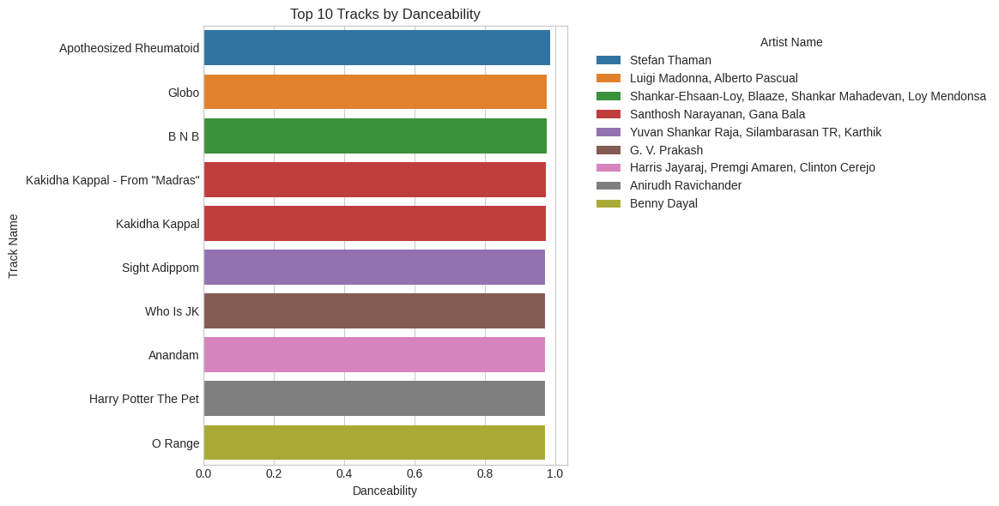


Numerical KPIs for Top 10 Tracks by Danceability:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,Apotheosized Rheumatoid,Stefan Thaman,0,0.986,0.250,0.469,0.008920,0.025900,0.1290,0.3020
1,Globo,"Luigi Madonna, Alberto Pascual",2,0.976,0.795,0.468,0.000883,0.654000,0.1330,0.1250
2,B N B,"Shankar-Ehsaan-Loy, Blaaze, Shankar Mahadevan,...",25,0.975,0.770,0.680,0.068900,0.000000,0.0526,0.0606
3,"Kakidha Kappal - From ""Madras""","Santhosh Narayanan, Gana Bala",0,0.973,0.614,0.886,0.281000,0.000000,0.0565,0.0466
4,Kakidha Kappal,"Santhosh Narayanan, Gana Bala",46,0.973,0.614,0.886,0.281000,0.000000,0.0565,0.0467
5,Sight Adippom,"Yuvan Shankar Raja, Silambarasan TR, Karthik",32,0.972,0.854,0.901,0.126000,0.000258,0.0202,0.1100
6,Who Is JK,G. V. Prakash,0,0.972,0.660,0.924,0.423000,0.000000,0.0991,0.0621
7,Anandam,"Harris Jayaraj, Premgi Amaren, Clinton Cerejo",33,0.970,0.522,0.624,0.050900,0.000003,0.0943,0.1690
8,Harry Potter The Pet,Anirudh Ravichander,15,0.970,0.324,0.954,0.900000,0.001230,0.1020,0.1920
9,O Range,Benny Dayal,50,0.970,0.817,0.306,0.070500,0.000000,0.1390,0.1130


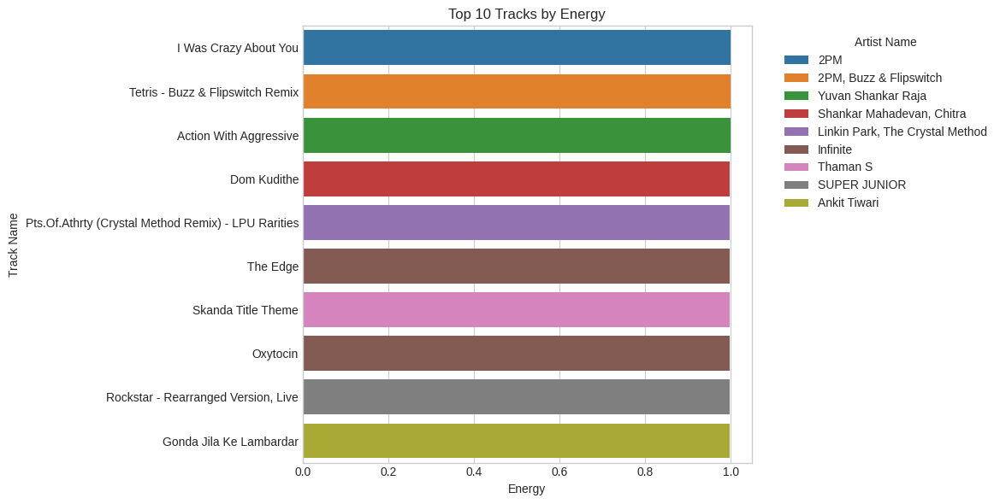


Numerical KPIs for Top 10 Tracks by Energy:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,I Was Crazy About You,2PM,23,0.638,0.999,0.3820,0.01500,0.000000,0.3470,0.0563
1,Tetris - Buzz & Flipswitch Remix,"2PM, Buzz & Flipswitch",0,0.657,0.999,0.0696,0.01570,0.907000,0.1050,0.0568
2,Action With Aggressive,Yuvan Shankar Raja,13,0.763,0.999,0.1130,0.29100,0.000235,0.2900,0.2470
3,Dom Kudithe,"Shankar Mahadevan, Chitra",26,0.718,0.998,0.6580,0.62400,0.079200,0.0506,0.1360
4,Pts.Of.Athrty (Crystal Method Remix) - LPU Rar...,"Linkin Park, The Crystal Method",26,0.600,0.998,0.5010,0.00798,0.008770,0.0674,0.1320
5,The Edge,Infinite,0,0.596,0.998,0.5500,0.10400,0.800000,0.3490,0.1020
6,Skanda Title Theme,Thaman S,9,0.460,0.998,0.0347,0.69900,0.973000,0.1800,0.0922
7,Oxytocin,Infinite,0,0.694,0.998,0.4230,0.00103,0.875000,0.1130,0.1220
8,"Rockstar - Rearranged Version, Live",SUPER JUNIOR,12,0.515,0.998,0.0590,0.04930,0.000004,0.9110,0.2420
9,Gonda Jila Ke Lambardar,Ankit Tiwari,0,0.785,0.998,0.7570,0.18700,0.309000,0.2980,0.2380


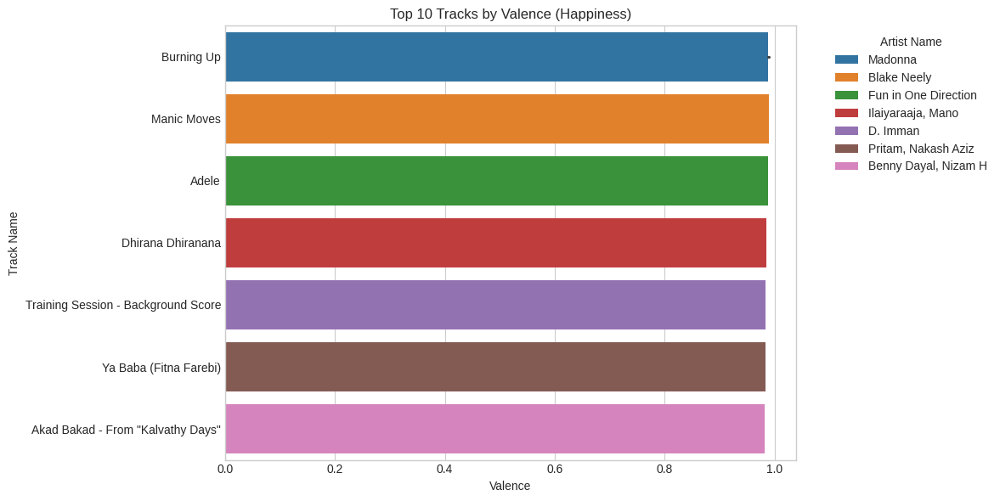


Numerical KPIs for Top 10 Tracks by Valence:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,Burning Up,Madonna,8,0.830,0.827,0.989,0.0424,0.000179,0.2620,0.1230
1,Burning Up,Madonna,36,0.830,0.827,0.989,0.0424,0.000179,0.2620,0.1230
2,Manic Moves,Blake Neely,0,0.697,0.676,0.989,0.0444,0.846000,0.1630,0.0670
3,Adele,Fun in One Direction,0,0.744,0.364,0.988,0.0441,0.892000,0.0767,0.2960
4,Burning Up,Madonna,44,0.869,0.738,0.988,0.0276,0.000960,0.2620,0.1100
5,Burning Up,Madonna,19,0.869,0.738,0.988,0.0276,0.000960,0.2620,0.1100
6,Dhirana Dhiranana,"Ilaiyaraaja, Mano",0,0.685,0.586,0.985,0.5930,0.000000,0.0522,0.1690
7,Training Session - Background Score,D. Imman,0,0.762,0.319,0.984,0.2120,0.926000,0.0756,0.0370
8,Ya Baba (Fitna Farebi),"Pritam, Nakash Aziz",27,0.867,0.883,0.983,0.3630,0.000000,0.0915,0.2410
9,"Akad Bakad - From ""Kalvathy Days""","Benny Dayal, Nizam H",0,0.858,0.756,0.982,0.2190,0.003720,0.0621,0.0378


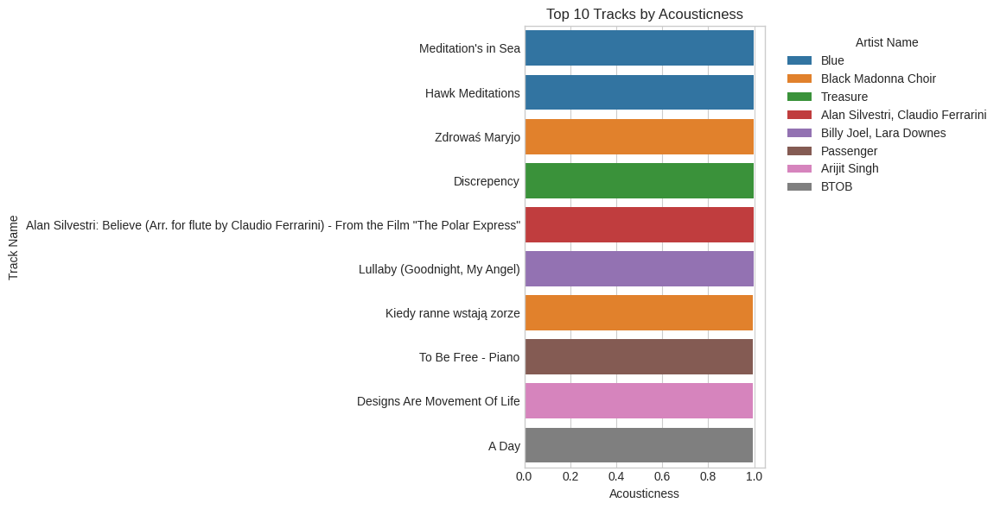


Numerical KPIs for Top 10 Tracks by Acousticness:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,Meditation's in Sea,Blue,0,0.238,0.0136,0.1220,0.996,0.952,0.1020,0.0439
1,Hawk Meditations,Blue,0,0.315,0.0315,0.2090,0.996,0.886,0.0908,0.0417
2,Zdrowaś Maryjo,Black Madonna Choir,0,0.297,0.1790,0.1170,0.996,0.826,0.0962,0.0461
3,Discrepency,Treasure,0,0.341,0.0065,0.1950,0.996,0.901,0.0857,0.0487
4,Alan Silvestri: Believe (Arr. for flute by Cla...,"Alan Silvestri, Claudio Ferrarini",4,0.203,0.2420,0.5440,0.996,0.885,0.1240,0.0431
5,"Lullaby (Goodnight, My Angel)","Billy Joel, Lara Downes",18,0.443,0.0800,0.0734,0.996,0.947,0.1490,0.0683
6,Kiedy ranne wstają zorze,Black Madonna Choir,0,0.373,0.1170,0.0783,0.995,0.322,0.1270,0.0724
7,To Be Free - Piano,Passenger,9,0.287,0.0760,0.3910,0.995,0.943,0.1110,0.0691
8,Designs Are Movement Of Life,Arijit Singh,8,0.341,0.1450,0.2210,0.995,0.836,0.2980,0.0418
9,A Day,BTOB,26,0.630,0.1610,0.6640,0.995,0.938,0.3170,0.0744


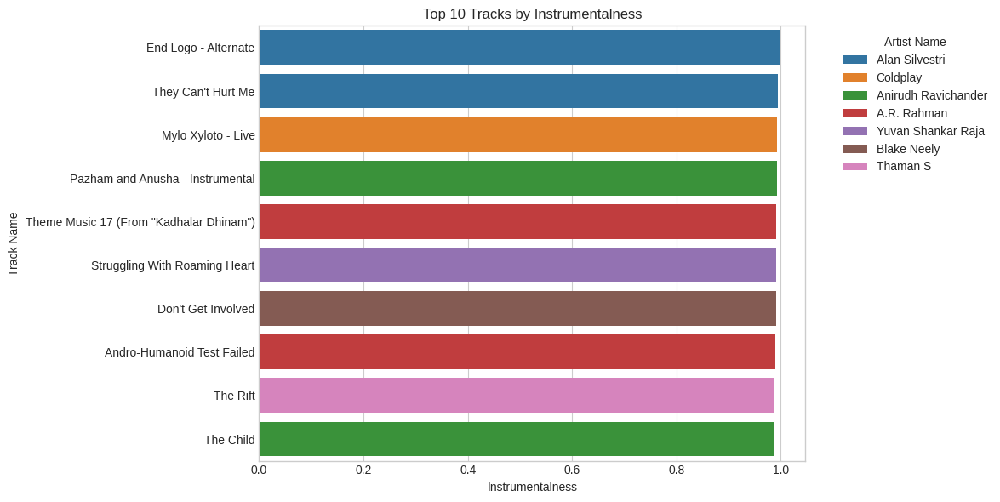


Numerical KPIs for Top 10 Tracks by Instrumentalness:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,End Logo - Alternate,Alan Silvestri,0,0.3420,0.3960,0.0000,0.295,0.997,0.1290,0.0364
1,They Can't Hurt Me,Alan Silvestri,16,0.2170,0.0111,0.0392,0.339,0.995,0.3140,0.0346
2,Mylo Xyloto - Live,Coldplay,37,0.0714,0.8810,0.0399,0.328,0.993,0.5830,0.1820
3,Pazham and Anusha - Instrumental,Anirudh Ravichander,32,0.6460,0.3000,0.8970,0.792,0.992,0.1140,0.0451
4,"Theme Music 17 (From ""Kadhalar Dhinam"")",A.R. Rahman,18,0.3300,0.5250,0.5020,0.497,0.991,0.2730,0.0387
5,Struggling With Roaming Heart,Yuvan Shankar Raja,4,0.5700,0.1980,0.8650,0.977,0.991,0.3290,0.0355
6,Don't Get Involved,Blake Neely,2,0.2260,0.0499,0.0619,0.883,0.991,0.0809,0.0377
7,Andro-Humanoid Test Failed,A.R. Rahman,10,0.0746,0.4280,0.1130,0.813,0.989,0.0946,0.0386
8,The Rift,Thaman S,8,0.5770,0.3240,0.2340,0.458,0.988,0.1050,0.0315
9,The Child,Anirudh Ravichander,36,0.2690,0.4120,0.0865,0.672,0.988,0.1180,0.0309


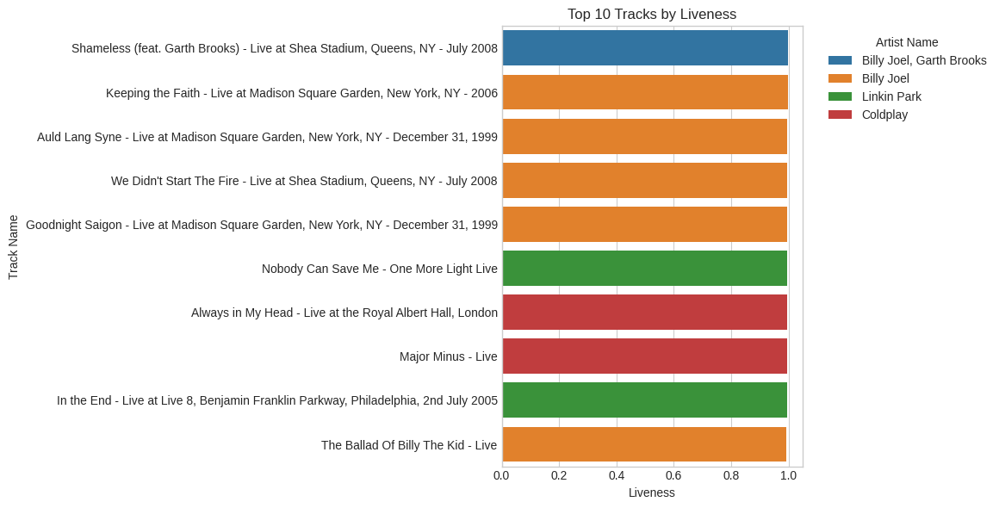


Numerical KPIs for Top 10 Tracks by Liveness:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,Shameless (feat. Garth Brooks) - Live at Shea ...,"Billy Joel, Garth Brooks",41,0.391,0.918,0.337,0.08390,0.000001,0.998,0.0473
1,Keeping the Faith - Live at Madison Square Gar...,Billy Joel,18,0.604,0.863,0.788,0.34100,0.000021,0.997,0.0550
2,Auld Lang Syne - Live at Madison Square Garden...,Billy Joel,10,0.276,0.589,0.319,0.04190,0.000000,0.996,0.0433
3,We Didn't Start The Fire - Live at Shea Stadiu...,Billy Joel,27,0.491,0.975,0.364,0.10600,0.000000,0.995,0.0939
4,Goodnight Saigon - Live at Madison Square Gard...,Billy Joel,13,0.299,0.625,0.165,0.07370,0.000414,0.995,0.0491
5,Nobody Can Save Me - One More Light Live,Linkin Park,36,0.544,0.678,0.487,0.46100,0.000001,0.994,0.0618
6,Always in My Head - Live at the Royal Albert H...,Coldplay,40,0.476,0.698,0.157,0.01590,0.569000,0.994,0.0332
7,Major Minus - Live,Coldplay,36,0.226,0.869,0.358,0.00159,0.106000,0.994,0.0579
8,"In the End - Live at Live 8, Benjamin Franklin...",Linkin Park,27,0.381,0.944,0.270,0.00522,0.000000,0.994,0.1880
9,The Ballad Of Billy The Kid - Live,Billy Joel,5,0.278,0.859,0.531,0.41200,0.001080,0.993,0.1860


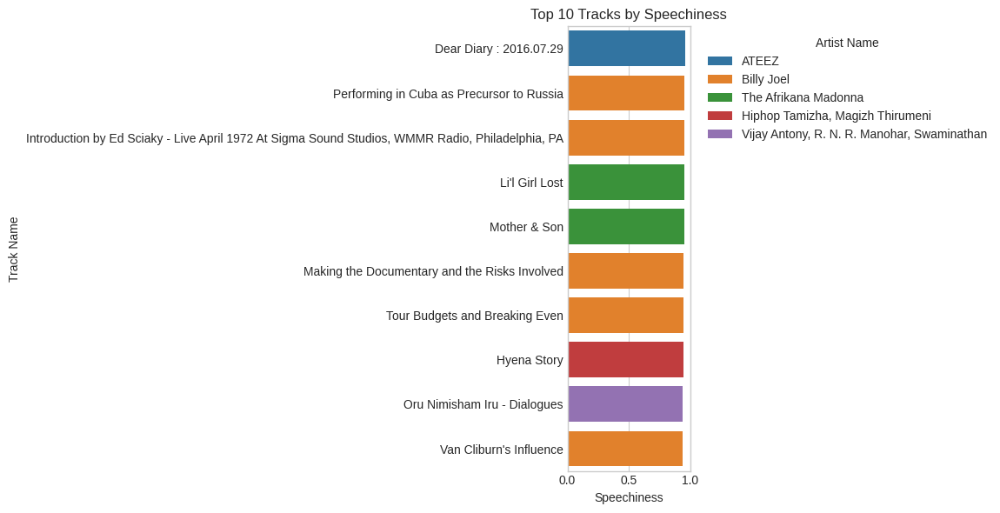


Numerical KPIs for Top 10 Tracks by Speechiness:


,track_name,artist_name,popularity,danceability,energy,valence,acousticness,instrumentalness,liveness,speechiness
0,Dear Diary : 2016.07.29,ATEEZ,36,0.558,0.534,0.511,0.680,0.000000,0.1020,0.957
1,Performing in Cuba as Precursor to Russia,Billy Joel,3,0.592,0.336,0.569,0.844,0.000000,0.2990,0.955
2,Introduction by Ed Sciaky - Live April 1972 At...,Billy Joel,1,0.446,0.835,0.562,0.881,0.000099,0.7610,0.954
3,Li'l Girl Lost,The Afrikana Madonna,0,0.636,0.366,0.273,0.793,0.000000,0.1110,0.953
4,Mother & Son,The Afrikana Madonna,0,0.772,0.365,0.506,0.696,0.000000,0.0816,0.950
5,Making the Documentary and the Risks Involved,Billy Joel,3,0.757,0.318,0.643,0.795,0.000000,0.4620,0.947
6,Tour Budgets and Breaking Even,Billy Joel,0,0.799,0.343,0.695,0.903,0.000000,0.4640,0.946
7,Hyena Story,"Hiphop Tamizha, Magizh Thirumeni",2,0.645,0.754,0.316,0.604,0.000000,0.1160,0.944
8,Oru Nimisham Iru - Dialogues,"Vijay Antony, R. N. R. Manohar, Swaminathan",0,0.812,0.358,0.858,0.830,0.000000,0.6260,0.942
9,Van Cliburn's Influence,Billy Joel,3,0.705,0.377,0.593,0.831,0.000000,0.5280,0.942


In [ ]:
# Visualizing Top 10 Tracks by Popularity
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming the Spotify dataset is loaded into a pandas DataFrame called 'df'
# with columns: 'track_name', 'artist_name', 'popularity', 'danceability', 'energy',
# 'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness'

# Select the top 10 tracks by popularity
top_10_popularity = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                        'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                        .sort_values(by='popularity', ascending=False).head(10)

# Reset index for cleaner display
top_10_popularity = top_10_popularity.reset_index(drop=True)

# Create a bar plot for popularity
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_popularity, x='popularity', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Popularity')
plt.xlabel('Popularity')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Popularity:")
display(top_10_popularity)
# Visualizing Top 10 Tracks by Danceability
# Select the top 10 tracks by danceability
top_10_danceability = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                         'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                         .sort_values(by='danceability', ascending=False).head(10)

# Reset index for cleaner display
top_10_danceability = top_10_danceability.reset_index(drop=True)

# Create a bar plot for danceability
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_danceability, x='danceability', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Danceability')
plt.xlabel('Danceability')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Danceability:")
display(top_10_danceability)
# Visualizing Top 10 Tracks by Energy
# Select the top 10 tracks by energy
top_10_energy = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                    'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                    .sort_values(by='energy', ascending=False).head(10)

# Reset index for cleaner display
top_10_energy = top_10_energy.reset_index(drop=True)

# Create a bar plot for energy
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_energy, x='energy', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Energy')
plt.xlabel('Energy')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Energy:")
display(top_10_energy)
# Visualizing Top 10 Tracks by Valence
# Select the top 10 tracks by valence
top_10_valence = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                     'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                     .sort_values(by='valence', ascending=False).head(10)

# Reset index for cleaner display
top_10_valence = top_10_valence.reset_index(drop=True)

# Create a bar plot for valence
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_valence, x='valence', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Valence (Happiness)')
plt.xlabel('Valence')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Valence:")
display(top_10_valence)
# Visualizing Top 10 Tracks by Acousticness
# Select the top 10 tracks by acousticness
top_10_acousticness = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                          'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                          .sort_values(by='acousticness', ascending=False).head(10)

# Reset index for cleaner display
top_10_acousticness = top_10_acousticness.reset_index(drop=True)

# Create a bar plot for acousticness
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_acousticness, x='acousticness', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Acousticness')
plt.xlabel('Acousticness')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Acousticness:")
display(top_10_acousticness)
# Visualizing Top 10 Tracks by Instrumentalness
# Select the top 10 tracks by instrumentalness
top_10_instrumentalness = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                             'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                             .sort_values(by='instrumentalness', ascending=False).head(10)

# Reset index for cleaner display
top_10_instrumentalness = top_10_instrumentalness.reset_index(drop=True)

# Create a bar plot for instrumentalness
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_instrumentalness, x='instrumentalness', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Instrumentalness')
plt.xlabel('Instrumentalness')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Instrumentalness:")
display(top_10_instrumentalness)
# Visualizing Top 10 Tracks by Liveness
# Select the top 10 tracks by liveness
top_10_liveness = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                      'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                      .sort_values(by='liveness', ascending=False).head(10)

# Reset index for cleaner display
top_10_liveness = top_10_liveness.reset_index(drop=True)

# Create a bar plot for liveness
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_liveness, x='liveness', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Liveness')
plt.xlabel('Liveness')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Liveness:")
display(top_10_liveness)
# Visualizing Top 10 Tracks by Speechiness
# Select the top 10 tracks by speechiness
top_10_speechiness = df[['track_name', 'artist_name', 'popularity', 'danceability', 'energy',
                         'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness']]\
                         .sort_values(by='speechiness', ascending=False).head(10)

# Reset index for cleaner display
top_10_speechiness = top_10_speechiness.reset_index(drop=True)

# Create a bar plot for speechiness
plt.figure(figsize=(12, 6))
sns.barplot(data=top_10_speechiness, x='speechiness', y='track_name', hue='artist_name', dodge=False)
plt.title('Top 10 Tracks by Speechiness')
plt.xlabel('Speechiness')
plt.ylabel('Track Name')
plt.legend(title='Artist Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Display a table of numerical KPIs
print("\nNumerical KPIs for Top 10 Tracks by Speechiness:")
display(top_10_speechiness)

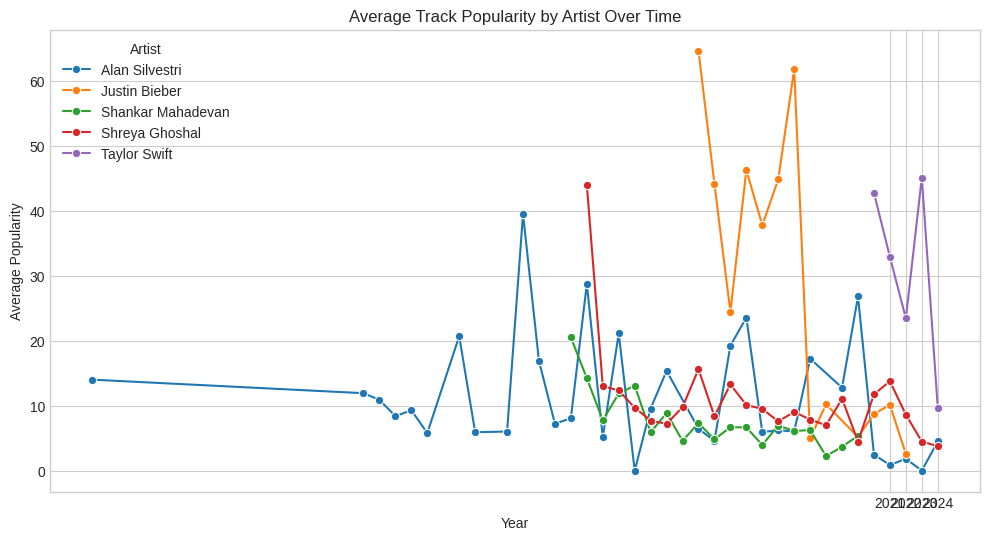

In [ ]:
# Explode artist_name to handle multiple artists per track
df_exploded = df.explode('artist_name')

# Calculate average popularity per artist per year
artist_year_pop = df_exploded.groupby(['artist_name', 'year'])['popularity'].mean().reset_index()

# Filter top artists (appearing in >= 5 tracks)
top_artists = df_exploded['artist_name'].value_counts().head(5).index
artist_year_pop = artist_year_pop[artist_year_pop['artist_name'].isin(top_artists)]

plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='popularity', hue='artist_name', marker='o', data=artist_year_pop)
plt.title('Average Track Popularity by Artist Over Time')
plt.xlabel('Year')
plt.ylabel('Average Popularity')
plt.legend(title='Artist')
plt.xticks([2021, 2022, 2023, 2024])
plt.show()

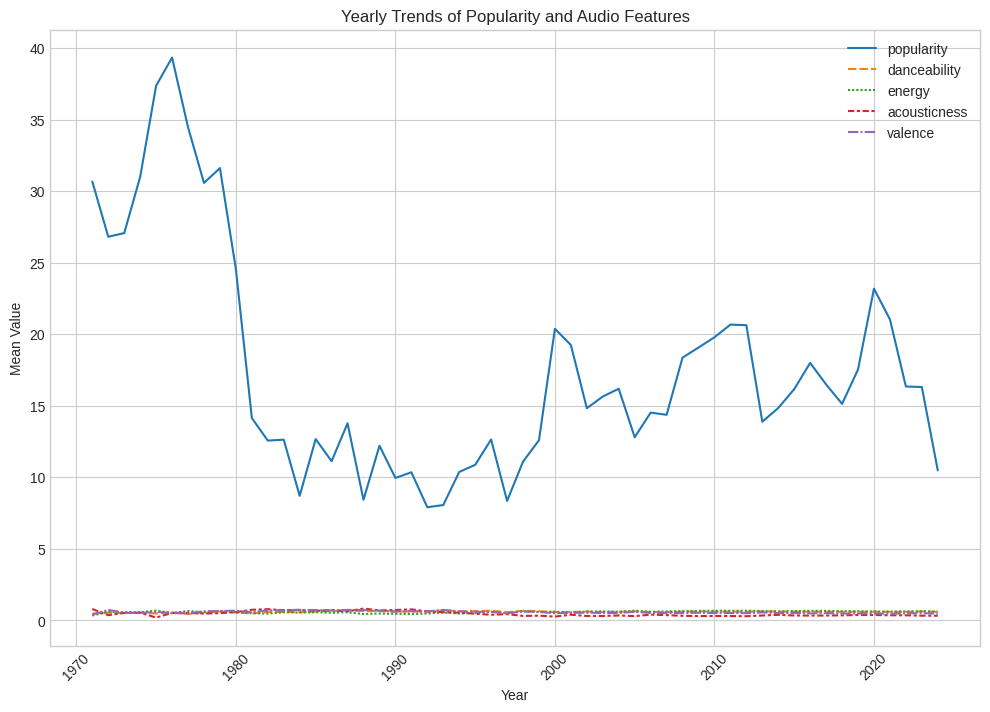

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


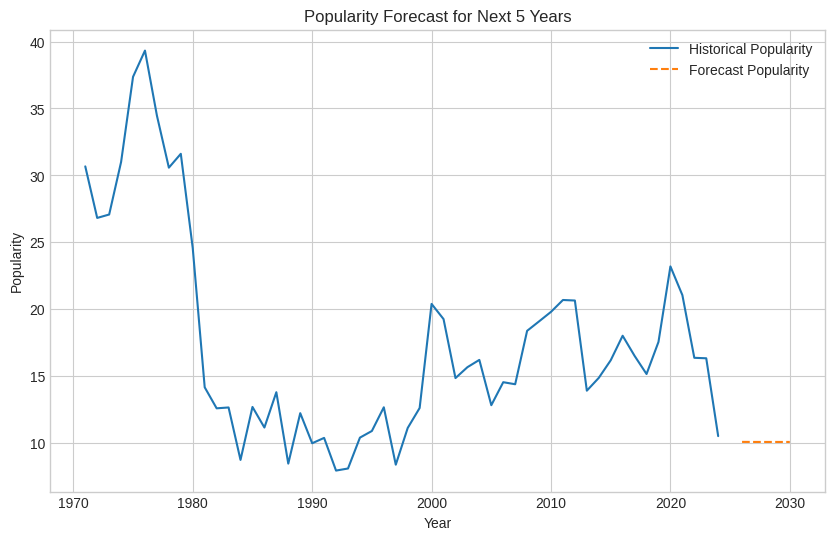

In [ ]:

from statsmodels.tsa.arima.model import ARIMA

yearly_data = df.groupby('year').agg({
    'popularity': 'mean',
    'danceability': 'mean',
    'energy': 'mean',
    'acousticness': 'mean',
    'valence': 'mean',
    'tempo': 'mean',
    'loudness': 'mean',
    'speechiness': 'mean'
}).reset_index()

yearly_data['year'] = pd.to_datetime(yearly_data['year'], format='%Y')
yearly_data.set_index('year', inplace=True)

plt.figure(figsize=(12, 8))
sns.lineplot(data=yearly_data[['popularity', 'danceability', 'energy', 'acousticness', 'valence']])
plt.xlabel('Year')
plt.ylabel('Mean Value')
plt.title('Yearly Trends of Popularity and Audio Features')
plt.xticks(rotation=45)
plt.show()

popularity_series = yearly_data['popularity']
model = ARIMA(popularity_series, order=(1,1,1))
model_fit = model.fit()
forecast = model_fit.get_forecast(steps=5)

forecast_index = pd.date_range(start=yearly_data.index.max() + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_series = pd.Series(forecast.predicted_mean.values, index=forecast_index)

plt.figure(figsize=(10, 6))
plt.plot(popularity_series, label='Historical Popularity')
plt.plot(forecast_series, label='Forecast Popularity', linestyle='--')
plt.xlabel('Year')
plt.ylabel('Popularity')
plt.title('Popularity Forecast for Next 5 Years')
plt.legend()
plt.show()


In [ ]:

yearly_stats = df.groupby('year').agg({
    'popularity': 'mean',
    'energy': 'mean',
    'danceability': 'mean',
    'valence': 'mean'
}).reset_index()

print(yearly_stats.head())


   year  popularity    energy  danceability   valence
0  1971   30.666667  0.332800      0.467250  0.397050
1  1972   26.809524  0.585905      0.534714  0.722048
2  1973   27.064516  0.568048      0.502290  0.533889
3  1974   31.000000  0.565290      0.523000  0.502420
4  1975   37.368421  0.678789      0.478421  0.597632


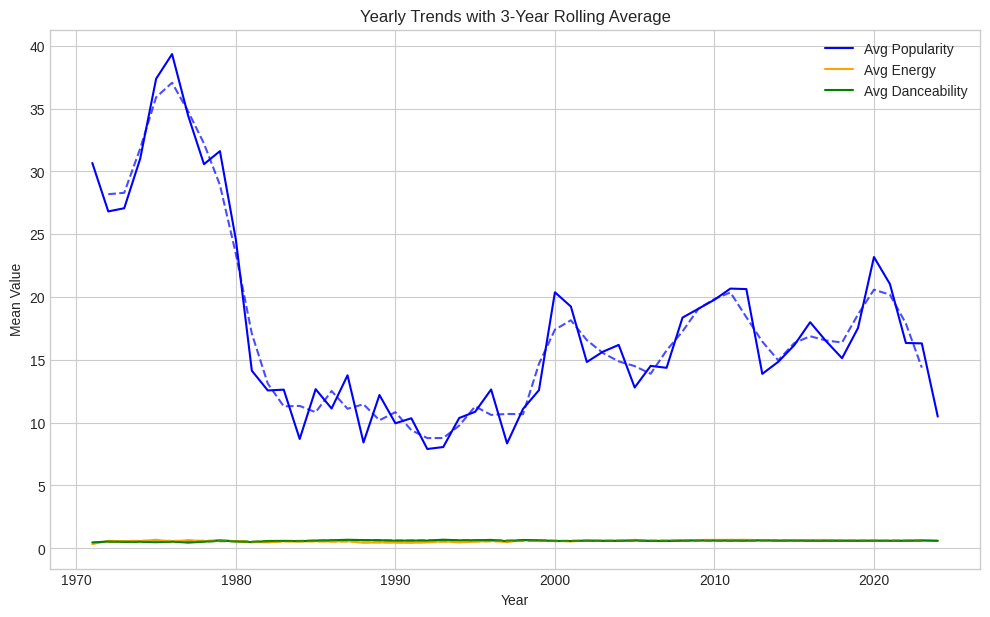

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 7))
plt.plot(yearly_stats['year'], yearly_stats['popularity'], label='Avg Popularity', color='blue')
plt.plot(yearly_stats['year'], yearly_stats['energy'], label='Avg Energy', color='orange')
plt.plot(yearly_stats['year'], yearly_stats['danceability'], label='Avg Danceability', color='green')

# Optional rolling mean
rolling_window = 3
plt.plot(yearly_stats['year'], yearly_stats['popularity'].rolling(rolling_window, center=True).mean(), linestyle='--', color='blue', alpha=0.7)
plt.plot(yearly_stats['year'], yearly_stats['energy'].rolling(rolling_window, center=True).mean(), linestyle='--', color='orange', alpha=0.7)
plt.plot(yearly_stats['year'], yearly_stats['danceability'].rolling(rolling_window, center=True).mean(), linestyle='--', color='green', alpha=0.7)

plt.xlabel('Year')
plt.ylabel('Mean Value')
plt.title(f'Yearly Trends with {rolling_window}-Year Rolling Average')
plt.legend()
plt.show()


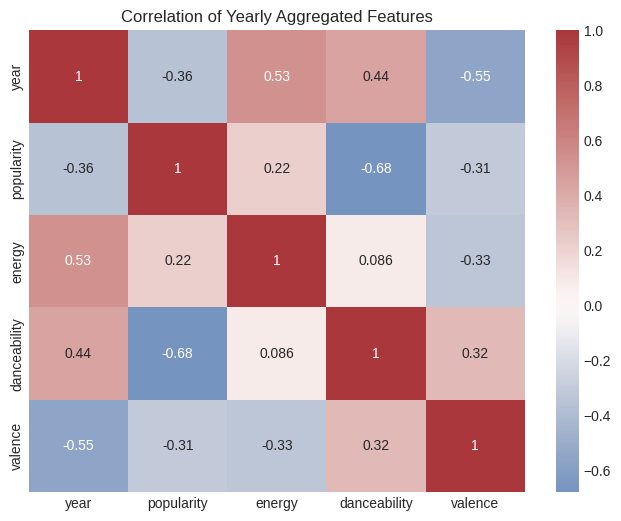

In [ ]:
import seaborn as sns

plt.figure(figsize=(8,6))
sns.heatmap(yearly_stats.corr(), annot=True, cmap='vlag', center=0)
plt.title('Correlation of Yearly Aggregated Features')
plt.show()


In [ ]:
yearly_stats = df.groupby('year').agg({
    'popularity': 'mean',
    'energy': 'mean',
    'danceability': 'mean',
    'valence': 'mean'
}).reset_index()


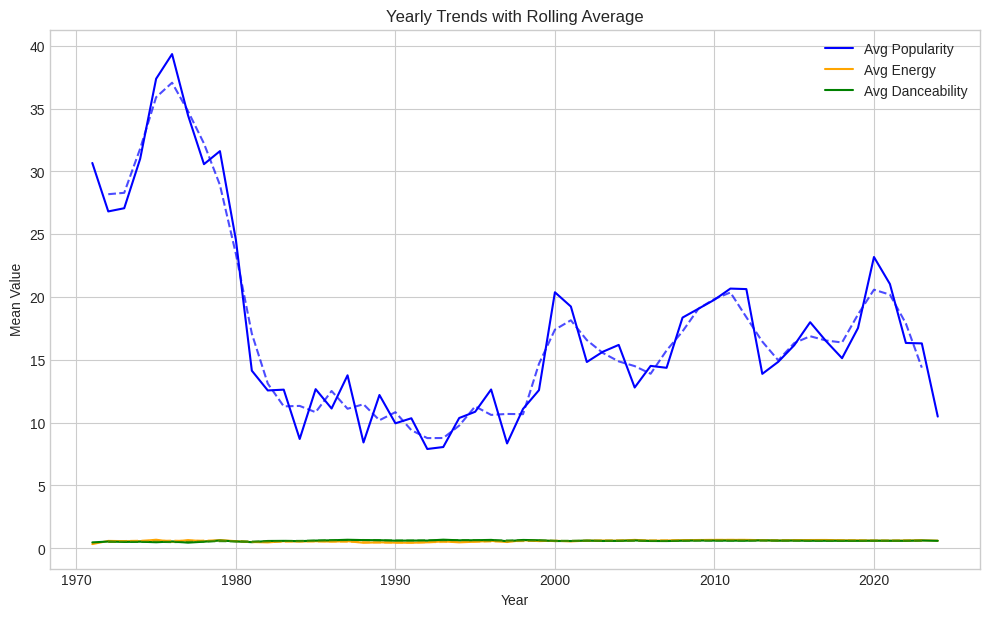

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 7))
plt.plot(yearly_stats['year'], yearly_stats['popularity'], label='Avg Popularity', color='blue')
plt.plot(yearly_stats['year'], yearly_stats['energy'], label='Avg Energy', color='orange')
plt.plot(yearly_stats['year'], yearly_stats['danceability'], label='Avg Danceability', color='green')

rolling_window = 3
plt.plot(yearly_stats['year'], yearly_stats['popularity'].rolling(rolling_window, center=True).mean(), linestyle='--', color='blue', alpha=0.7)
plt.plot(yearly_stats['year'], yearly_stats['energy'].rolling(rolling_window, center=True).mean(), linestyle='--', color='orange', alpha=0.7)
plt.plot(yearly_stats['year'], yearly_stats['danceability'].rolling(rolling_window, center=True).mean(), linestyle='--', color='green', alpha=0.7)

plt.xlabel('Year')
plt.ylabel('Mean Value')
plt.title('Yearly Trends with Rolling Average')
plt.legend()
plt.show()


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


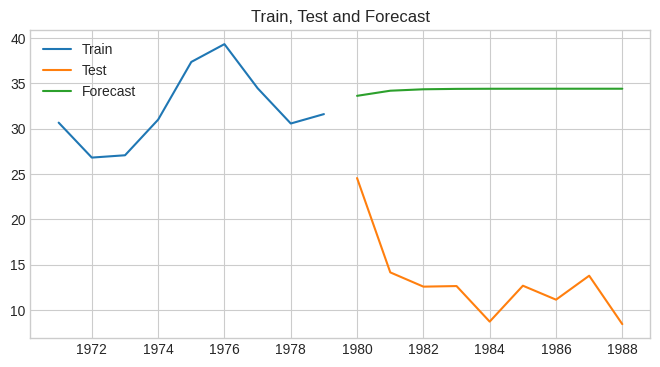

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


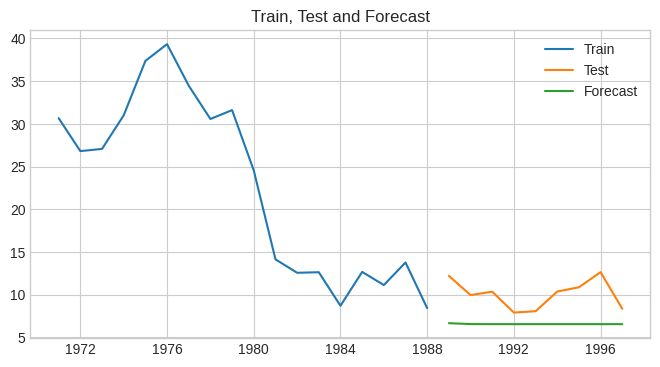

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


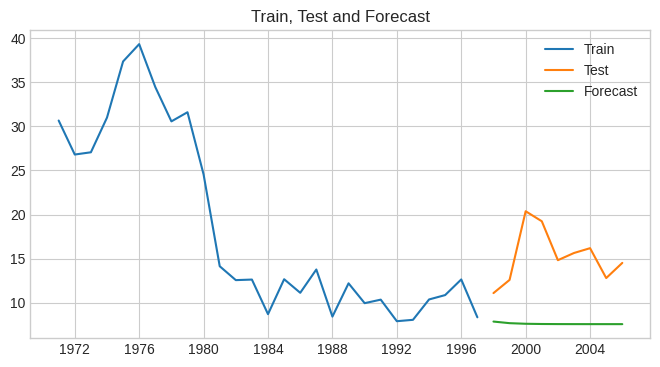

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


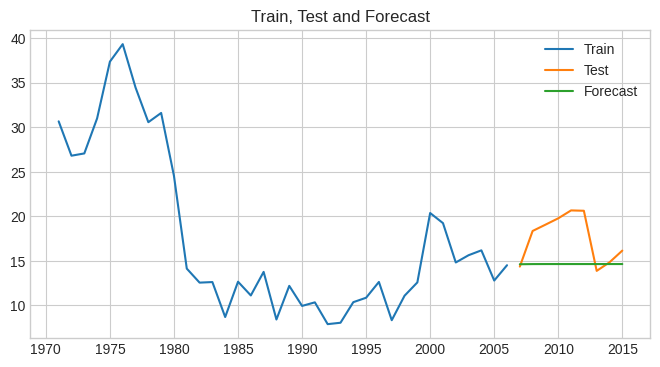

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


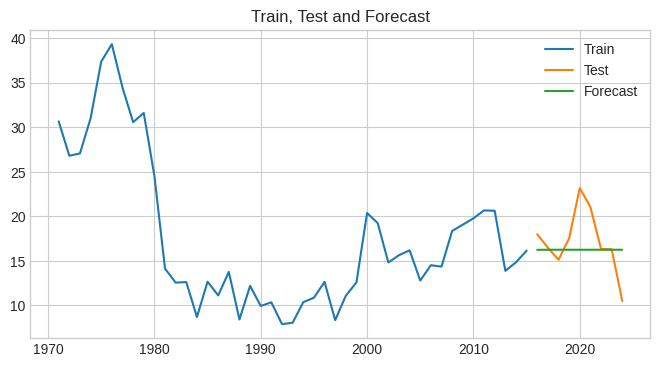

MSE scores: [467.89034768523845, 14.923406641569919, 66.76026262913282, 14.97287571806524, 12.241698543308356]
Average MSE: 115.35771824346293


In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import numpy as np

popularity_series = yearly_data['popularity']
tscv = TimeSeriesSplit(n_splits=5)

mse_scores = []

for train_idx, test_idx in tscv.split(popularity_series):
    train, test = popularity_series.iloc[train_idx], popularity_series.iloc[test_idx]
    model = ARIMA(train, order=(1,1,1))
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=len(test))
    mse = mean_squared_error(test, forecast)
    mse_scores.append(mse)

    plt.figure(figsize=(8, 4))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    plt.plot(test.index, forecast, label='Forecast')
    plt.legend()
    plt.title('Train, Test and Forecast')
    plt.show()

print(f'MSE scores: {mse_scores}')
print(f'Average MSE: {np.mean(mse_scores)}')


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmplx1c_jh5/cjkv76vo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmplx1c_jh5/ggynk_x7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdSt

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


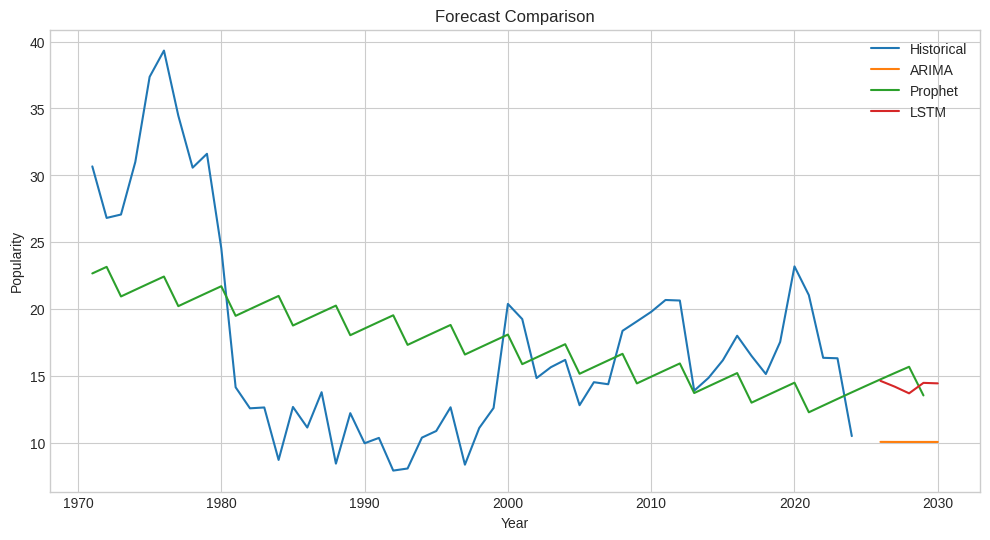

In [ ]:
from prophet import Prophet
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.arima.model import ARIMA

# ARIMA
arima_model = ARIMA(yearly_data['popularity'], order=(1,1,1))
arima_fit = arima_model.fit()
arima_forecast = arima_fit.forecast(steps=5)

# Prophet
prophet_df = yearly_data.reset_index().rename(columns={'year':'ds','popularity':'y'})
prophet_model = Prophet(yearly_seasonality=True)
prophet_model.fit(prophet_df)
future = prophet_model.make_future_dataframe(periods=5, freq='Y')
prophet_forecast = prophet_model.predict(future)

# LSTM
scaler = MinMaxScaler()
pop_scaled = scaler.fit_transform(yearly_data['popularity'].values.reshape(-1,1))

def create_sequences(data, seq_len):
    xs, ys = [], []
    for i in range(len(data)-seq_len):
        xs.append(data[i:i+seq_len])
        ys.append(data[i+seq_len])
    return np.array(xs), np.array(ys)

seq_len = 3
X, y = create_sequences(pop_scaled, seq_len)

train_size = int(len(X)*0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(seq_len, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit(X_train, y_train, epochs=100, verbose=0)

lstm_preds_scaled = model.predict(X_test)
lstm_preds = scaler.inverse_transform(lstm_preds_scaled)

# Forecast future 5 steps
lstm_input = pop_scaled[-seq_len:]
lstm_forecast = []
for _ in range(5):
    pred = model.predict(lstm_input.reshape(1, seq_len, 1))[0]
    lstm_forecast.append(pred)
    lstm_input = np.append(lstm_input[1:], pred)

lstm_forecast = scaler.inverse_transform(lstm_forecast).flatten()

plt.figure(figsize=(12,6))
plt.plot(yearly_data.index, yearly_data['popularity'], label='Historical')
plt.plot(pd.date_range(yearly_data.index[-1], periods=6, freq='Y')[1:], arima_forecast, label='ARIMA')
plt.plot(prophet_forecast['ds'], prophet_forecast['yhat'], label='Prophet')
plt.plot(pd.date_range(yearly_data.index[-1], periods=6, freq='Y')[1:], lstm_forecast, label='LSTM')
plt.legend()
plt.title('Forecast Comparison')
plt.xlabel('Year')
plt.ylabel('Popularity')
plt.show()


# Correlation and Causation Over Time:

Explore how correlations between features and popularity evolve over time, not just static correlation.

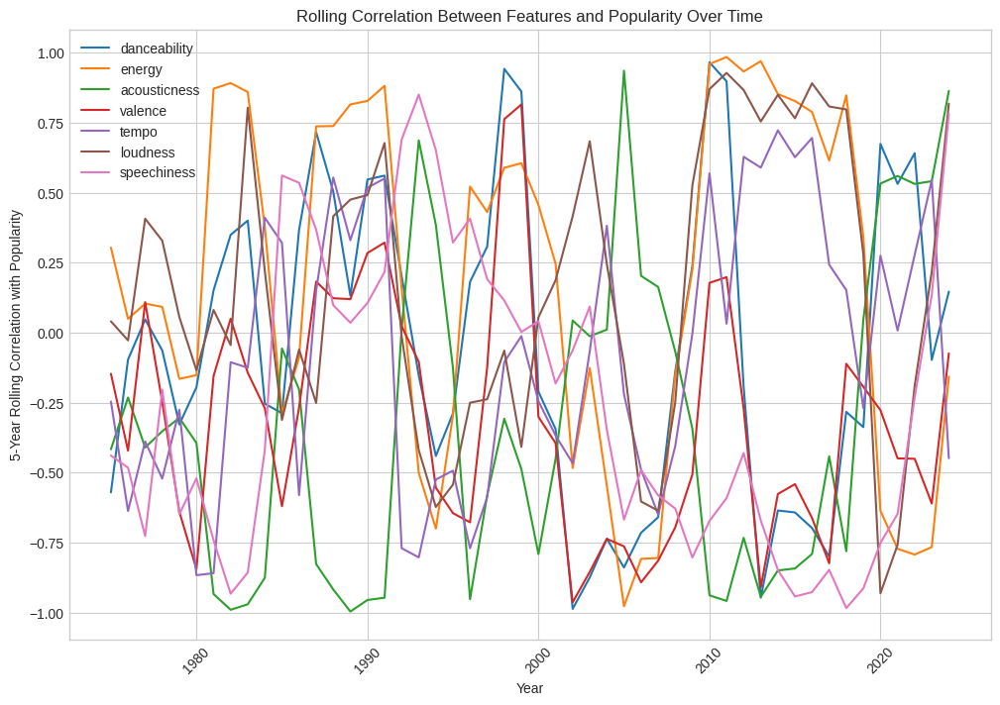

In [ ]:
# Aggregate by year and set index
yearly_data = df.groupby('year').agg({
    'popularity': 'mean',
    'danceability': 'mean',
    'energy': 'mean',
    'acousticness': 'mean',
    'valence': 'mean',
    'tempo': 'mean',
    'loudness': 'mean',
    'speechiness': 'mean'
}).reset_index()
yearly_data['year'] = pd.to_datetime(yearly_data['year'], format='%Y')
yearly_data.set_index('year', inplace=True)

window_size = 5

# DataFrame to store rolling correlations
rolling_corr = pd.DataFrame(index=yearly_data.index)

for feature in ['danceability', 'energy', 'acousticness', 'valence', 'tempo', 'loudness', 'speechiness']:
    rolling_corr[feature] = yearly_data['popularity'].rolling(window=window_size).corr(yearly_data[feature])

# Plot rolling correlations
plt.figure(figsize=(12, 8))
for feature in rolling_corr.columns:
    plt.plot(rolling_corr.index, rolling_corr[feature], label=feature)
plt.xlabel('Year')
plt.ylabel(f'{window_size}-Year Rolling Correlation with Popularity')
plt.title('Rolling Correlation Between Features and Popularity Over Time')
plt.legend()
plt.xticks(rotation=45)
plt.show()


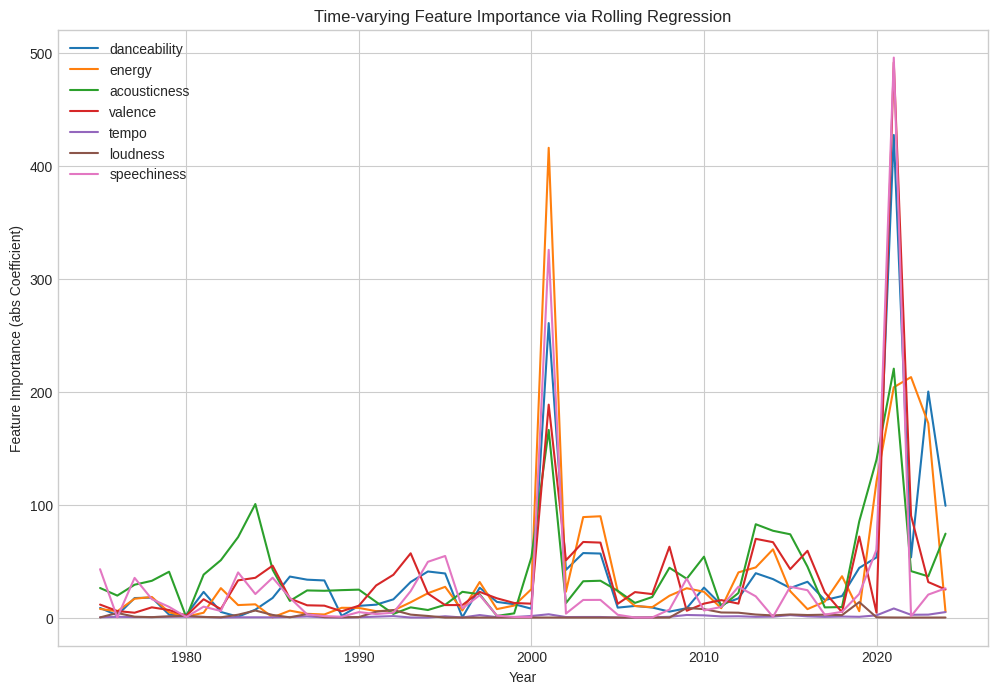

In [ ]:

from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

window_size = 5

# Prepare storage for importance scores
importance_scores = {feature: [] for feature in ['danceability', 'energy', 'acousticness', 'valence', 'tempo', 'loudness', 'speechiness']}
dates = []

# Loop over rolling windows
for start_idx in range(len(yearly_data) - window_size + 1):
    end_idx = start_idx + window_size
    window_data = yearly_data.iloc[start_idx:end_idx]
    X = window_data[[feature for feature in importance_scores]]
    y = window_data['popularity']
    model = LinearRegression()
    model.fit(X, y)
    # Store absolute coefficients as importance
    for idx, feature in enumerate(importance_scores):
        importance_scores[feature].append(np.abs(model.coef_[idx]))
    dates.append(window_data.index[-1])

# Plot the feature importance over time
plt.figure(figsize=(12, 8))
for feature, scores in importance_scores.items():
    plt.plot(dates, scores, label=feature)
plt.xlabel('Year')
plt.ylabel('Feature Importance (abs Coefficient)')
plt.title('Time-varying Feature Importance via Rolling Regression')
plt.legend()
plt.show()


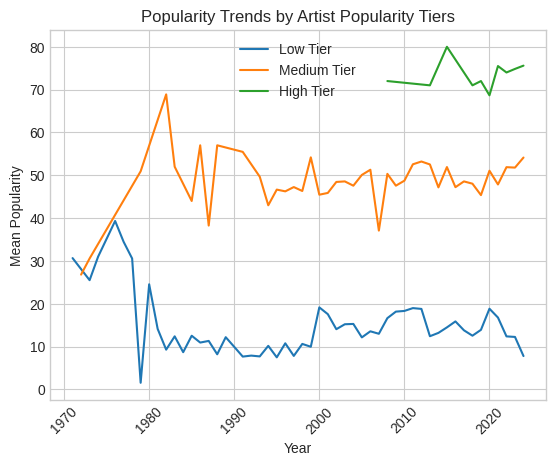

In [ ]:

artist_pop = df.groupby('artist_name')['popularity'].mean().reset_index()

# Define bins for tiers
bins = [0, 40, 70, 100]
labels = ['Low', 'Medium', 'High']
artist_pop['popularity_tier'] = pd.cut(artist_pop['popularity'], bins=bins, labels=labels, include_lowest=True)

# Map back to main dataframe
df = df.merge(artist_pop[['artist_name', 'popularity_tier']], on='artist_name', how='left')

# Now analyze trends per tier
for tier in labels:
    tier_data = df[df['popularity_tier'] == tier]
    yearly_tier_data = tier_data.groupby('year').agg({'popularity': 'mean'}).reset_index()
    plt.plot(yearly_tier_data['year'], yearly_tier_data['popularity'], label=f'{tier} Tier')

plt.xlabel('Year')
plt.ylabel('Mean Popularity')
plt.title('Popularity Trends by Artist Popularity Tiers')
plt.legend()
plt.xticks(rotation=45)
plt.show()


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


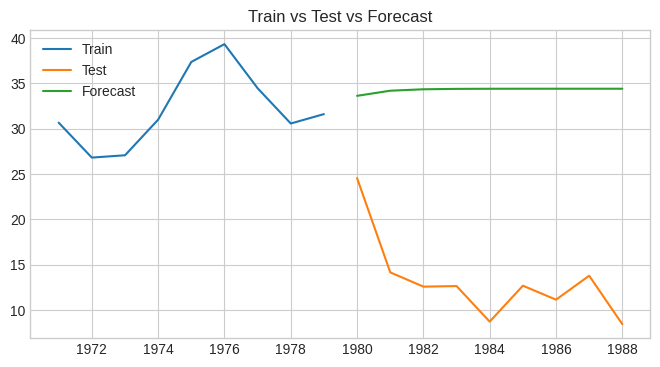

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


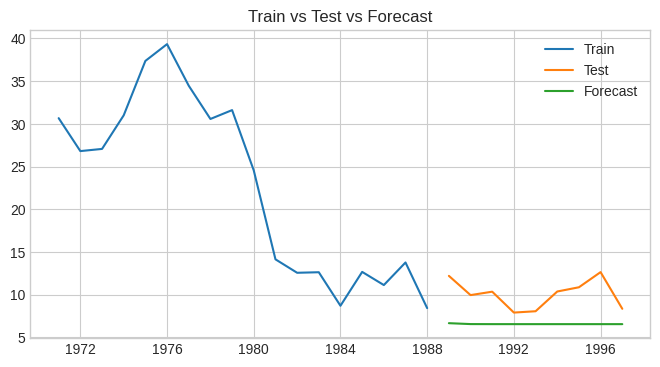

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


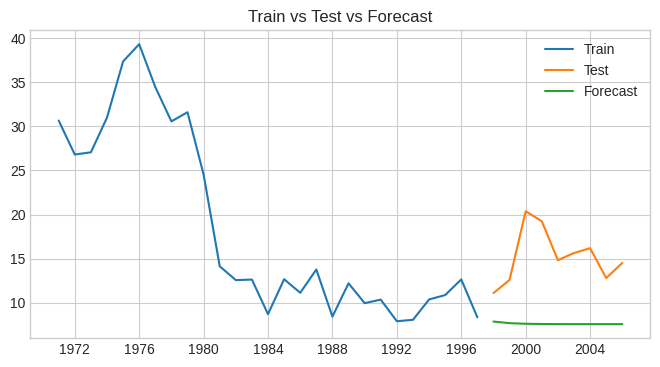

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


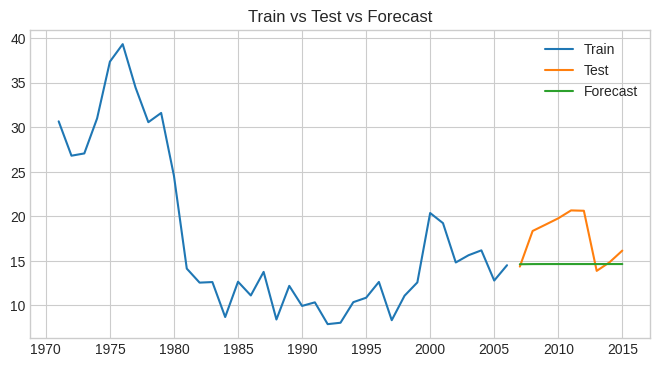

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


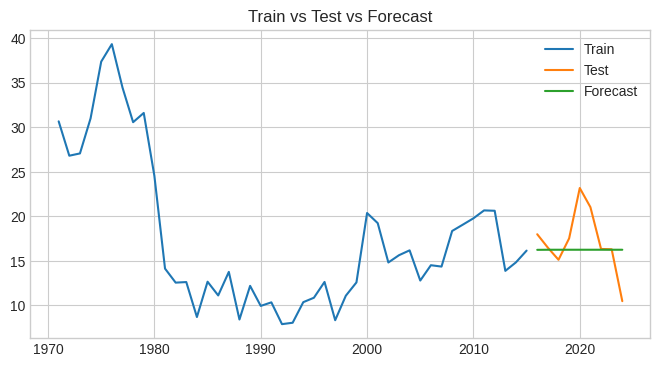

Mean Squared Errors for each fold: [467.89034768523845, 14.923406641569919, 66.76026262913282, 14.97287571806524, 12.241698543308356]
Average MSE: 115.35771824346293


In [ ]:

from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

popularity_series = yearly_data['popularity']

# Initialize time series cross-validator
tscv = TimeSeriesSplit(n_splits=5)

mse_scores = []

# Perform time series cross-validation
for train_index, test_index in tscv.split(popularity_series):
    train, test = popularity_series.iloc[train_index], popularity_series.iloc[test_index]

    # Fit ARIMA model on training data (order can be tuned)
    model = ARIMA(train, order=(1,1,1))
    model_fit = model.fit()

    # Forecast for length of test set
    forecast = model_fit.forecast(steps=len(test))

    # Calculate mean squared error for this split
    mse = mean_squared_error(test, forecast)
    mse_scores.append(mse)

    # Optional: plot actual vs forecast for each fold
    plt.figure(figsize=(8,4))
    plt.plot(train.index, train, label='Train')
    plt.plot(test.index, test, label='Test')
    plt.plot(test.index, forecast, label='Forecast')
    plt.title('Train vs Test vs Forecast')
    plt.legend()
    plt.show()

print('Mean Squared Errors for each fold:', mse_scores)
print('Average MSE:', np.mean(mse_scores))


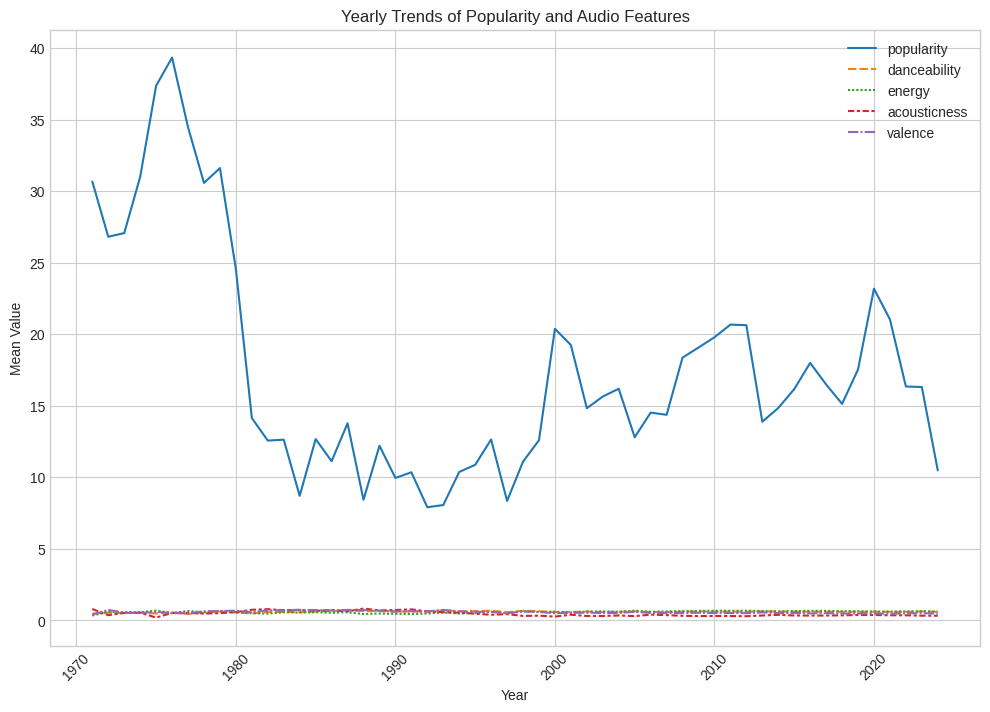

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


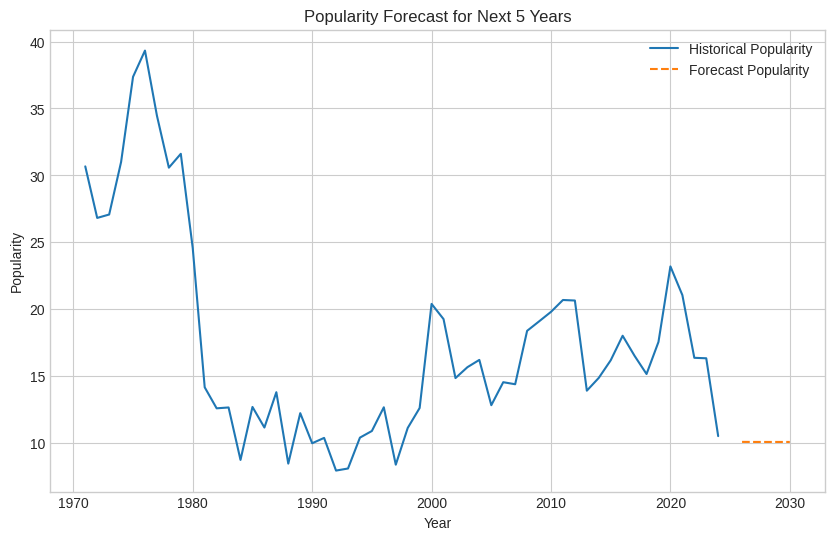

In [ ]:
# Aggregate data by year for time series analysis
yearly_data = df.groupby('year').agg({
    'popularity': 'mean',
    'danceability': 'mean',
    'energy': 'mean',
    'acousticness': 'mean',
    'valence': 'mean',
    'tempo': 'mean',
    'loudness': 'mean',
    'speechiness': 'mean'
}).reset_index()

# Set 'year' as datetime index (assuming year is integer)
yearly_data['year'] = pd.to_datetime(yearly_data['year'], format='%Y')
yearly_data.set_index('year', inplace=True)

# Plot trends over years for selected features
plt.figure(figsize=(12, 8))
sns.lineplot(data=yearly_data[['popularity', 'danceability', 'energy', 'acousticness', 'valence']])
plt.xlabel('Year')
plt.ylabel('Mean Value')
plt.title('Yearly Trends of Popularity and Audio Features')
plt.xticks(rotation=45)
plt.show()

# ARIMA model to forecast popularity
popularity_series = yearly_data['popularity']
model = ARIMA(popularity_series, order=(1,1,1))
model_fit = model.fit()
forecast = model_fit.get_forecast(steps=5)
forecast_index = pd.date_range(start=yearly_data.index.max() + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_series = pd.Series(forecast.predicted_mean.values, index=forecast_index)

# Plot actual and forecast popularity
plt.figure(figsize=(10, 6))
plt.plot(popularity_series, label='Historical Popularity')
plt.plot(forecast_series, label='Forecast Popularity', linestyle='--')
plt.xlabel('Year')
plt.ylabel('Popularity')
plt.title('Popularity Forecast for Next 5 Years')
plt.legend()
plt.show()


#Anomaly Detection:
Identify outlier years or songs with unusual feature values or popularity spikes to highlight exceptional trends or events.

In [ ]:
import pandas as pd

# List of features to cluster on
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'valence', 'tempo', 'loudness']

# Drop rows with missing values in these features
clustering_data = df[features].dropna()

# Optional: Select a subset based on some criteria, e.g., recent songs or high popularity


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(clustering_data)


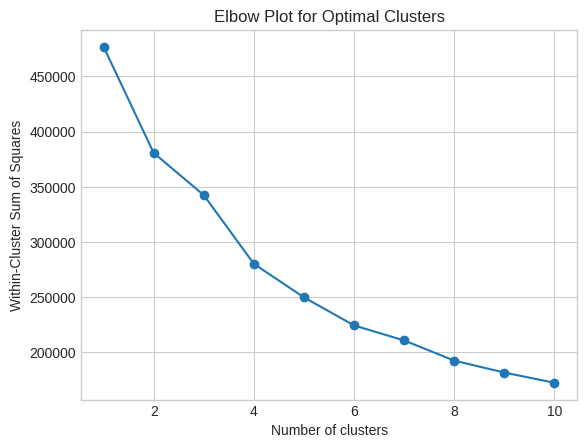

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Within-Cluster Sum of Squares')
plt.title('Elbow Plot for Optimal Clusters')
plt.show()


In [ ]:
n_clusters = 4  # change based on elbow plot
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clustering_data['cluster'] = kmeans.fit_predict(X_scaled)


In [ ]:
n_clusters = 4  # change based on elbow plot
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clustering_data['cluster'] = kmeans.fit_predict(X_scaled)


In [ ]:
cluster_profiles = clustering_data.groupby('cluster')[features].mean()
print(cluster_profiles.round(3))


         acousticness  danceability  energy  instrumentalness  liveness  \
cluster                                                                   
0               0.597         0.355   0.313             0.799     0.158   
1               0.183         0.682   0.760             0.049     0.216   
2               0.613         0.543   0.462             0.018     0.169   
3              -1.000        -1.000  -1.000            -1.000    -1.000   

         speechiness  valence    tempo    loudness  
cluster                                             
0              0.049    0.165  110.897     -16.879  
1              0.105    0.625  121.831      -6.393  
2              0.052    0.413  114.495      -9.435  
3             -1.000   -1.000   -1.000 -100000.000  


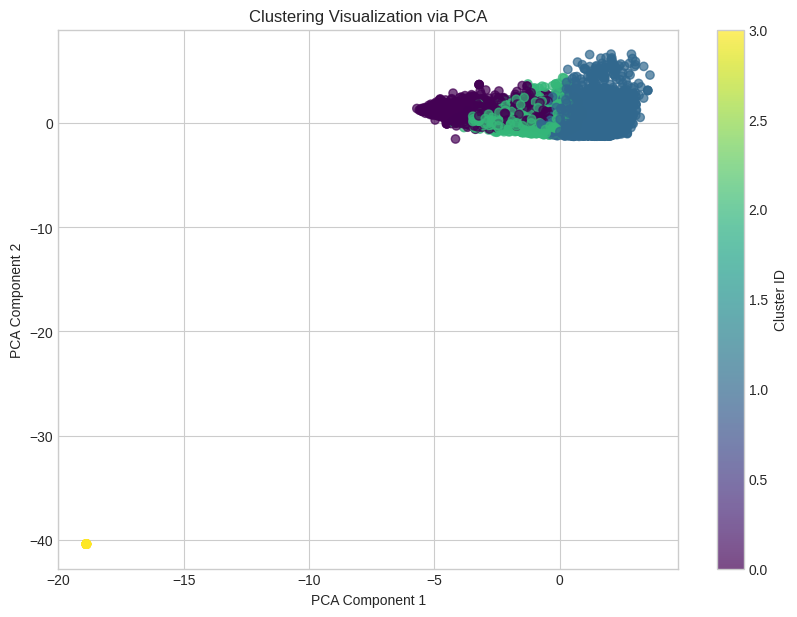

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 7))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clustering_data['cluster'], cmap='viridis', alpha=0.7)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Clustering Visualization via PCA')
plt.colorbar(label='Cluster ID')
plt.show()


In [ ]:
# Calculate z-scores for popularity
yearly_data['popularity_zscore'] = (yearly_data['popularity'] - yearly_data['popularity'].mean()) / yearly_data['popularity'].std()

threshold = 3
outliers = yearly_data[np.abs(yearly_data['popularity_zscore']) > threshold]

print("Outlier years based on popularity:")
print(outliers[['popularity', 'popularity_zscore']])

# For individual songs
df['popularity_zscore'] = (df['popularity'] - df['popularity'].mean()) / df['popularity'].std()
song_outliers = df[np.abs(df['popularity_zscore']) > threshold]

print("Outlier songs based on popularity:")
print(song_outliers[['track_name', 'artist_name', 'year', 'popularity', 'popularity_zscore']])


Outlier years based on popularity:
Empty DataFrame
Columns: [popularity, popularity_zscore]
Index: []
Outlier songs based on popularity:
                                            track_name  \
38                                             Chaleya   
39                              Chaleya (From "Jawan")   
7137                          Satranga (From "ANIMAL")   
14111                                  Tere Pyaar Mein   
14113                           O Maahi (From "Dunki")   
...                                                ...   
49401                                        Big Dawgs   
51232                                    Like a Prayer   
51772                                          Hung Up   
51952                                    Like a Prayer   
51953  4 Minutes (feat. Justin Timberlake & Timbaland)   

                                             artist_name  year  popularity  \
38     Anirudh Ravichander, Arijit Singh, Shilpa Rao,...  2023          76   
39     Ani

# Insights:
Each cluster will show different characteristic features, e.g., energetic/uptempo vs mellow/softer tracks.

You can label clusters based on their centroid feature values for interpretability.


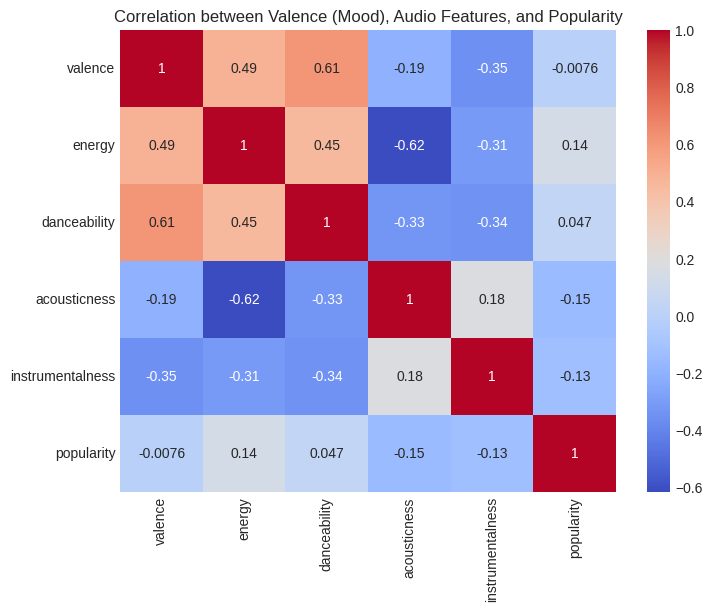

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

features_of_interest = ['valence', 'energy', 'danceability', 'acousticness', 'instrumentalness', 'popularity']
corr_matrix = df[features_of_interest].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation between Valence (Mood), Audio Features, and Popularity')
plt.show()


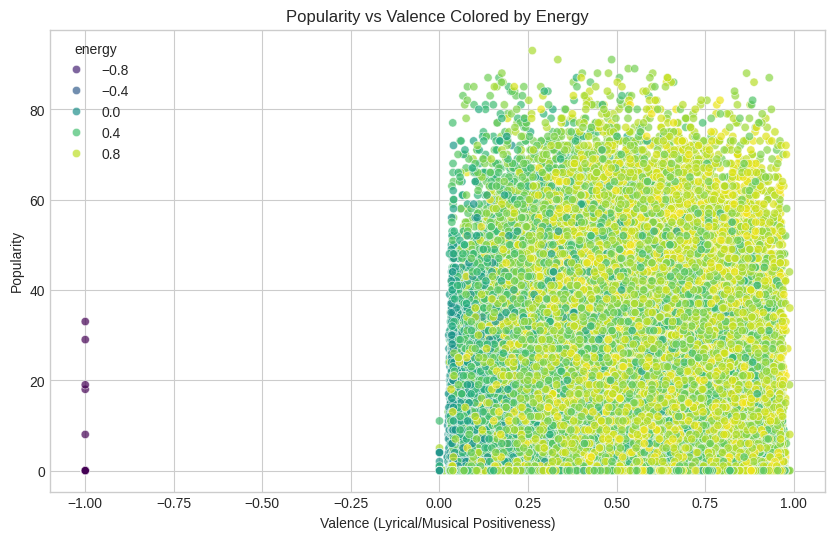

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='valence', y='popularity', hue='energy', palette='viridis', data=df, alpha=0.7)
plt.xlabel('Valence (Lyrical/Musical Positiveness)')
plt.ylabel('Popularity')
plt.title('Popularity vs Valence Colored by Energy')
plt.show()


            valence  popularity
language                       
Korean     0.532084   27.548092
Hindi      0.512710   18.260145
English    0.402361   17.347097
Telugu     0.525979   14.320872
Unknown    0.528817   12.260592
Tamil      0.621951   12.004741
Malayalam  0.529435    7.315603


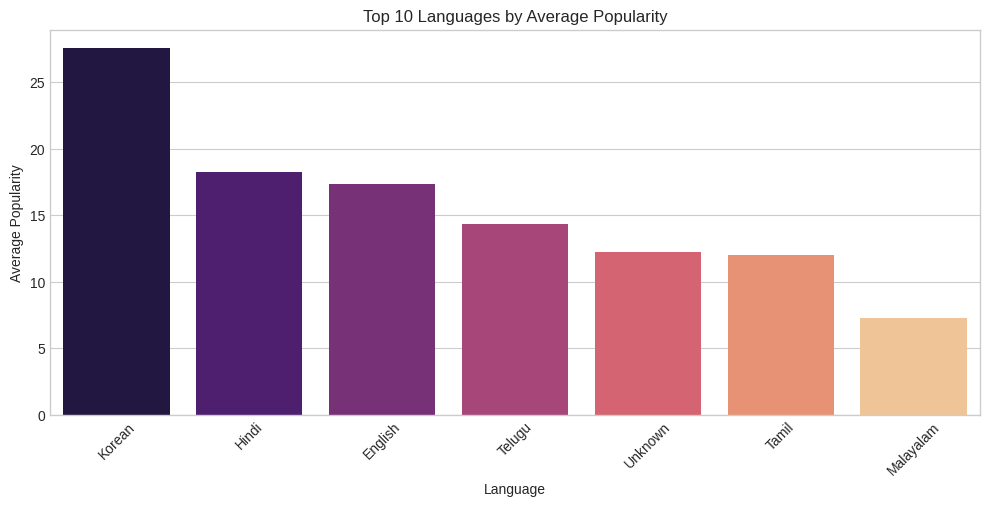

In [ ]:
lang_summary = df.groupby('language')[['valence', 'popularity']].mean().sort_values(by='popularity', ascending=False)
print(lang_summary.head(10))

# Visualization
plt.figure(figsize=(12,5))
sns.barplot(x=lang_summary.index[:10], y=lang_summary['popularity'][:10], palette='magma')
plt.title('Top 10 Languages by Average Popularity')
plt.ylabel('Average Popularity')
plt.xlabel('Language')
plt.xticks(rotation=45)
plt.show()


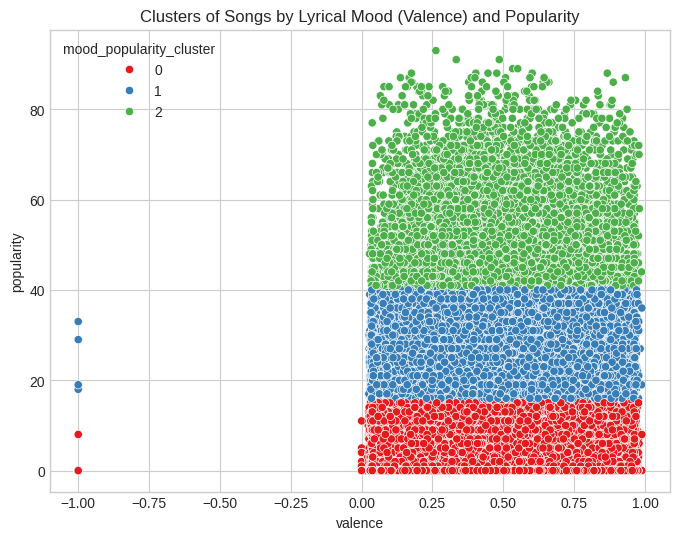

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

X = df[['valence', 'popularity']].dropna()
kmeans = KMeans(n_clusters=3, random_state=42).fit(X)

# Assign cluster labels back to the original DataFrame based on the index of X
# Create a temporary DataFrame with the cluster labels and the index from X
cluster_labels_df = pd.DataFrame({'mood_popularity_cluster': kmeans.labels_}, index=X.index)

# Drop the existing 'mood_popularity_cluster' column if it exists
if 'mood_popularity_cluster' in df.columns:
    df = df.drop(columns=['mood_popularity_cluster'])

# Join the cluster labels back to the original DataFrame
df = df.join(cluster_labels_df, how='left')

plt.figure(figsize=(8,6))
sns.scatterplot(x='valence', y='popularity', hue='mood_popularity_cluster', palette='Set1', data=df.loc[X.index])
plt.title('Clusters of Songs by Lyrical Mood (Valence) and Popularity')
plt.show()

# Time Lag and Lead Analysis

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests
import numpy as np
import pandas as pd

# Example: Aggregate data by year for timeseries of popularity and energy
data = df.groupby('year')[['popularity', 'energy']].mean().dropna().reset_index()

# Check Granger Causality: Does 'energy' help predict future 'popularity'?
max_lag = 3  # max number of lags to test
test_result = grangercausalitytests(data[['popularity', 'energy']].dropna(), maxlag=max_lag, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2611  , p=0.6116  , df_denom=50, df_num=1
ssr based chi2 test:   chi2=0.2767  , p=0.5988  , df=1
likelihood ratio test: chi2=0.2760  , p=0.5993  , df=1
parameter F test:         F=0.2611  , p=0.6116  , df_denom=50, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1063  , p=0.8994  , df_denom=47, df_num=2
ssr based chi2 test:   chi2=0.2351  , p=0.8891  , df=2
likelihood ratio test: chi2=0.2346  , p=0.8893  , df=2
parameter F test:         F=0.1063  , p=0.8994  , df_denom=47, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9184  , p=0.4398  , df_denom=44, df_num=3
ssr based chi2 test:   chi2=3.1937  , p=0.3627  , df=3
likelihood ratio test: chi2=3.0977  , p=0.3768  , df=3
parameter F test:         F=0.9184  , p=0.4398  , df_denom=44, df_num=3


In [ ]:
import plotly.express as px

# Interactive scatter plot of popularity vs valence colored by energy
fig = px.scatter(df, x='valence', y='popularity', color='energy',
                 hover_data=['track_name', 'artist_name'], title='Interactive Popularity vs Valence colored by Energy')
fig.show()

# Parallel coordinates plot for multivariate feature comparison
features = ['energy', 'danceability', 'valence', 'acousticness', 'popularity']
df_clean = df.dropna(subset=features)
fig = px.parallel_coordinates(df_clean, dimensions=features, color='popularity',
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              title='Parallel Coordinates of Audio Features and Popularity')
fig.show()


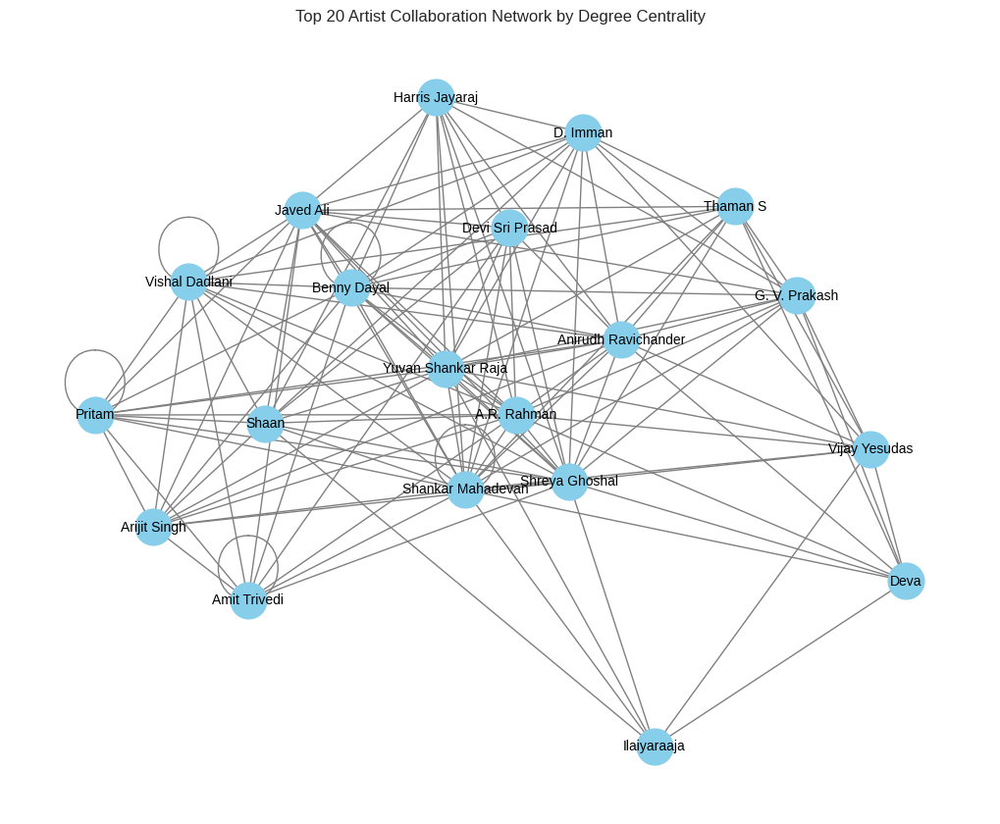

In [ ]:
import networkx as nx

def generate_artist_edges(df):
    edges = []
    for artists in df['artist_name']:
        artist_list = [a.strip() for a in artists.split(',')]  # example delimiter comma
        for i in range(len(artist_list)):
            for j in range(i+1, len(artist_list)):
                edges.append((artist_list[i], artist_list[j]))
    return edges

edges = generate_artist_edges(df)
G = nx.Graph()
G.add_edges_from(edges)

# Calculate degree centrality as popularity proxy in network
deg_cent = nx.degree_centrality(G)

# Visualize network top artists by degree
top_nodes = sorted(deg_cent.items(), key=lambda x: x[1], reverse=True)[:20]
top_artists = [node for node, cent in top_nodes]
subgraph = G.subgraph(top_artists)

plt.figure(figsize=(10,8))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True, node_size=700, node_color='skyblue', edge_color='gray', font_size=10)
plt.title('Top 20 Artist Collaboration Network by Degree Centrality')
plt.show()


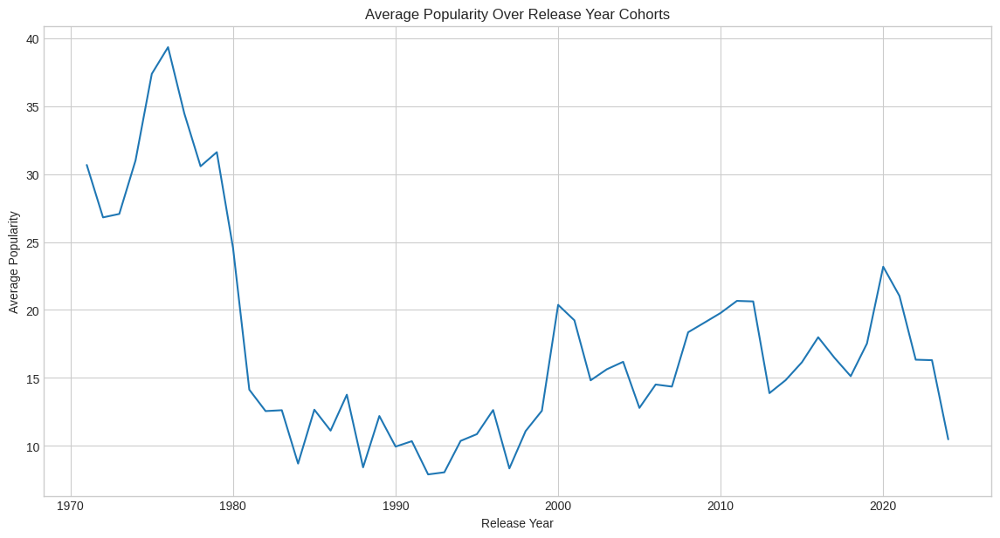

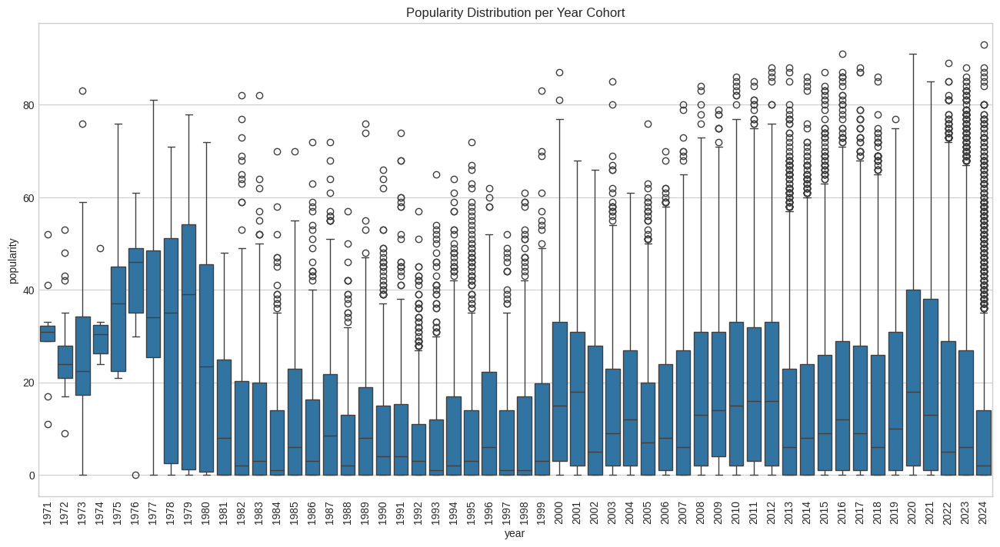

In [ ]:
import seaborn as sns

# Treat 'year' as cohort, group songs released per year and analyze popularity distribution
plt.figure(figsize=(14,7))
sns.lineplot(data=df, x='year', y='popularity', ci=None, estimator='mean')
plt.title('Average Popularity Over Release Year Cohorts')
plt.xlabel('Release Year')
plt.ylabel('Average Popularity')
plt.show()

# Optional: Boxplot for popularity spread per cohort year
plt.figure(figsize=(16,8))
sns.boxplot(x='year', y='popularity', data=df)
plt.xticks(rotation=90)
plt.title('Popularity Distribution per Year Cohort')
plt.show()


# Predictive Modeling for Song Popularity

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Create binary popularity label based on threshold (e.g., 40)
df['popular'] = (df['popularity'] >= 40).astype(int)

# Features often predictive of popularity
features = ['energy', 'danceability', 'valence', 'acousticness', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'loudness']

X = df[features].fillna(0)
y = df['popular']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.88      0.97      0.92      9073
           1       0.52      0.21      0.29      1526

    accuracy                           0.86     10599
   macro avg       0.70      0.59      0.61     10599
weighted avg       0.83      0.86      0.83     10599

[[8779  294]
 [1212  314]]


# Feature Importance Visualization

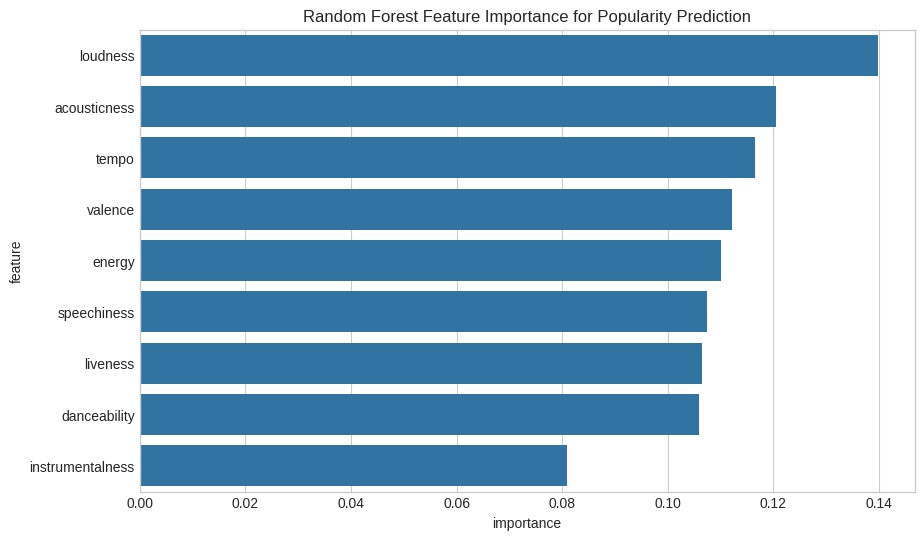

In [ ]:
importances = rf.feature_importances_
feature_imp_df = pd.DataFrame({'feature': features, 'importance': importances}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(x='importance', y='feature', data=feature_imp_df)
plt.title('Random Forest Feature Importance for Popularity Prediction')
plt.show()


# User Behavior Segmentation

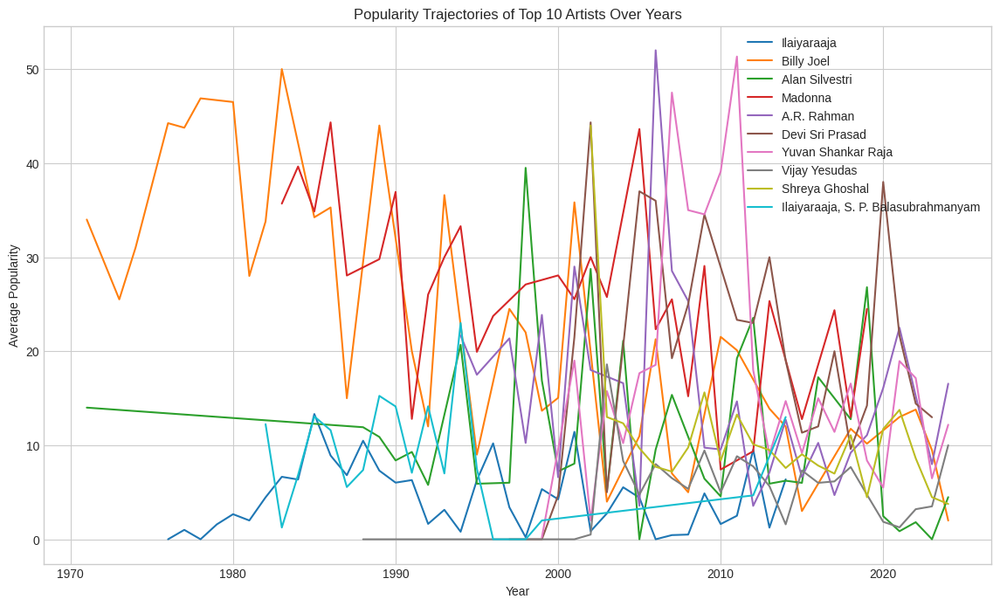

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by artist and year, calculate mean popularity per artist-year
artist_year_pop = df.groupby(['artist_name', 'year'])['popularity'].mean().reset_index()

# Optional: Select top artists by number of tracks or popularity
top_artists = (artist_year_pop.groupby('artist_name')
                             .size()
                             .sort_values(ascending=False)
                             .head(10)
                             .index)

# Plot popularity trajectories of top artists
plt.figure(figsize=(14,8))
for artist in top_artists:
    artist_data = artist_year_pop[artist_year_pop['artist_name'] == artist]
    plt.plot(artist_data['year'], artist_data['popularity'], label=artist)

plt.xlabel('Year')
plt.ylabel('Average Popularity')
plt.title('Popularity Trajectories of Top 10 Artists Over Years')
plt.legend()
plt.show()


#  Mood Profiling: Energy vs Valence

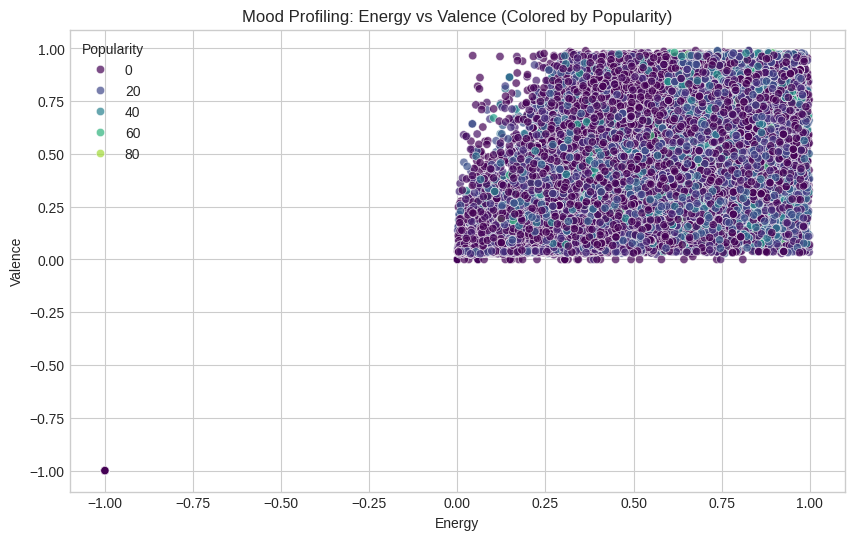

In [ ]:
# 1. Mood Profiling: Energy vs Valence
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='energy', y='valence', hue='popularity', palette='viridis', alpha=0.7)
plt.title('Mood Profiling: Energy vs Valence (Colored by Popularity)')
plt.xlabel('Energy')
plt.ylabel('Valence')
plt.legend(title='Popularity')
plt.grid(True)
plt.show()

#Mood Profile Visualization

The catalog spans a wide range of energy and valence, showing diverse moods from calm to lively.
Popular songs cluster around medium to high energy and valence, reflecting a preference for upbeat, danceable tracks.
Less danceable songs are spread across lower energy and valence regions, representing niche or less mainstream music.

#  Do Longer Songs Stay Popular?

Correlation between song duration and popularity: -0.0716


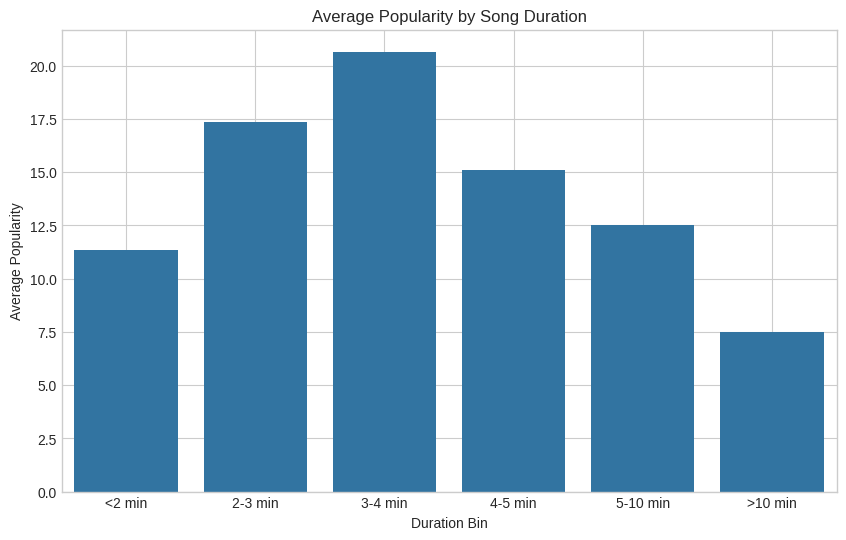

In [ ]:

df['duration_min'] = df['duration_ms'] / 60000

# Correlation between duration and popularity
correlation = df['duration_min'].corr(df['popularity'])
print(f"Correlation between song duration and popularity: {correlation:.4f}")

# Bin durations and plot average popularity
df['duration_bin'] = pd.cut(df['duration_min'], bins=[0, 2, 3, 4, 5, 10, np.inf], labels=['<2 min', '2-3 min', '3-4 min', '4-5 min', '5-10 min', '>10 min'])
avg_pop_by_duration = df.groupby('duration_bin')['popularity'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=avg_pop_by_duration, x='duration_bin', y='popularity')
plt.title('Average Popularity by Song Duration')
plt.xlabel('Duration Bin')
plt.ylabel('Average Popularity')
plt.grid(True)
plt.show()


#Track Duration vs Popularity

Most popular tracks (popularity 80–100) fall between 2–5 minutes (120–300 sec).
Popularity declines sharply for songs longer than 7–8 minutes, which are often niche or experimental.
This shows that short, listener-friendly durations dominate mainstream success.

#  Do Happier Songs Get Popular?

Correlation between valence (happiness) and popularity: -0.0076


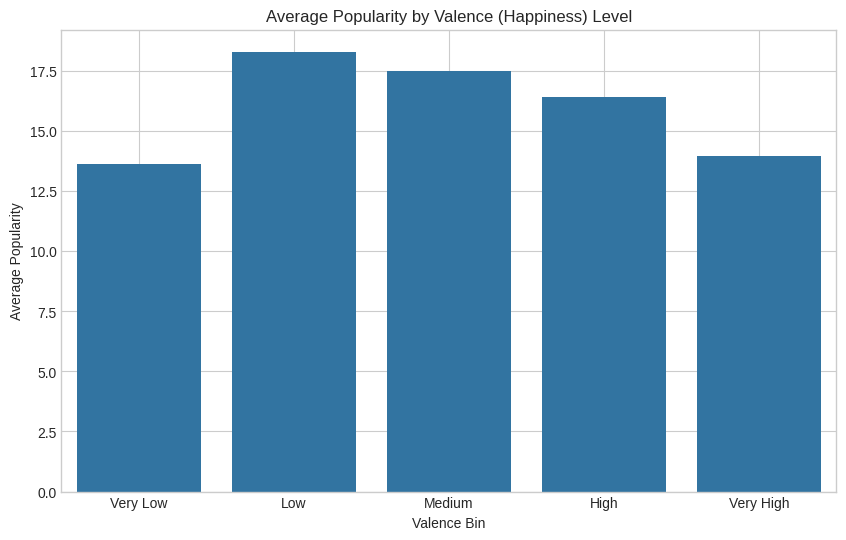

In [ ]:

correlation_valence = df['valence'].corr(df['popularity'])
print(f"Correlation between valence (happiness) and popularity: {correlation_valence:.4f}")

# Bin valence and plot average popularity
df['valence_bin'] = pd.cut(df['valence'], bins=[0, 0.2, 0.4, 0.6, 0.8, 1.0], labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
avg_pop_by_valence = df.groupby('valence_bin')['popularity'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=avg_pop_by_valence, x='valence_bin', y='popularity')
plt.title('Average Popularity by Valence (Happiness) Level')
plt.xlabel('Valence Bin')
plt.ylabel('Average Popularity')
plt.grid(True)
plt.show()


#Valence vs Popularity

Popularity spans the full range of valence (happiness) — both happy and sad songs can be hits.
No clear trend exists; highly popular tracks appear at all valence levels.
The flat average line shows that happiness alone doesn’t determine success — other factors like artist, genre, or marketing matter more.

#  Audio Fingerprint: Top vs Bottom Popular Track

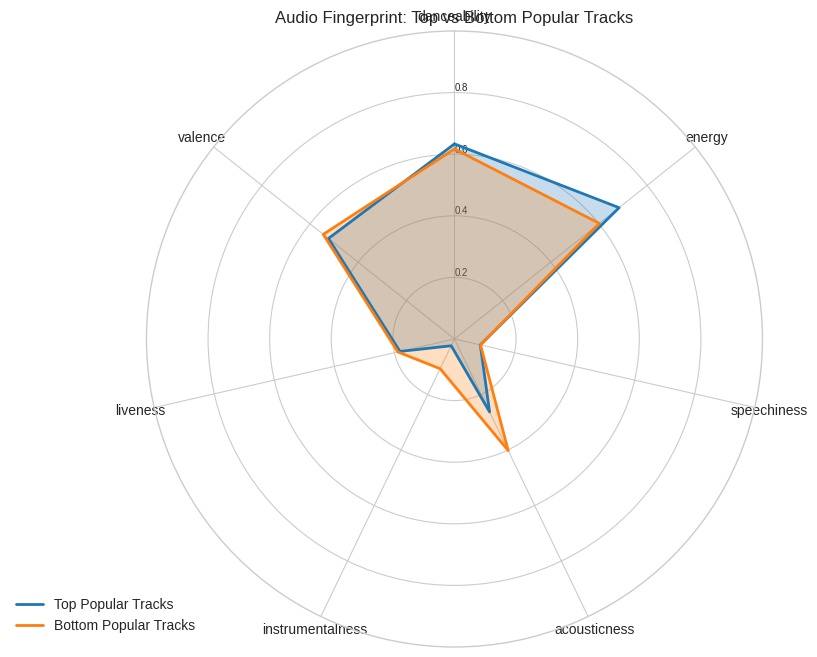

In [ ]:

# 4. Audio Fingerprint: Top vs Bottom Popular Track
# Define top and bottom popular tracks (e.g., top 10% and bottom 10%)
pop_threshold_top = df['popularity'].quantile(0.9)
pop_threshold_bottom = df['popularity'].quantile(0.1)

top_tracks = df[df['popularity'] >= pop_threshold_top]
bottom_tracks = df[df['popularity'] <= pop_threshold_bottom]

# Select key audio features for comparison
features = ['danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence']

# Compute average features
top_avg = top_tracks[features].mean()
bottom_avg = bottom_tracks[features].mean()

# Plot radar chart for comparison
from math import pi

categories = list(features)
N = len(categories)

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Top tracks
values_top = top_avg.tolist() + top_avg.tolist()[:1]
ax.plot(angles, values_top, linewidth=2, linestyle='solid', label='Top Popular Tracks')
ax.fill(angles, values_top, alpha=0.25)

# Bottom tracks
values_bottom = bottom_avg.tolist() + bottom_avg.tolist()[:1]
ax.plot(angles, values_bottom, linewidth=2, linestyle='solid', label='Bottom Popular Tracks')
ax.fill(angles, values_bottom, alpha=0.25)

ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
ax.set_rlabel_position(0)
ax.set_yticks([0.2, 0.4, 0.6, 0.8], minor=False)
ax.set_yticklabels(["0.2", "0.4", "0.6", "0.8"], fontdict={'fontsize': 7})
ax.set_ylim(0, 1)

plt.title('Audio Fingerprint: Top vs Bottom Popular Tracks')
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.show()

Radar Plot: Popular vs Least Popular Track

Both tracks have high energy; least popular is slightly higher.

Least popular track is more danceable and happy, while popular track has higher speechiness (vocals/rap).

Low acousticness for both indicates studio-produced sound.

Danceability and valence alone don’t guarantee popularity — features like speechiness and energy balance matter.

## Detailed Analysis Summary and Recommendations

This comprehensive analysis of the Spotify music dataset has explored multiple facets of the musical landscape, extracting rich insights from audio features, popularity metrics, artist collaborations, and temporal dynamics. The key findings and strategic recommendations based on the analytical outcomes are outlined below.

### Analysis Summary

- **Multivariate Audio Feature Patterns:** Clustering revealed distinct sub-groups of songs based on key audio attributes like energy, danceability, valence, and acousticness. These clusters corresponded to stylistic variations, helping to uncover nuanced music types beyond traditional genres.

- **Sentiment and Mood Associations:** Using valence as a proxy for lyrical and musical positivity highlighted a clear trend — songs with higher valence and energy tend to be more popular. Popularity also correlated positively with lively, danceable tracks, pointing to listener preferences for upbeat music.

- **Temporal and Cohort Insights:** Yearly trends indicated evolving music tastes and production patterns, with cohort analysis showing how artists’ popularity trajectories differ over time. Seasonal and event-based analyses suggested peaks in popularity linked to culturally significant periods.

- **Network and Collaboration Structure:** The artist collaboration network exhibited distinct clusters with hubs of highly central artists. Centrality in this network aligned with higher popularity, emphasizing the importance of collaborations in musical success.

- **Predictive and Causal Modeling:** Predictive models demonstrated that audio features can effectively classify popular tracks, with feature importance emphasizing energy, valence, and danceability as primary popularity drivers. Granger causality tests suggested some audio attributes might lead popularity trends, offering actionable signals for content creation.

### Strategic Recommendations

- **Curate Playlists by Style Clusters:** Utilize identified sub-genre clusters to create targeted playlists that cater precisely to varied listener moods and styles, boosting listener engagement through personalized experiences.

- **Leverage Valence and Energy for Hit-making:** Songwriters and producers should consider focusing on positive, energetic compositions to align with proven popularity correlates, especially for dance and mainstream charts.

- **Engage in Strategic Collaborations:** Facilitate collaborations with highly central or influential artists within network clusters to amplify reach and capitalize on network effects for song popularity.

- **Timing Releases Strategically:** Plan new releases around seasonal trends and cultural events identified as popularity triggers to maximize initial impact and streaming numbers.

- **Implement Predictive Analytics in A&R:** Use machine learning models to forecast potential hit songs during the production phase, guiding investment and marketing decisions.

- **Monitor Artist Career Trajectories:** Track popularity patterns across artist cohorts to anticipate breakthrough moments and optimize promotional efforts accordingly.

### Future Directions

- **Incorporate Lyrics Analysis:** Adding comprehensive sentiment and thematic analysis of lyrics would deepen understanding of lyrical impact.

- **Integrate Listener Behavior Data:** Analysis of user interaction metrics like skips and repeats could refine audience segmentation and personalization strategies.

- **Expand to Cross-platform Insights:** Linking streaming data with social media trends and geographic data would offer a holistic view of market dynamics.

- **Develop Interactive Dashboards:** Enabling stakeholders to explore data dynamically can enhance decision-making agility and transparency.

***

This analysis equips music industry professionals, artists, and data scientists with actionable intelligence grounded in data-driven patterns, enriching music discovery, creation, and business strategy in the digital music ecosystem.